In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import json
from collections import defaultdict
# import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objects as go

import nltk
from nltk.corpus import wordnet 
nltk.download('stopwords')
from nltk.corpus import stopwords
# import spacy

import time
import string


# from sklearn.

# MODELS
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier

# EVALUATION METRICS and TOOLS
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import classification_report


# OTHER TOOLS
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import  HalvingGridSearchCV, RepeatedStratifiedKFold, cross_val_score, train_test_split

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from utils import main as utils, plots, preprocessing


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\alhas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Needed functions

In [2]:

with open("data/id_to_label.json", "r") as f:
    # Write the dictionary to the file in JSON format
    id_to_label = json.load(f)

In [3]:
def get_related_words(words):
    related_words = set(words)
    for word in words:
        for sset in wordnet.synsets(word):
            
            for hypernym in sset.hypernyms():
                [related_words.add(n) for n in hypernym.lemma_names()]
        
            for hyponym in sset.hyponyms():
                [related_words.add(n) for n in hyponym.lemma_names()]

    return related_words

In [4]:
def train_model(model,
                X_train, y_train,
                X_test, y_test, 
                **kwargs,
                # exclude, 
                # verbose=False
               ):
        
    if model == 'RF':
        clf = RandomForestClassifier(n_estimators=100)
    # pipe = make_pipeline(StandardScaler(with_mean=False), LogisticRegression(max_iter=10000))  
    elif model == 'LR':
        clf = LogisticRegression(max_iter=10000)
    elif model == 'SVM':
        clf = svm.LinearSVC(C=1.0)
    elif model == 'KN':
        clf = make_pipeline(StandardScaler(with_mean=False),
             KNeighborsClassifier(n_neighbors=16))

    if kwargs.get('verbose'):
        print("#"*10, f"Training {clf.__class__.__name__}\n")

    
    vectorizer = TfidfVectorizer(
        sublinear_tf=True, 
        max_df=0.5, 
        min_df=5, 
        tokenizer=lambda doc: preprocessing.tokenize_data(doc, exclude=kwargs.get('exclude'), stopwords=kwargs.get('stopwords')),
        # stop_words="english"
    )
                    
    
    X_train_trasformed = vectorizer.fit_transform(X_train)

    clf.fit(X_train_trasformed, y_train)
    
    X_test_transformed = vectorizer.transform(X_test)
    
    score = clf.score(X_test_transformed, y_test)
    pred = clf.predict(X_test_transformed)
    
    
    feature_names = vectorizer.get_feature_names_out()
                    
    # if verbose:
    if kwargs.get('verbose'):
        print("#"*10, score)
    
    
    return clf, pred, score, X_train_trasformed, feature_names

In [5]:
def run(models=['LR', 'RF', 'SVM', 'KN'], **kwargs):
    # for cat in categories:
# for cat in [224, 226]:
    # print(cat)
    
    exact = kwargs.get('exact') and kwargs.get('specific_cat')
    kwargs['exact'] = exact
    
    # Load data
    df, X_train, X_test, y_train, y_test, target_names = utils.load_dataset('data/en_data.csv',
                                                                                           target_label='ocms',
                                                                                           **kwargs)
    # print(df[df.index.duplicated(keep=False)].textrecord)


    
    if kwargs.get('verbose'):
        sns.histplot([f'{id_to_label[i]} ({i})' for i in df['ocms']])
        plt.xticks(rotation=90)
        plt.show()
            
        
    dfs = []
    
    # duplicate_indices = y_test.index.duplicated() # Check for duplicate indices in y_test
    # if any(duplicate_indices):
    #     _y_test = y_test[~duplicate_indices]

    # print(y_test.loc[y_test.duplicated(), :])
    # y_test.drop_duplicates(inplace=True)

    df_out = df.loc[y_test.index]
    # df_out = X_test.copy()
    # print(X_test)
    # print('DUPLICATED', any(df_out.index.duplicated()))
    # print(df_out['ocms'].value_counts(), len(y_test))
    top_indicators = defaultdict(list)
    # Run models
    for model in models:
        print('#'*10, kwargs.get('cat'), model, '\n')
            
        clf, pred, score, X_train_transformed, feature_names = train_model(model, 
                                            X_train, y_train,
                                            X_test, y_test,
                                            **kwargs
                                            # kwargs.get('exclude'), kwargs.get('stopwords'),
                                            # verbose=True
                                       )
        
        y_pred  = pd.DataFrame(pred)

        df_out[f'predicted_{model}'] = pred

        if kwargs.get('verbose'):
            report = classification_report(y_test, pred, digits = 3)
            print(report)
            
        cm = plots.make_cm(clf, pred, y_test, target_names, to_labels=id_to_label)
        culture_plot = plots.plot_per_culture(df_out, model, top_k=10)
        
        if model == 'RF':
            # plots.plot_feature_effects(clf, X_train, fn, tn)  
            indicators = plots.plot_feature_importance(clf.feature_importances_, feature_names, 'RF')    
            # plot_feature_importance(clf, feature_names, target_names,  top_k=5)    
        else:
            if clf.coef_.shape[0] > 1:
                indicators = plots.plot_feature_effects_detailed(clf, X_train_transformed, feature_names, target_names, to_labels=id_to_label)#, top_k=5) 
            else:
                indicators = plots.plot_feature_effects(clf, X_train_transformed, feature_names, target_names, to_labels=id_to_label)#, top_k=10)
        top_indicators[model] = indicators
    return df_out, top_indicators

In [6]:
def get_common_indicators(top_indicators):
    # Get the list of arrays from the top_indicators values
    arrays = list(top_indicators.values())

    # Get the intersection of all arrays
    shared_elements = set(arrays[0]).intersection(*arrays)

    # Create a list to preserve the order of shared elements
    shared_elements_ordered = [x for x in arrays[0] if x in shared_elements]
    return shared_elements_ordered
    

In [7]:
def iterative_process(iterations=3, common_indicators=True, **kwargs):
    results = kwargs.get('results', defaultdict(dict))
    top_indicators = kwargs.get('top_indicators', set())
    
    for i in range(iterations):
        print(f"Iteration {i+1}\nExclude: {top_indicators}\n")
        
    
        df, curr_indicators  = run(exclude=top_indicators,
                                  **kwargs)
        
        arrays = list(curr_indicators.values())
        if common_indicators:
            top_indicators.update(set(arrays[0]).intersection(*arrays))
        else:    
            top_indicators.update(set(arrays[0]).union(*arrays))

        results[i]['df'] = df
        results[i]['indicators'] = top_indicators
    return results

# Specific categories

### 224 and 226

for b in [True, False]:
    print('Balanced:', b)
    results = iterative_process(models=['LR', 'SVM', 'RF'], 
                                common_indicators=False,
                                chosen_categories=[224, 226],
                                # chosen_categories=[222, 220],
                                balanced=b,
                                verbose=True)

Iteration 1
Exclude: set()

(5750,) (5750,)
5750 documents - 2.57MB (training set)
2 categories


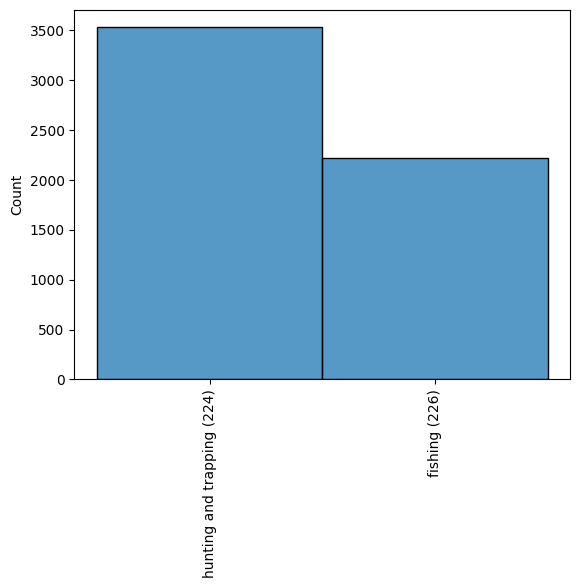

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


########## 0.9263768115942029
              precision    recall  f1-score   support

         224      0.901     0.987     0.942      1046
         226      0.976     0.834     0.899       679

    accuracy                          0.926      1725
   macro avg      0.939     0.910     0.921      1725
weighted avg      0.931     0.926     0.925      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


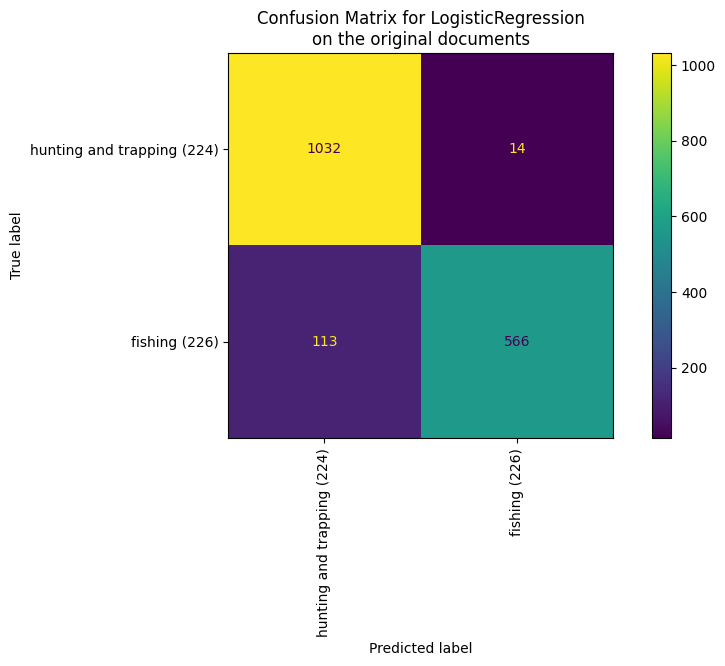

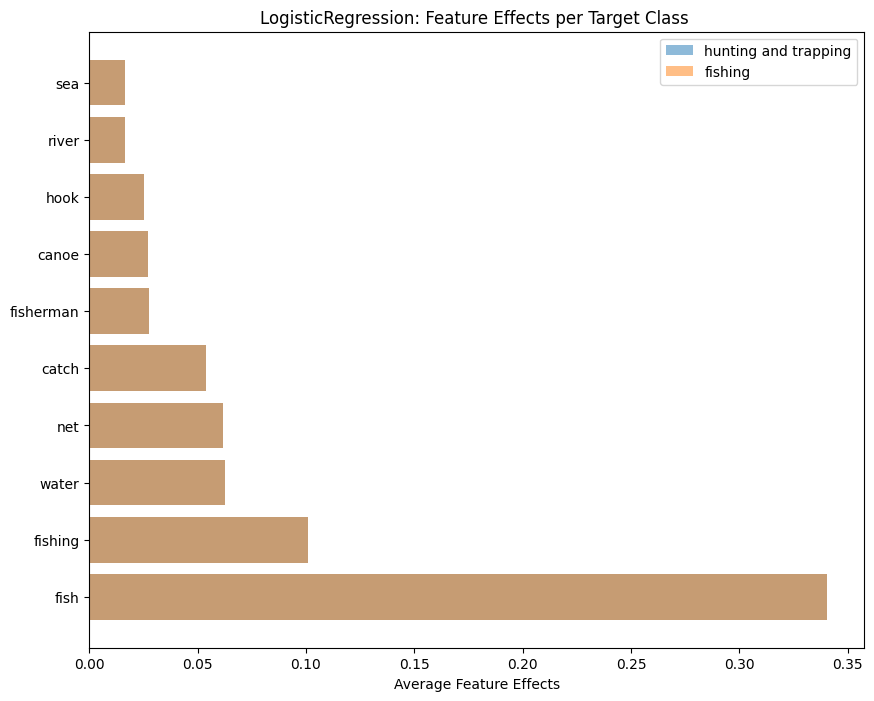

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.9333333333333333
              precision    recall  f1-score   support

         224      0.917     0.979     0.947      1046
         226      0.964     0.863     0.911       679

    accuracy                          0.933      1725
   macro avg      0.940     0.921     0.929      1725
weighted avg      0.935     0.933     0.933      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



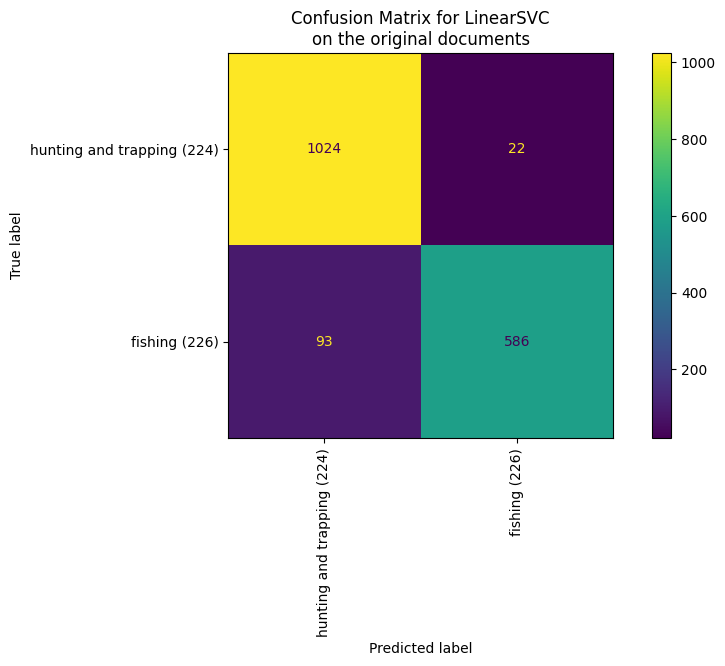

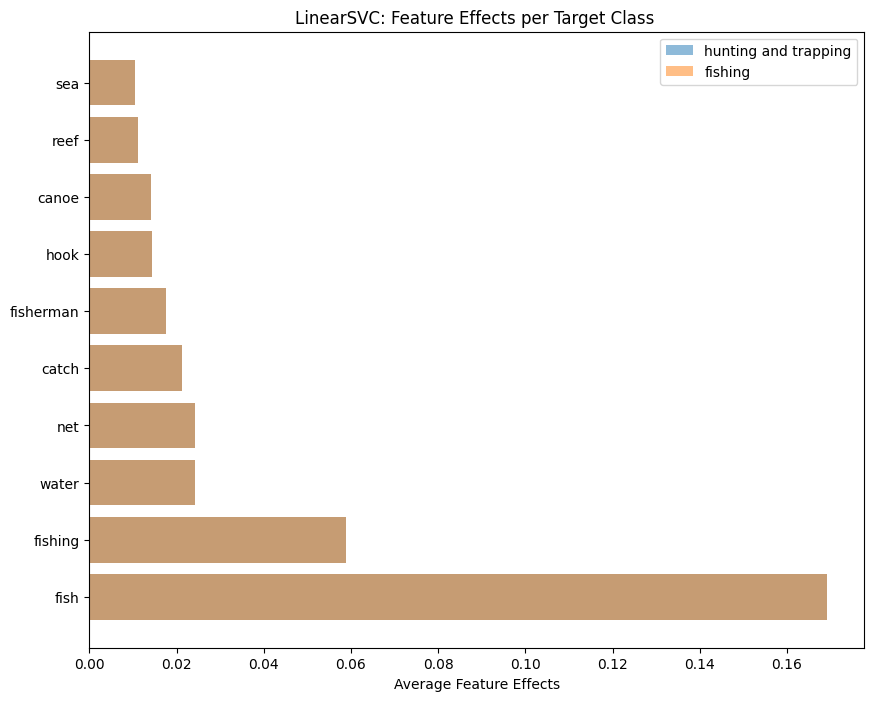

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.9298550724637681
              precision    recall  f1-score   support

         224      0.913     0.978     0.944      1046
         226      0.962     0.856     0.906       679

    accuracy                          0.930      1725
   macro avg      0.937     0.917     0.925      1725
weighted avg      0.932     0.930     0.929      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


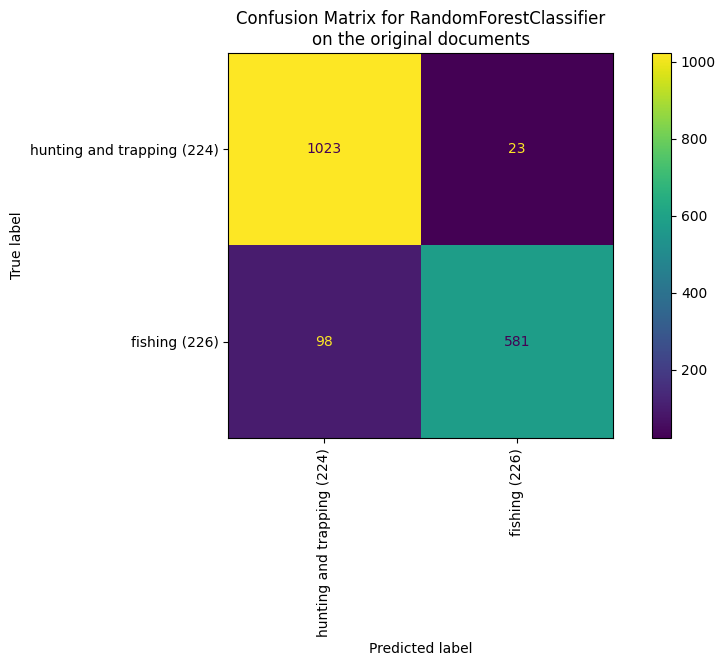

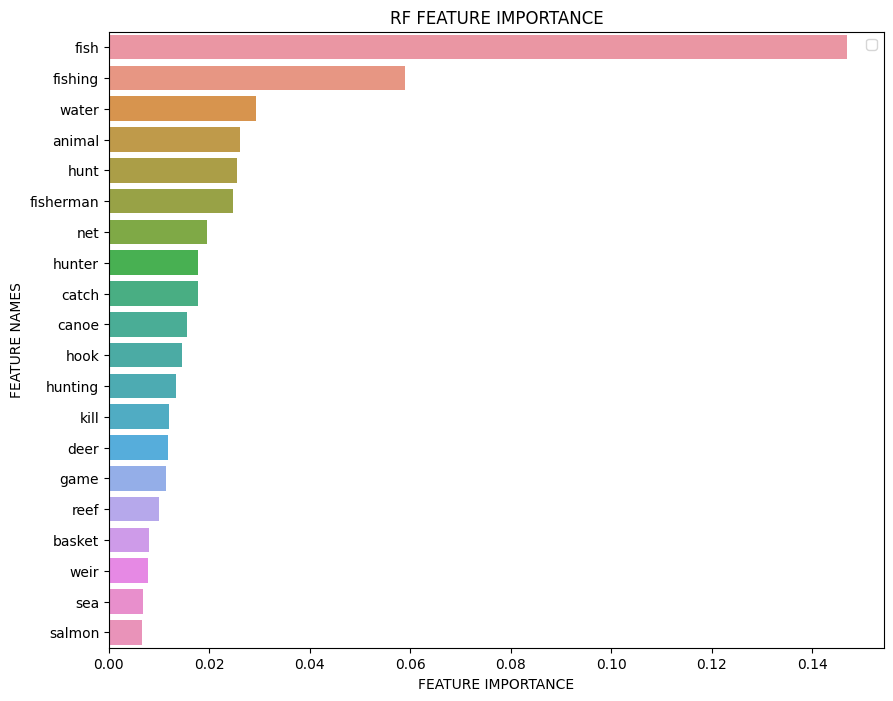

Iteration 2
Exclude: {'deer', 'water', 'reef', 'sea', 'hook', 'fisherman', 'salmon', 'net', 'canoe', 'weir', 'hunter', 'animal', 'catch', 'river', 'game', 'kill', 'fishing', 'basket', 'hunt', 'fish', 'hunting'}

(5750,) (5750,)
5750 documents - 2.57MB (training set)
2 categories


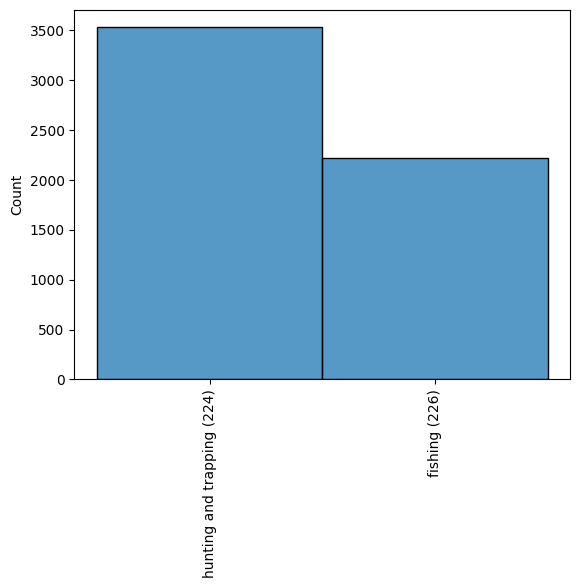

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8771014492753623
              precision    recall  f1-score   support

         224      0.847     0.972     0.905      1044
         226      0.945     0.731     0.825       681

    accuracy                          0.877      1725
   macro avg      0.896     0.852     0.865      1725
weighted avg      0.886     0.877     0.873      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



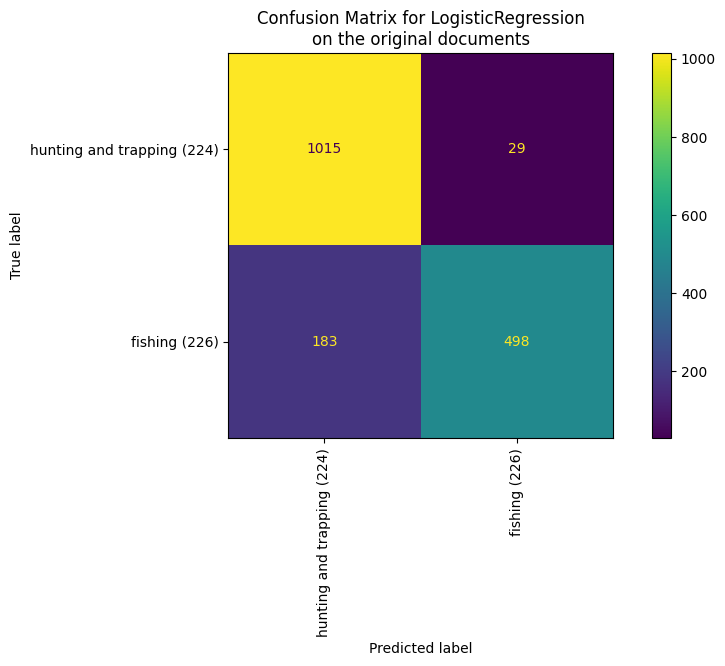

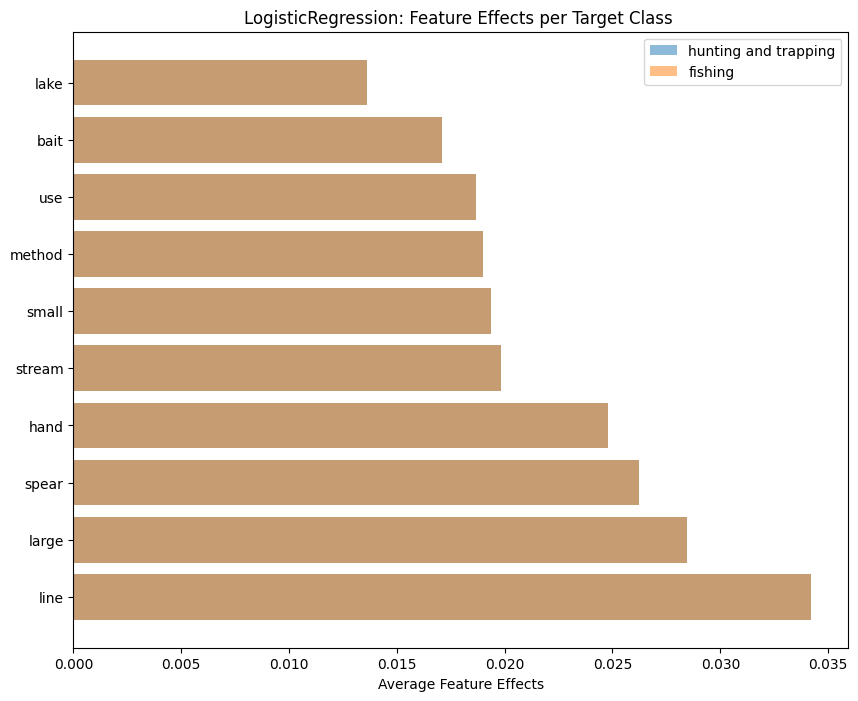

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8817391304347826
              precision    recall  f1-score   support

         224      0.866     0.952     0.907      1044
         226      0.913     0.774     0.838       681

    accuracy                          0.882      1725
   macro avg      0.890     0.863     0.872      1725
weighted avg      0.885     0.882     0.880      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



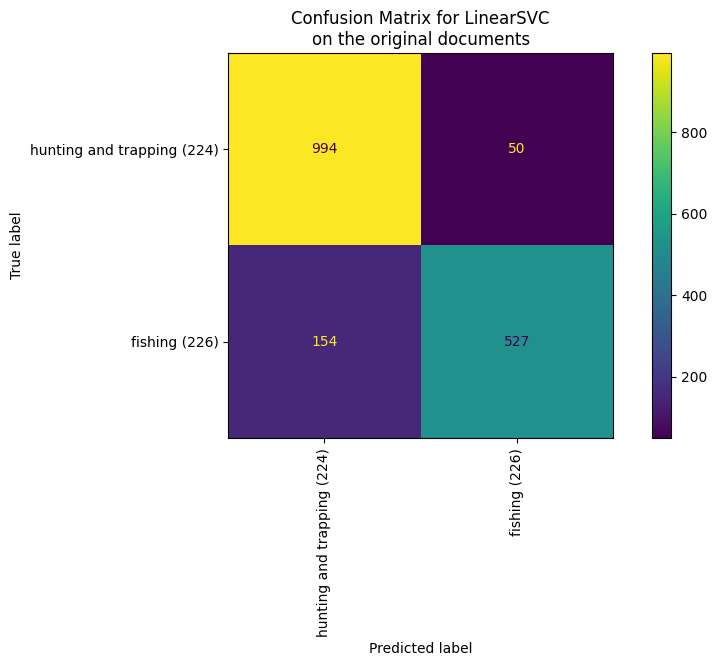

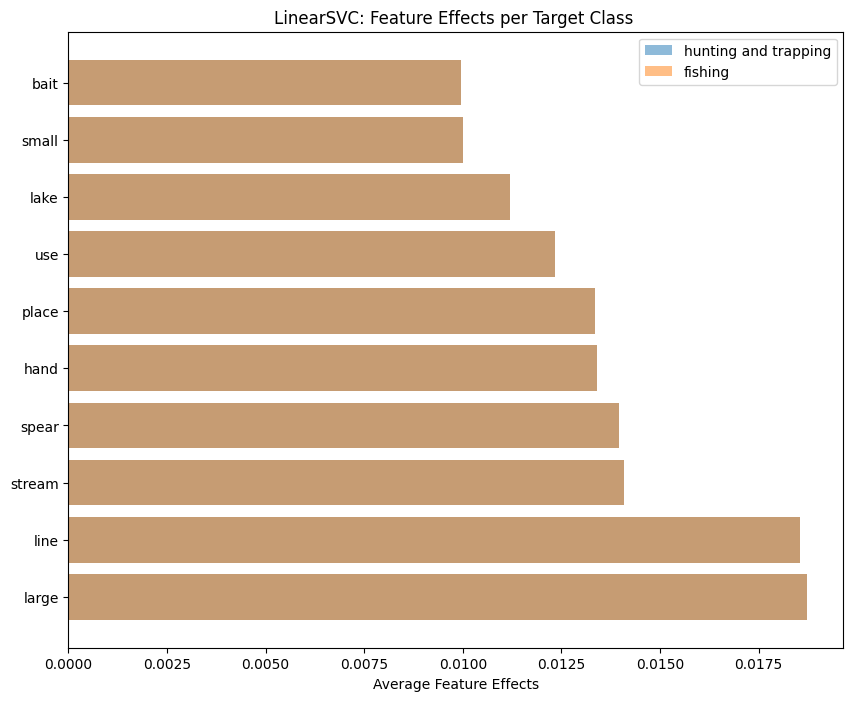

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8684057971014493
              precision    recall  f1-score   support

         224      0.848     0.954     0.898      1044
         226      0.913     0.737     0.816       681

    accuracy                          0.868      1725
   macro avg      0.880     0.846     0.857      1725
weighted avg      0.873     0.868     0.865      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


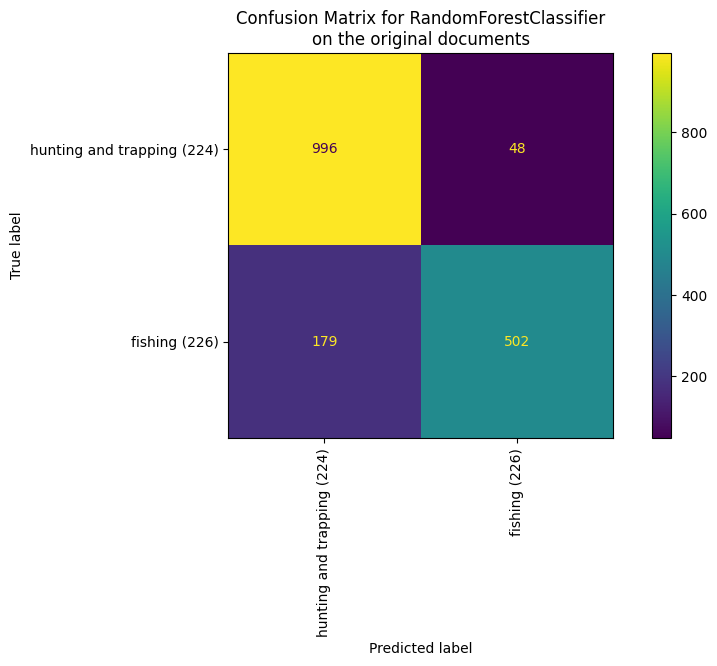

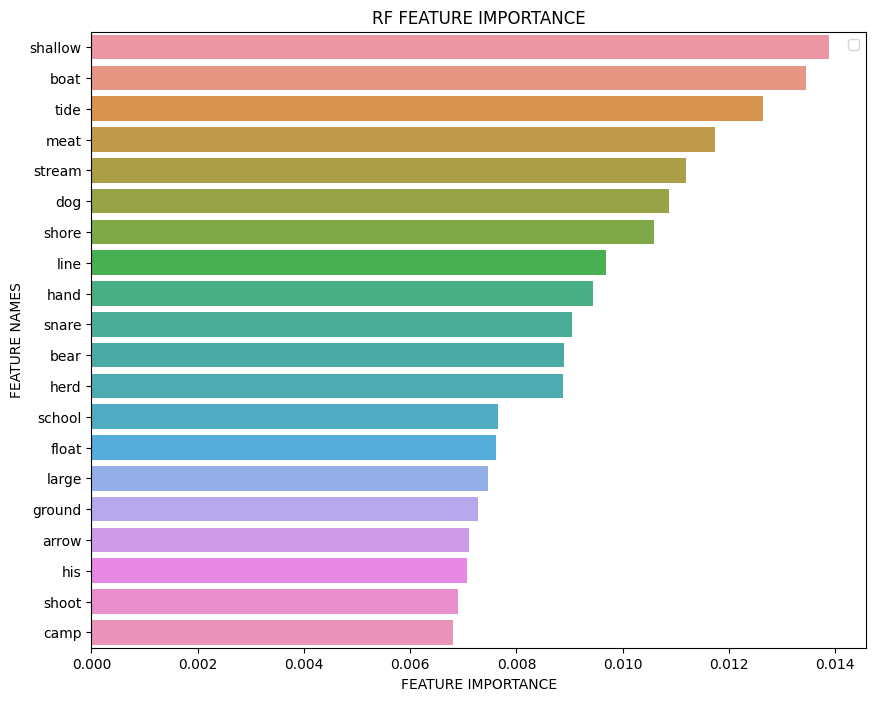

Iteration 3
Exclude: {'deer', 'reef', 'shallow', 'dog', 'place', 'ground', 'camp', 'meat', 'method', 'fisherman', 'net', 'canoe', 'weir', 'hunter', 'tide', 'snare', 'catch', 'river', 'large', 'boat', 'bear', 'herd', 'his', 'spear', 'hand', 'fish', 'water', 'sea', 'hook', 'float', 'bait', 'small', 'stream', 'salmon', 'use', 'animal', 'shore', 'shoot', 'lake', 'game', 'kill', 'fishing', 'basket', 'school', 'hunt', 'arrow', 'hunting', 'line'}

(5750,) (5750,)
5750 documents - 2.57MB (training set)
2 categories


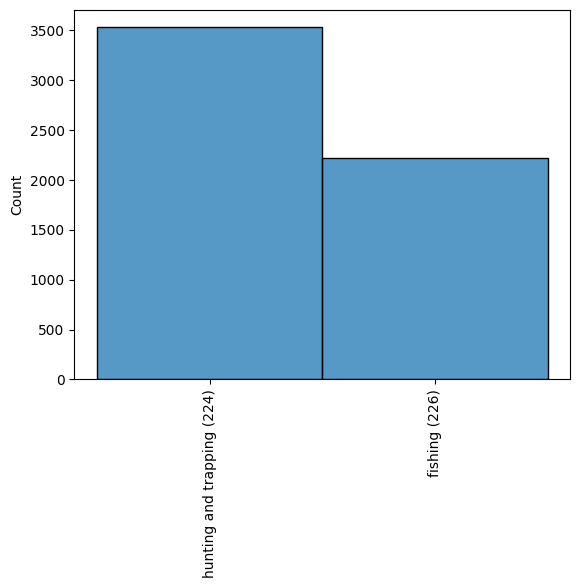

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8620289855072464
              precision    recall  f1-score   support

         224      0.832     0.966     0.894      1039
         226      0.932     0.704     0.802       686

    accuracy                          0.862      1725
   macro avg      0.882     0.835     0.848      1725
weighted avg      0.872     0.862     0.858      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



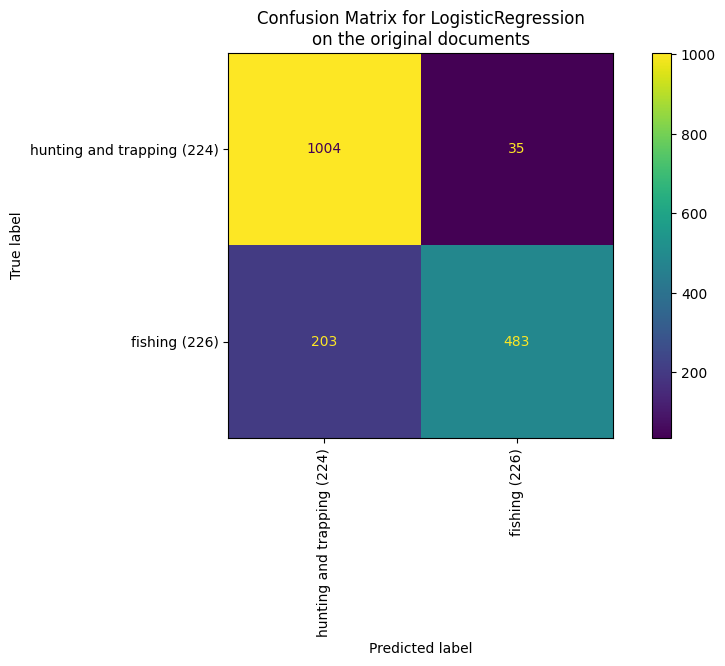

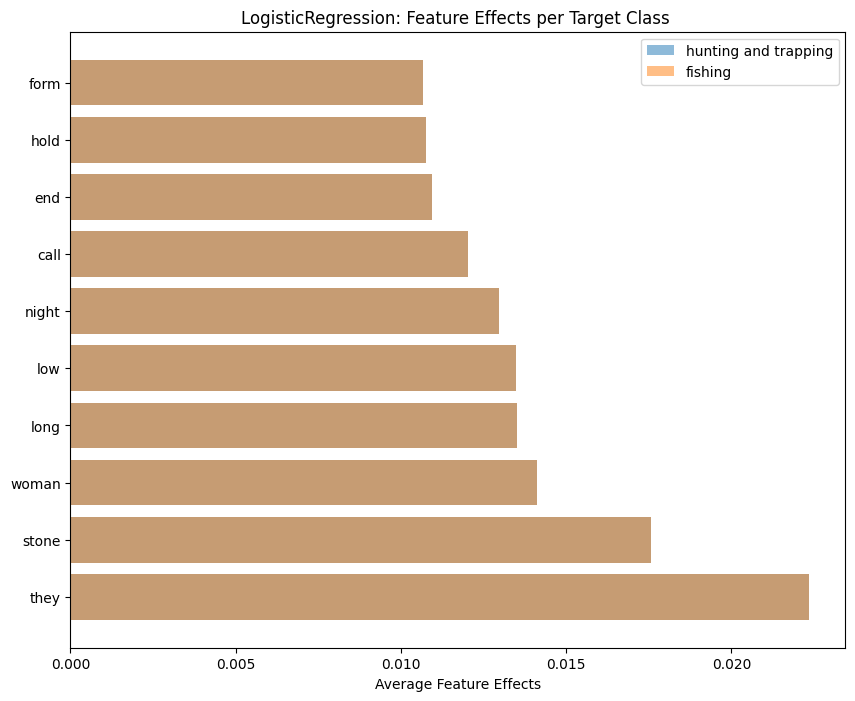

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8568115942028985
              precision    recall  f1-score   support

         224      0.847     0.930     0.887      1039
         226      0.875     0.746     0.806       686

    accuracy                          0.857      1725
   macro avg      0.861     0.838     0.846      1725
weighted avg      0.858     0.857     0.854      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



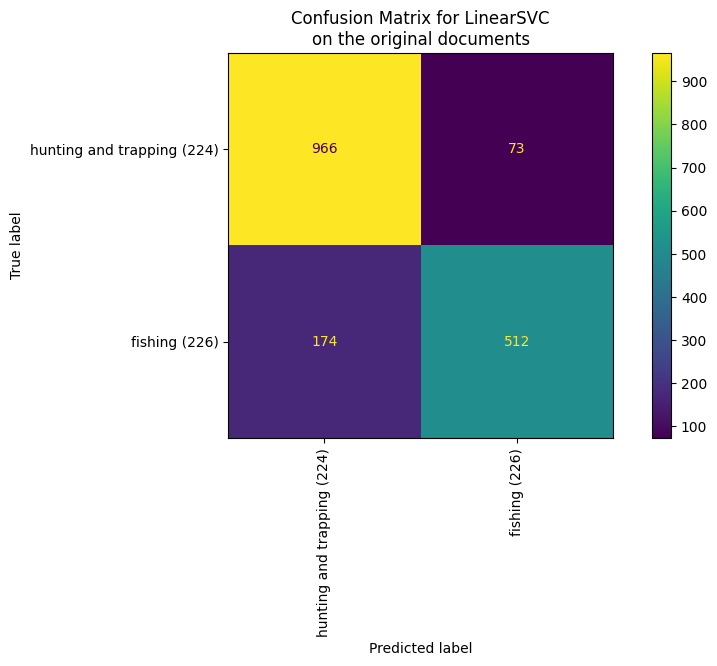

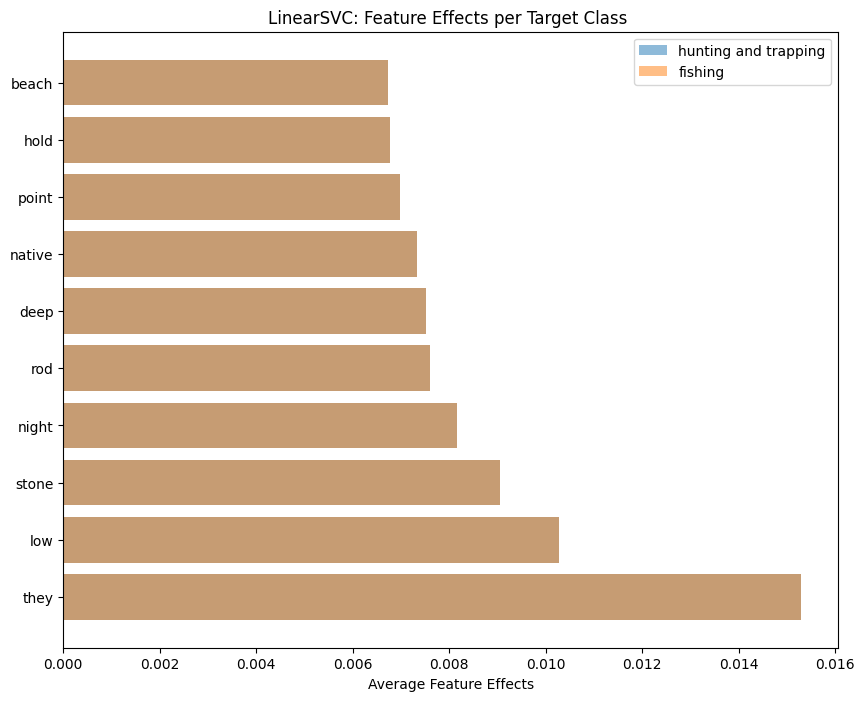

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8591304347826086
              precision    recall  f1-score   support

         224      0.838     0.950     0.890      1039
         226      0.905     0.722     0.803       686

    accuracy                          0.859      1725
   macro avg      0.871     0.836     0.847      1725
weighted avg      0.865     0.859     0.856      1725



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


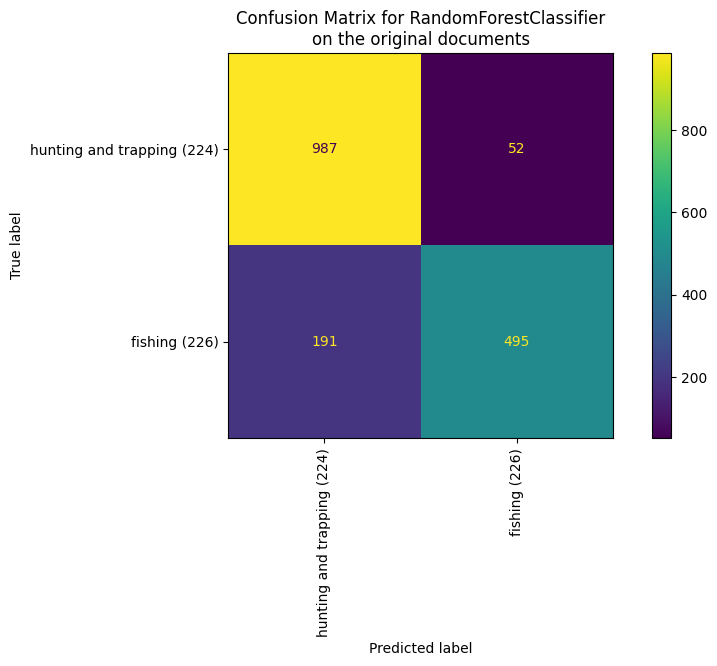

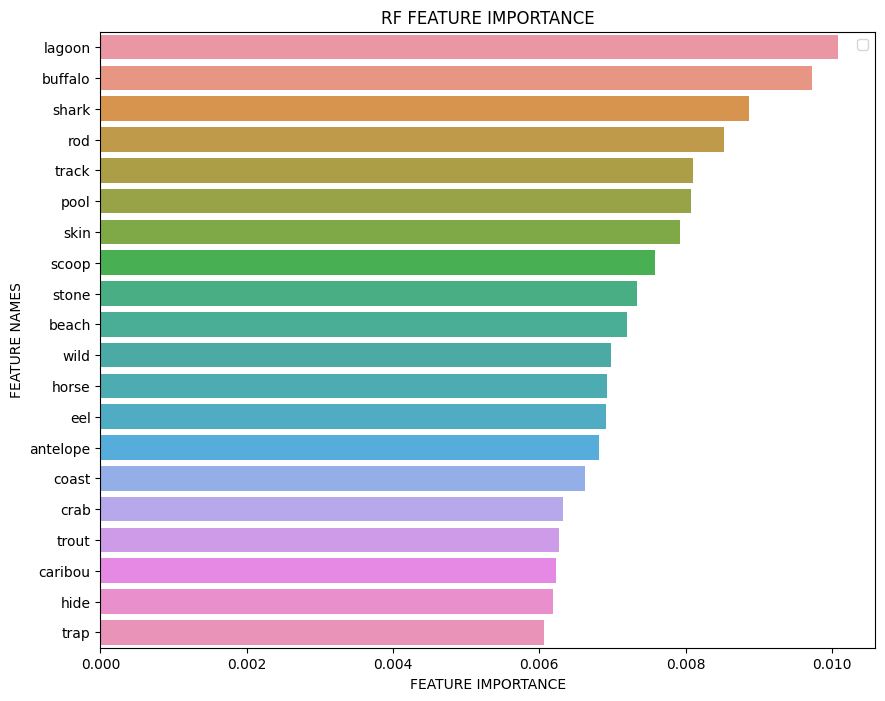

In [8]:
results = iterative_process(models=['LR', 'SVM', 'RF'], 
                            common_indicators=False,
                            chosen_categories=[224, 226],
                            # chosen_categories=[222, 220],
                            balanced=False,
                            verbose=True)

In [9]:
results

defaultdict(dict,
            {0: {'df':         Unnamed: 0            sreid          section          sectpar   
              126192      137392  nu33-012-009057  nu33-012-008812  nu33-012-008430  \
              152807      167466  or21-002-000978  or21-002-000088              NaN   
              178046      194394  sq18-004-002988  sq18-004-001970  sq18-004-000730   
              82987        92413  nd07-021-006376  nd07-021-006367  nd07-021-006021   
              124158      135310  nt25-002-004224  nt25-002-004112  nt25-002-001699   
              ...            ...              ...              ...              ...   
              91043       100888  nf06-031-000149  nf06-031-000099  nf06-031-000065   
              61312        67464  fx10-003-000515  fx10-003-000372              NaN   
              124262      135415  nt25-002-017296  nt25-002-017272  nt25-002-012682   
              20723        21543  ap07-038-000310  ap07-038-000104  ap07-038-000091   
              14

### 241 and 243

for b in [True, False]:
    print('\n\nBalanced:', b)
    results = iterative_process(common_indicators=False,
                            models=['LR', 'SVM', 'RF'], 
                            chosen_categories=[241, 243], 
                            balanced=b,
                            verbose=True)

Iteration 1
Exclude: set()

(5043,) (5043,)
5043 documents - 2.13MB (training set)
2 categories


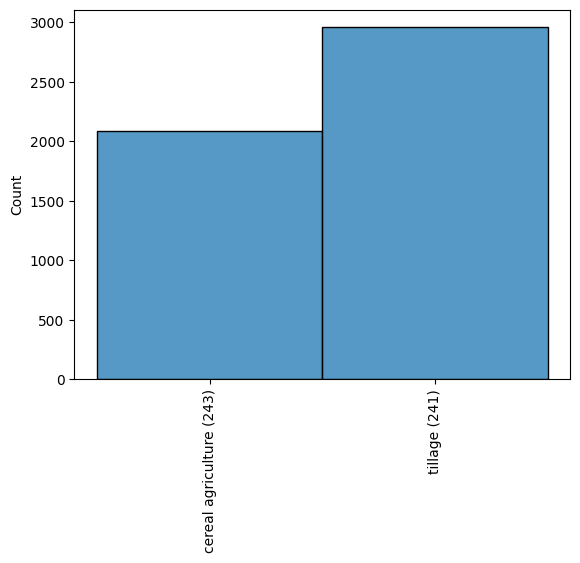

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7680105750165235
              precision    recall  f1-score   support

         241      0.738     0.917     0.818       859
         243      0.840     0.572     0.681       654

    accuracy                          0.768      1513
   macro avg      0.789     0.745     0.749      1513
weighted avg      0.782     0.768     0.759      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



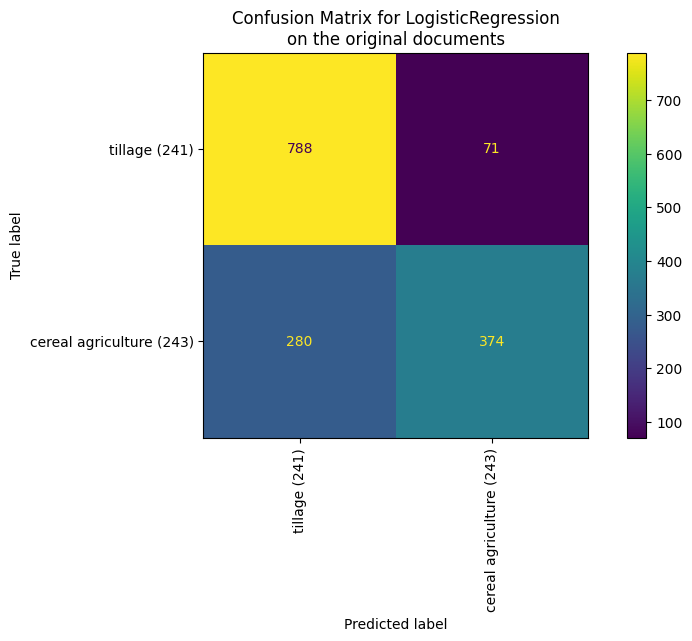

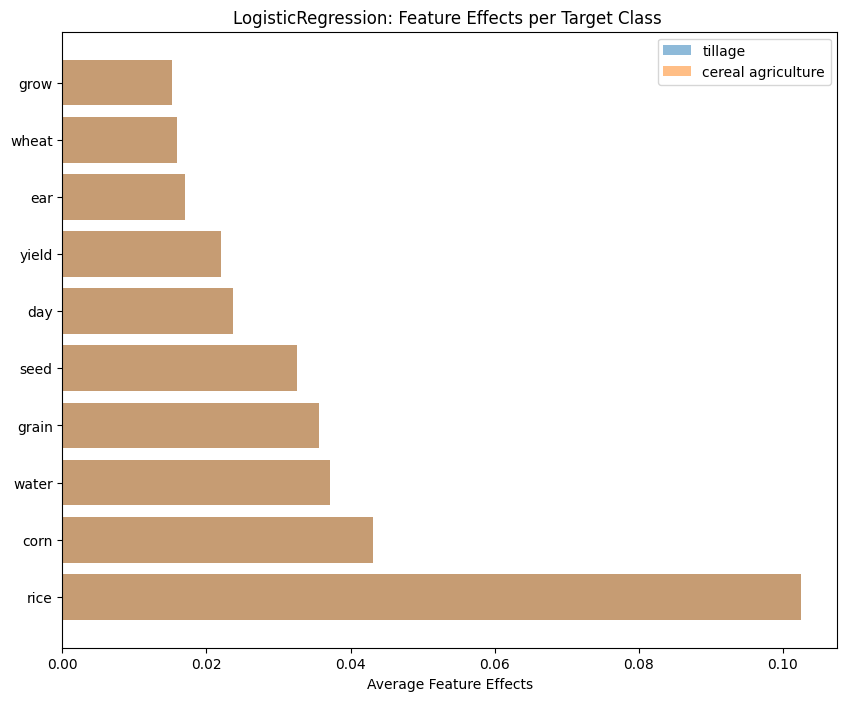

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7495042961004627
              precision    recall  f1-score   support

         241      0.739     0.864     0.797       859
         243      0.770     0.599     0.674       654

    accuracy                          0.750      1513
   macro avg      0.755     0.732     0.735      1513
weighted avg      0.752     0.750     0.744      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



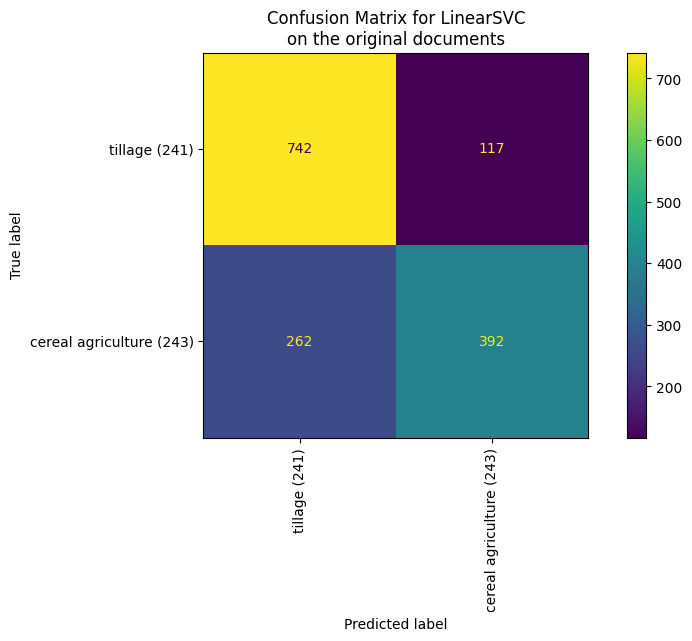

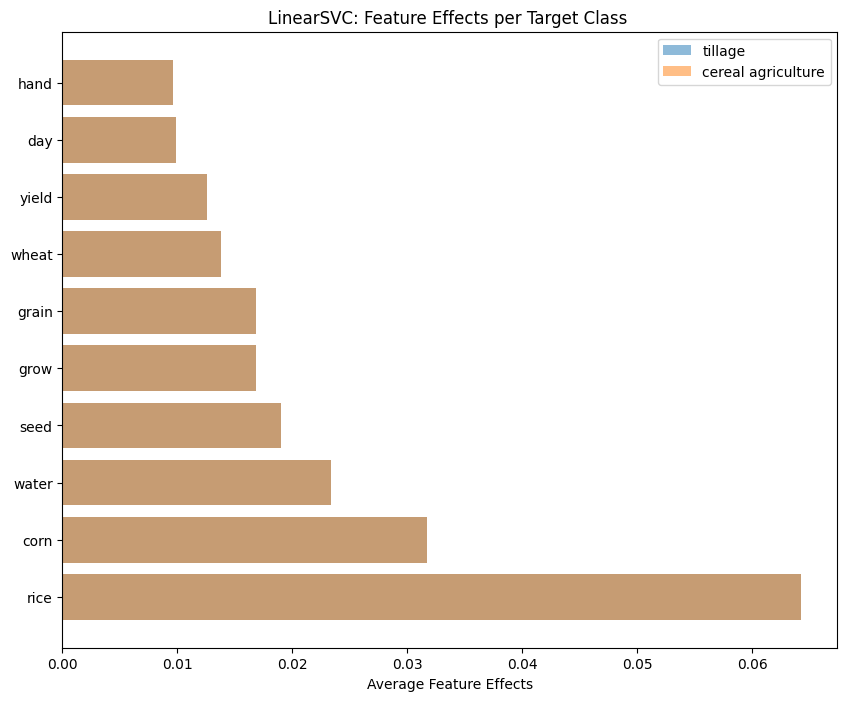

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7680105750165235
              precision    recall  f1-score   support

         241      0.793     0.800     0.797       859
         243      0.734     0.726     0.730       654

    accuracy                          0.768      1513
   macro avg      0.764     0.763     0.763      1513
weighted avg      0.768     0.768     0.768      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


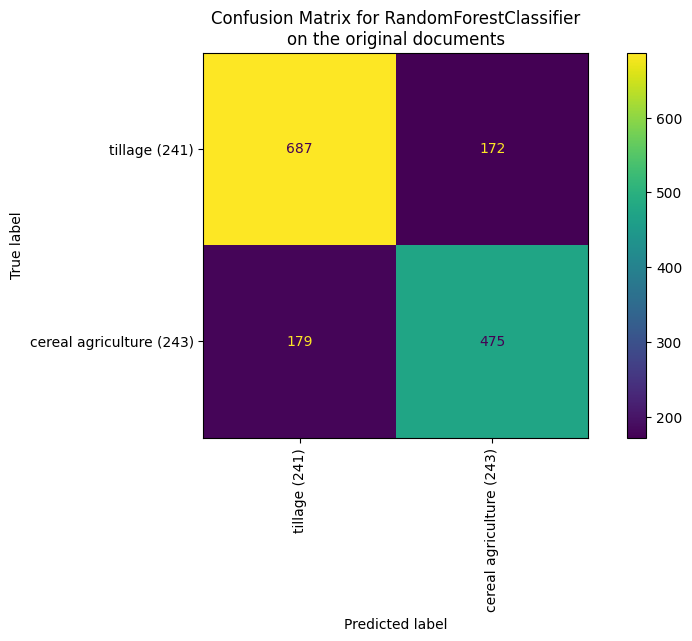

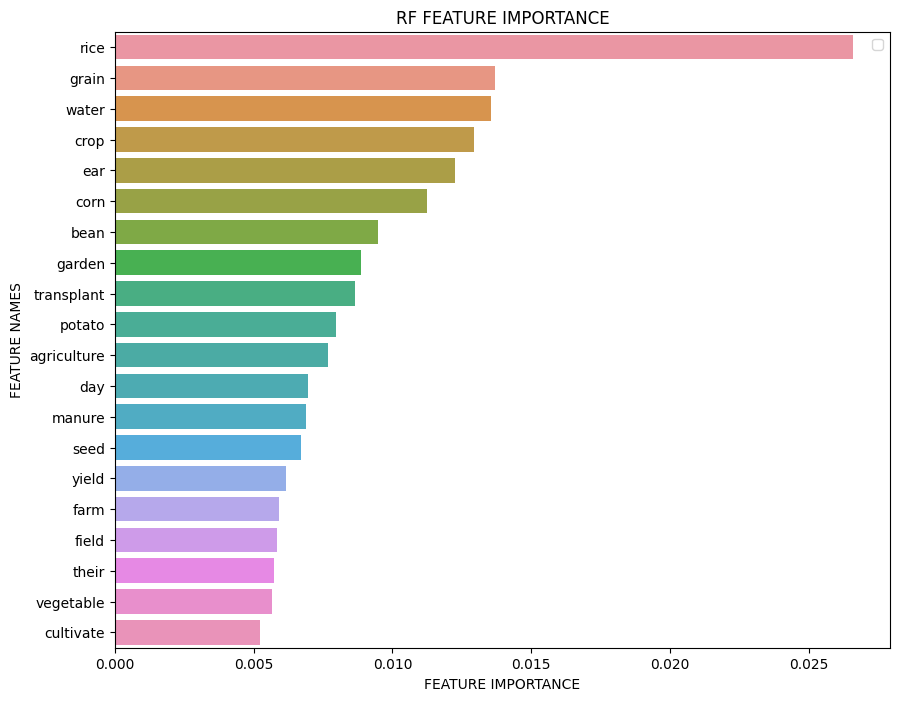

Iteration 2
Exclude: {'potato', 'seed', 'water', 'crop', 'cultivate', 'yield', 'bean', 'rice', 'wheat', 'agriculture', 'corn', 'garden', 'day', 'farm', 'transplant', 'vegetable', 'ear', 'field', 'grow', 'their', 'hand', 'grain', 'manure'}

(5043,) (5043,)
5043 documents - 2.13MB (training set)
2 categories


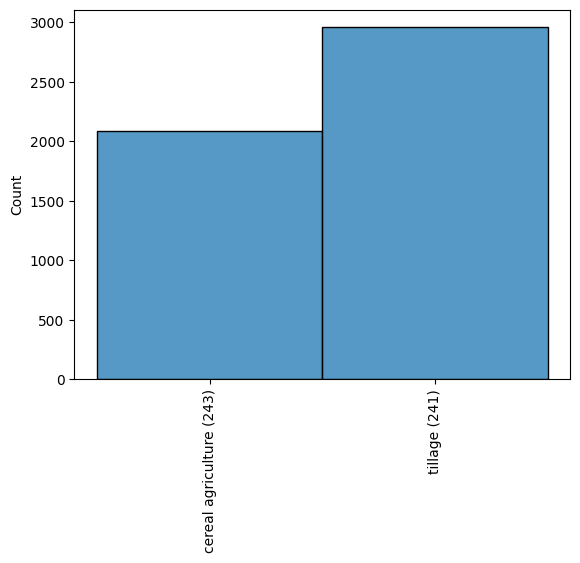

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7343027098479842
              precision    recall  f1-score   support

         241      0.725     0.887     0.798       896
         243      0.758     0.512     0.611       617

    accuracy                          0.734      1513
   macro avg      0.742     0.700     0.705      1513
weighted avg      0.739     0.734     0.722      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



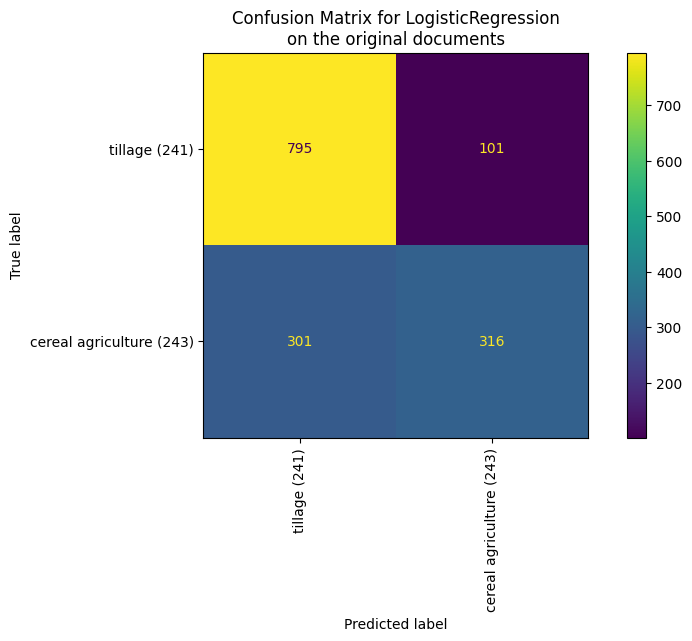

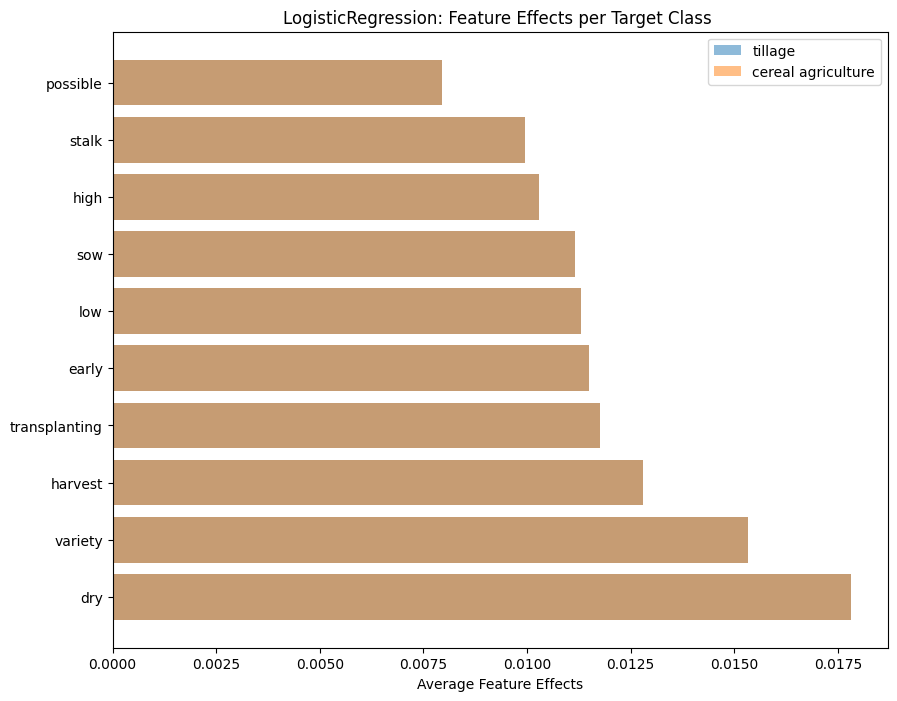

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7217448777263714
              precision    recall  f1-score   support

         241      0.737     0.825     0.778       896
         243      0.692     0.572     0.626       617

    accuracy                          0.722      1513
   macro avg      0.714     0.698     0.702      1513
weighted avg      0.719     0.722     0.716      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



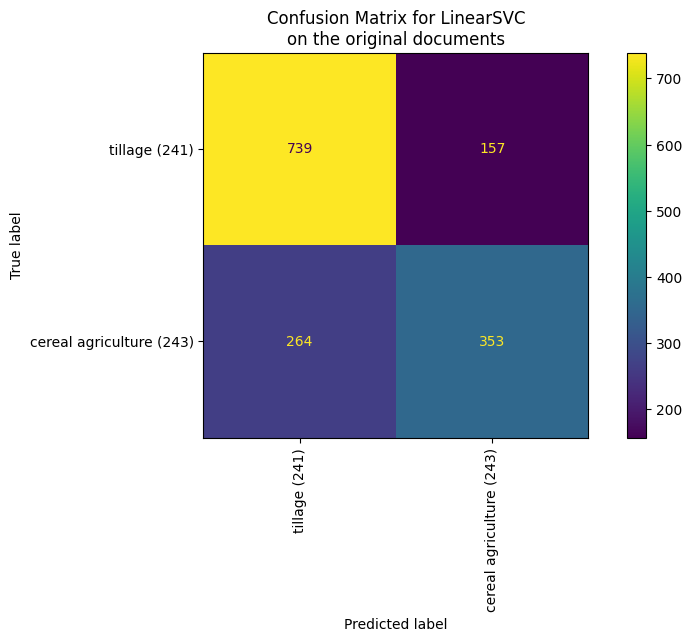

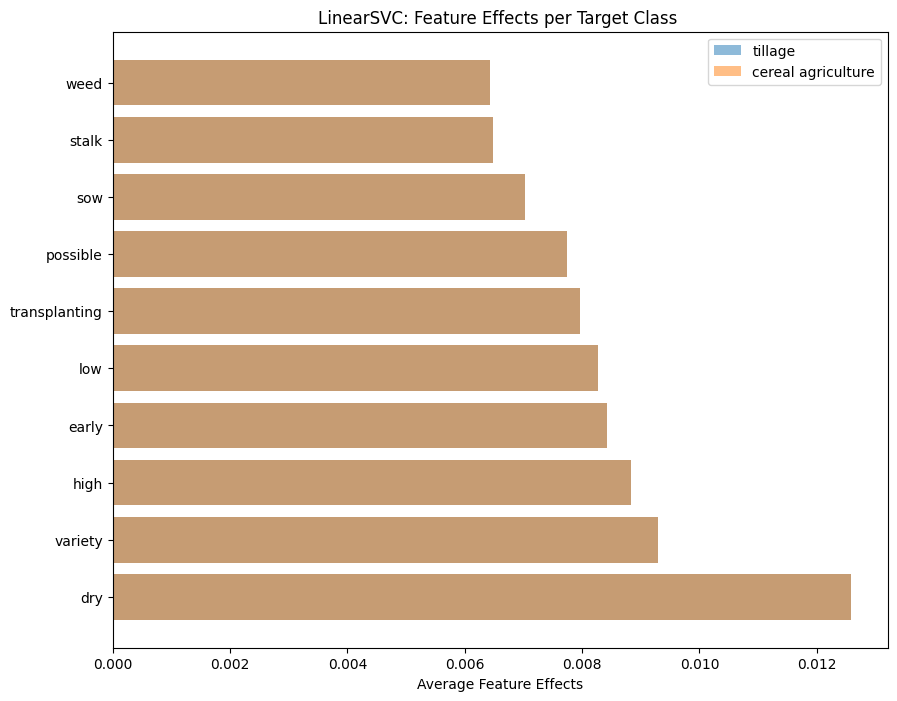

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7171183079973562
              precision    recall  f1-score   support

         241      0.758     0.767     0.762       896
         243      0.656     0.645     0.650       617

    accuracy                          0.717      1513
   macro avg      0.707     0.706     0.706      1513
weighted avg      0.716     0.717     0.717      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


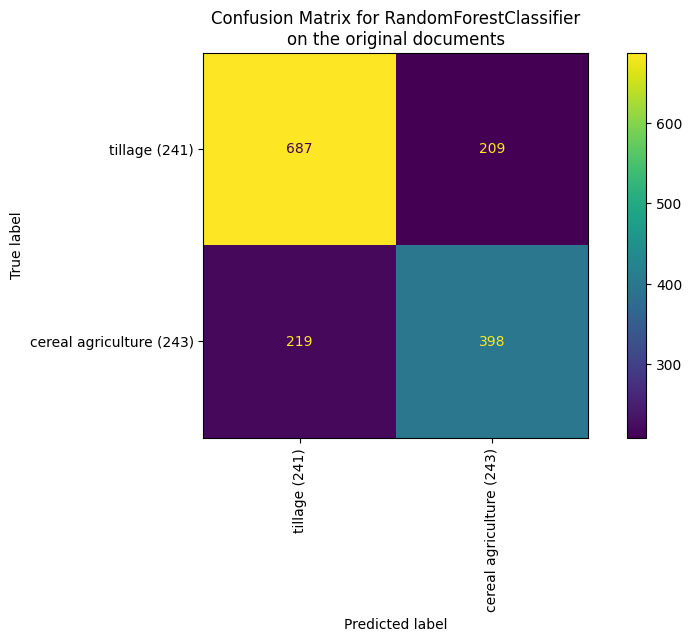

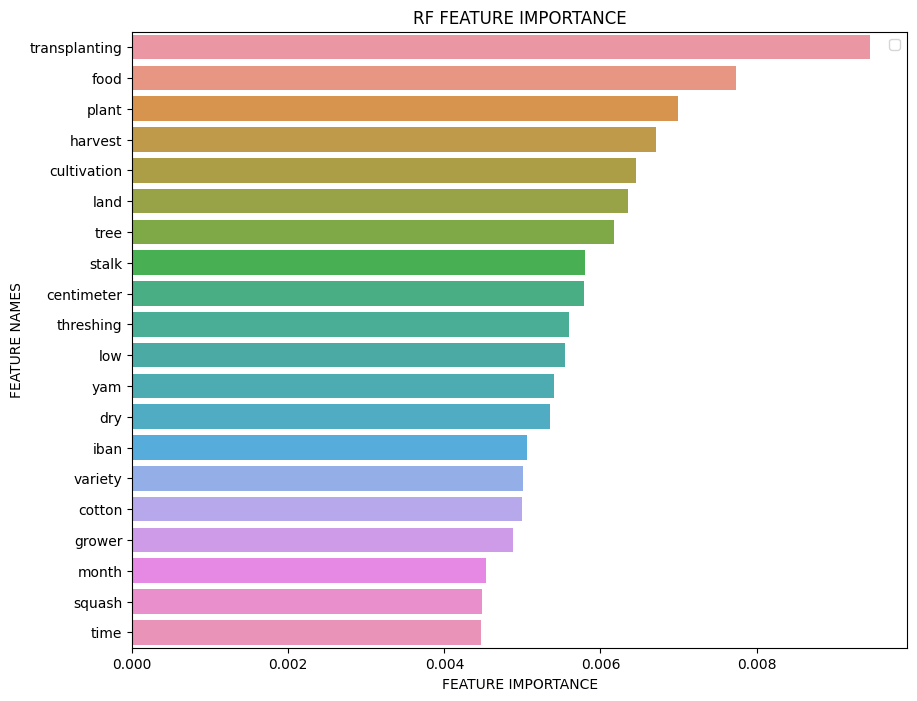

Iteration 3
Exclude: {'cultivate', 'yield', 'bean', 'land', 'squash', 'sow', 'tree', 'transplanting', 'early', 'high', 'corn', 'food', 'time', 'garden', 'day', 'farm', 'plant', 'month', 'ear', 'field', 'centimeter', 'harvest', 'hand', 'variety', 'rice', 'potato', 'seed', 'manure', 'possible', 'stalk', 'water', 'crop', 'low', 'dry', 'cultivation', 'iban', 'grower', 'wheat', 'agriculture', 'threshing', 'yam', 'transplant', 'vegetable', 'cotton', 'weed', 'grow', 'their', 'grain'}

(5043,) (5043,)
5043 documents - 2.13MB (training set)
2 categories


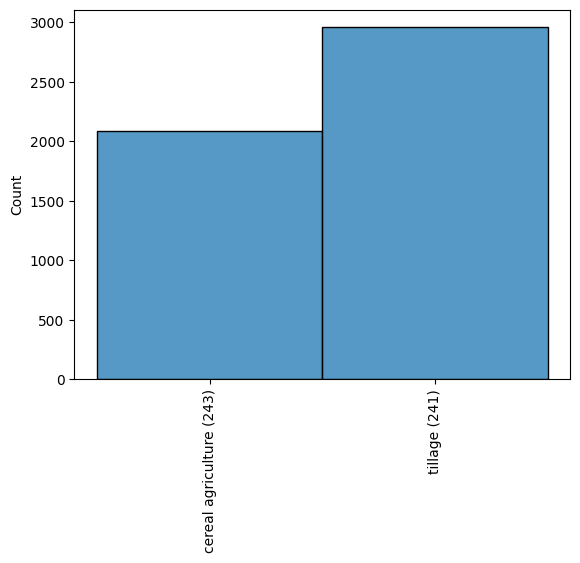

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7395902181097158
              precision    recall  f1-score   support

         241      0.737     0.883     0.803       911
         243      0.746     0.523     0.615       602

    accuracy                          0.740      1513
   macro avg      0.742     0.703     0.709      1513
weighted avg      0.741     0.740     0.728      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



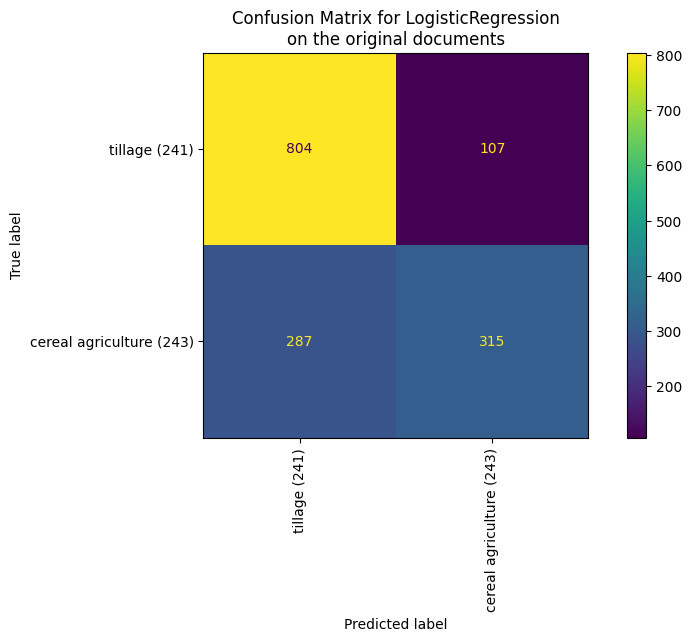

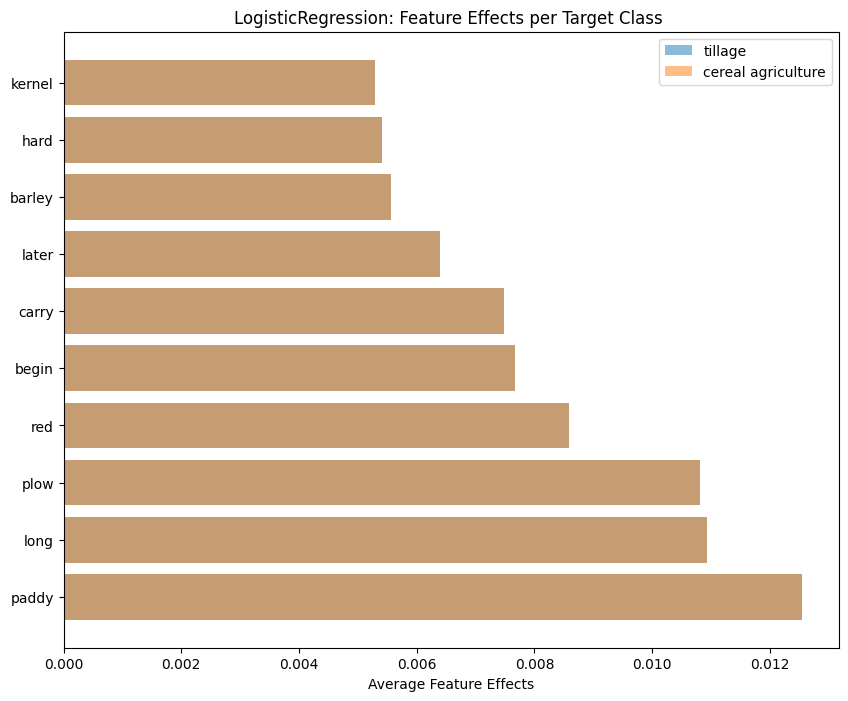

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.729676140118969
              precision    recall  f1-score   support

         241      0.750     0.825     0.786       911
         243      0.689     0.585     0.633       602

    accuracy                          0.730      1513
   macro avg      0.720     0.705     0.709      1513
weighted avg      0.726     0.730     0.725      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



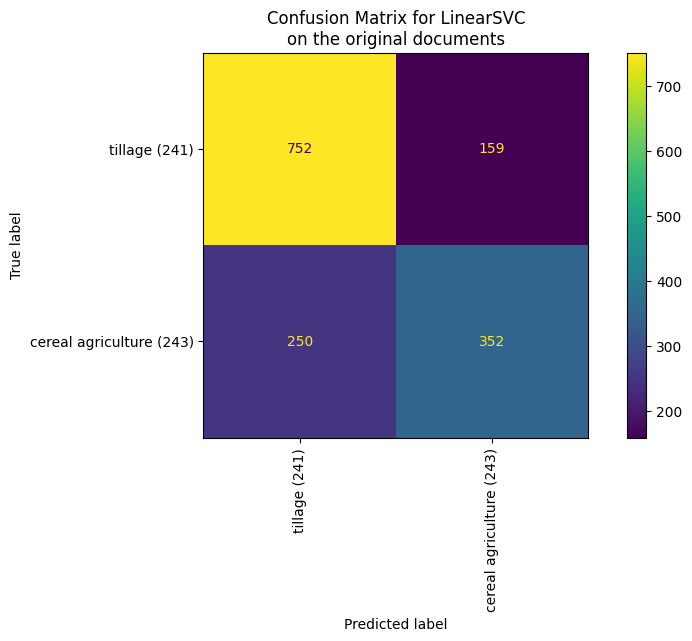

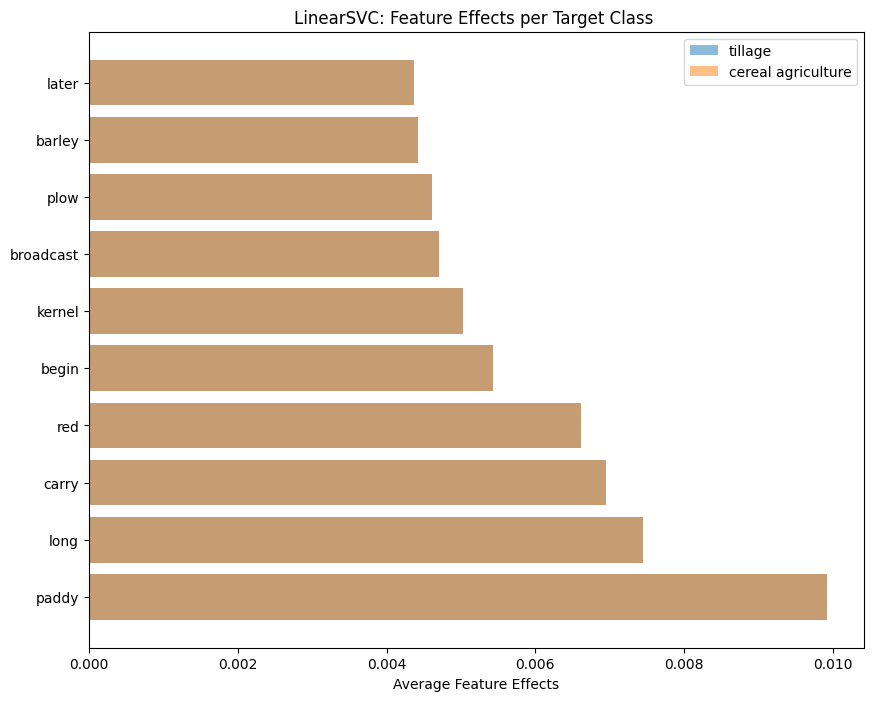

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7078651685393258
              precision    recall  f1-score   support

         241      0.758     0.756     0.757       911
         243      0.632     0.635     0.633       602

    accuracy                          0.708      1513
   macro avg      0.695     0.695     0.695      1513
weighted avg      0.708     0.708     0.708      1513



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


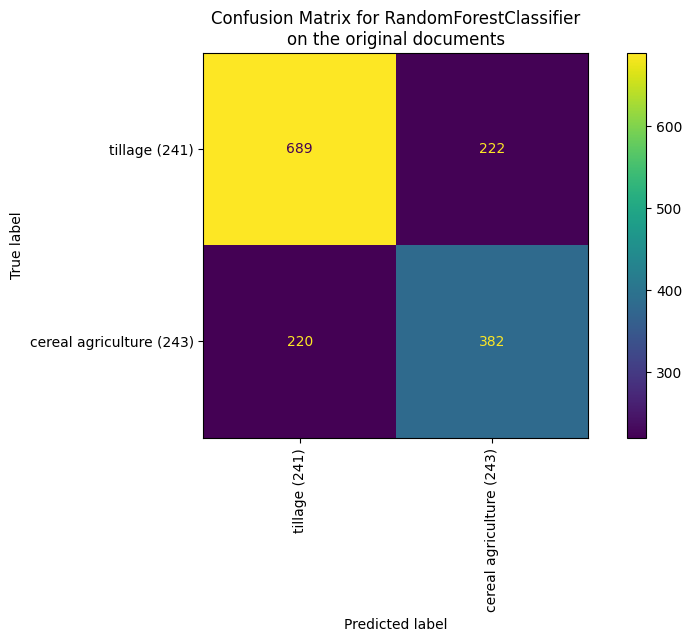

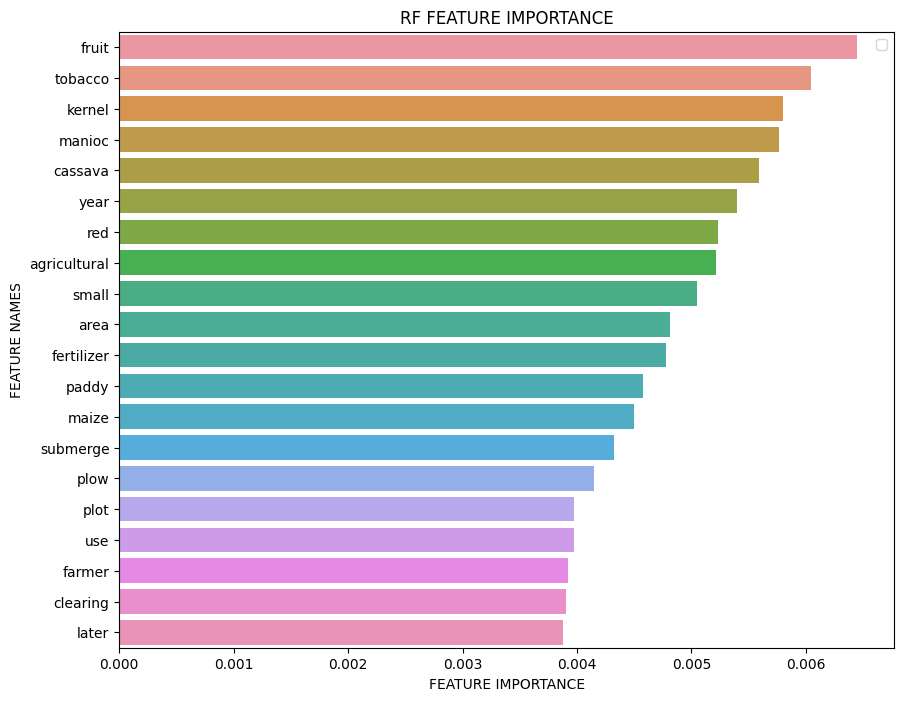

In [10]:
results = iterative_process(common_indicators=False,
                        models=['LR', 'SVM', 'RF'], 
                        chosen_categories=[241, 243], 
                        balanced=False,
                        verbose=True)

In [11]:
results

defaultdict(dict,
            {0: {'df':         Unnamed: 0              sreid          section          sectpar   
              12138        12656    am11-107-005636  am11-107-005093  am11-107-004703  \
              24887        26407    aw16-001-004738  aw16-001-004685  aw16-001-004590   
              43872        47577    fa28-006-000792  fa28-006-000073  fa28-006-000060   
              40161        43105    es10-004-009598  es10-004-009005              NaN   
              124999      136172    nu07-021-027007  nu07-021-027004  nu07-021-027002   
              ...            ...                ...              ...              ...   
              138003      150645    oe05-014-005408  oe05-014-004218  oe05-014-003640   
              55594        61587    fo07-018-003577  fo07-018-003560              NaN   
              12373        12892    am11-107-007393  am11-107-007331  am11-107-007006   
              133032      144623    oa19-001-009397  oa19-001-008655  oa19-001-0080

# Cat vs subcategories (binary classification)

results = defaultdict(dict)
for b in [True, False]:
    print('\n\nBalanced:', b)
    
    for i in [224, 226, 241, 243]:
        curr_results = iterative_process(common_indicators=False,
                                    models=['LR', 'SVM', 'RF'], 
                                    specific_cat=i, exact=True, 
                                    balanced=b,
                                    verbose=True)
        results[f'i_{"balanced" if b else "imbalanced"}'] = curr_results

Iteration 1
Exclude: set()

(8717,) (8717,)
8717 documents - 3.86MB (training set)
2 categories


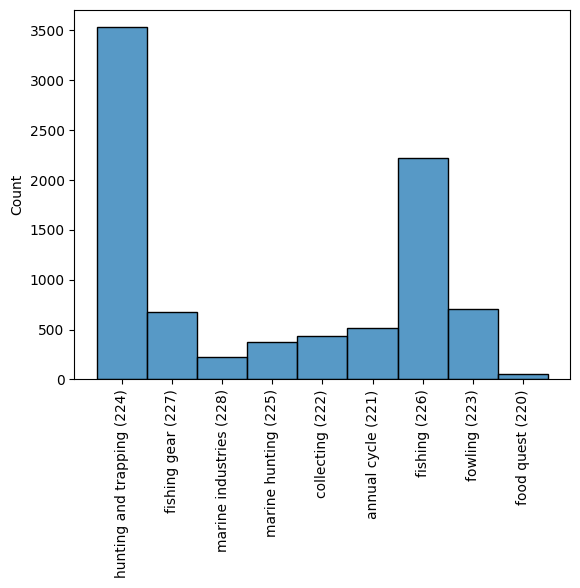

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.900611620795107
              precision    recall  f1-score   support

         220      0.882     0.963     0.921      1564
         224      0.936     0.808     0.867      1052

    accuracy                          0.901      2616
   macro avg      0.909     0.885     0.894      2616
weighted avg      0.904     0.901     0.899      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



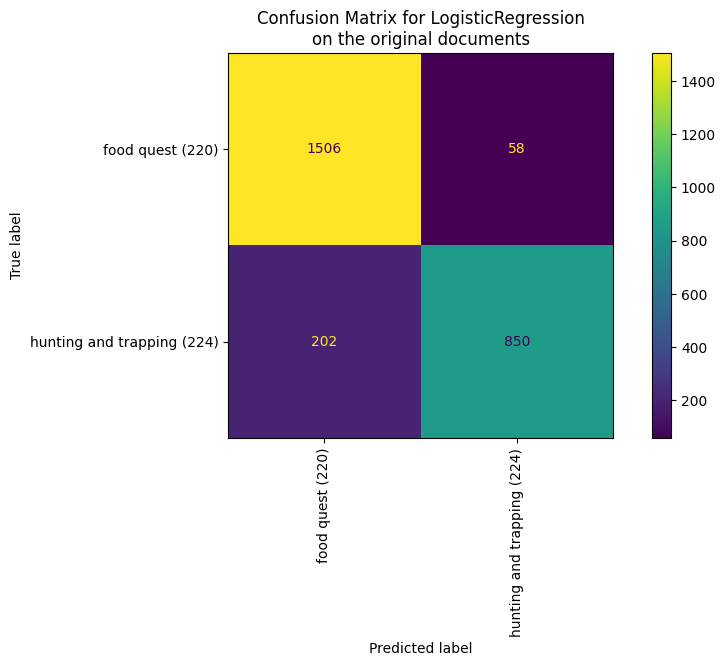

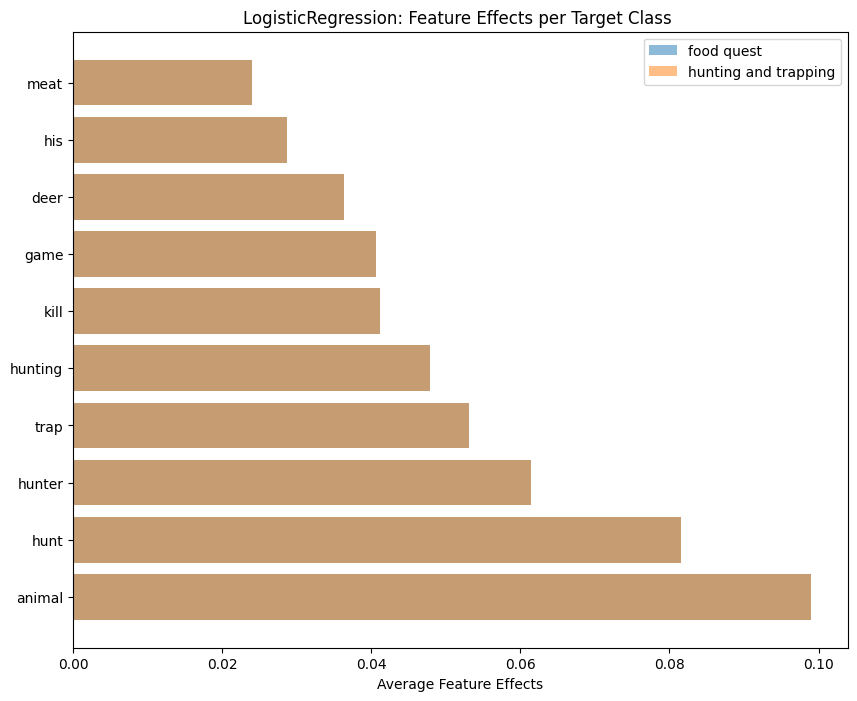

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.9048165137614679
              precision    recall  f1-score   support

         220      0.894     0.954     0.923      1564
         224      0.924     0.832     0.875      1052

    accuracy                          0.905      2616
   macro avg      0.909     0.893     0.899      2616
weighted avg      0.906     0.905     0.904      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



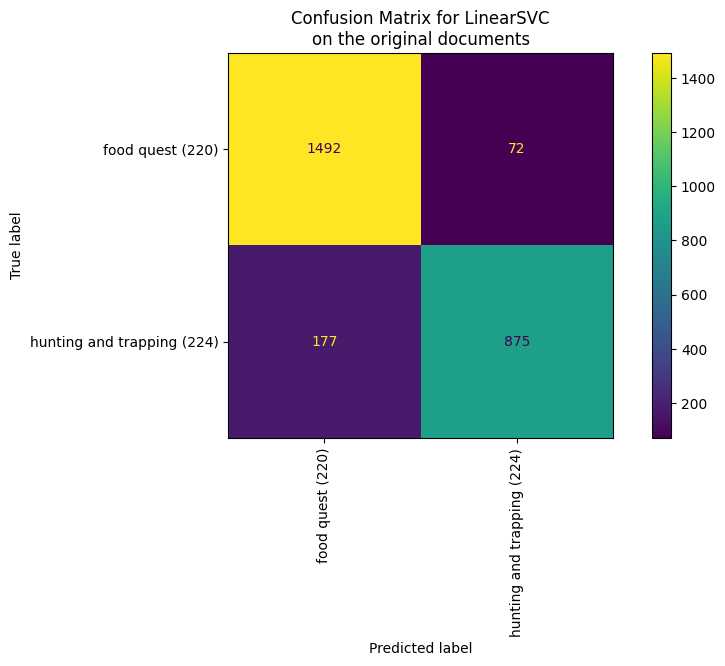

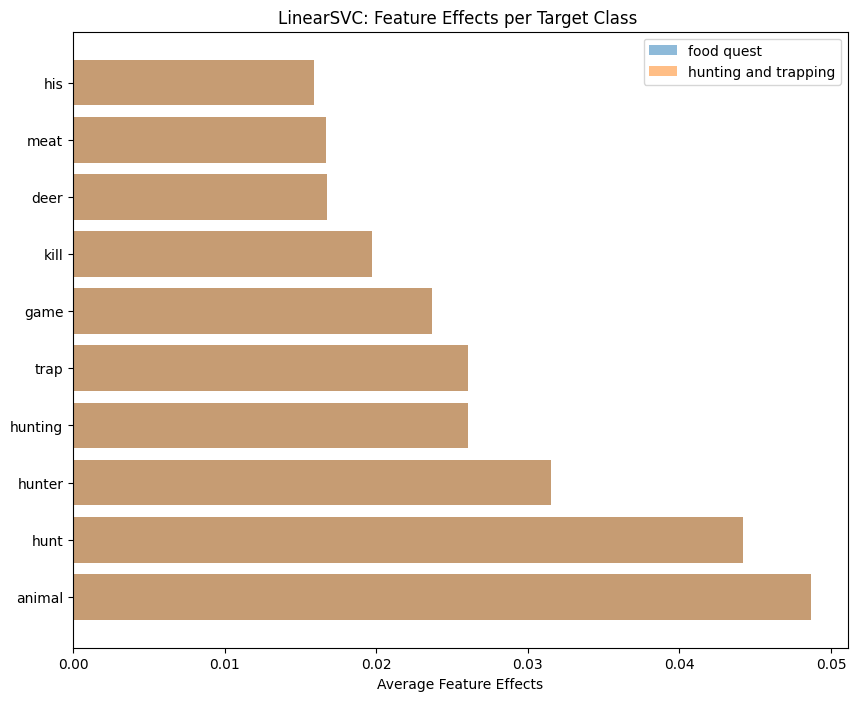

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8830275229357798
              precision    recall  f1-score   support

         220      0.882     0.929     0.905      1564
         224      0.885     0.815     0.849      1052

    accuracy                          0.883      2616
   macro avg      0.884     0.872     0.877      2616
weighted avg      0.883     0.883     0.882      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


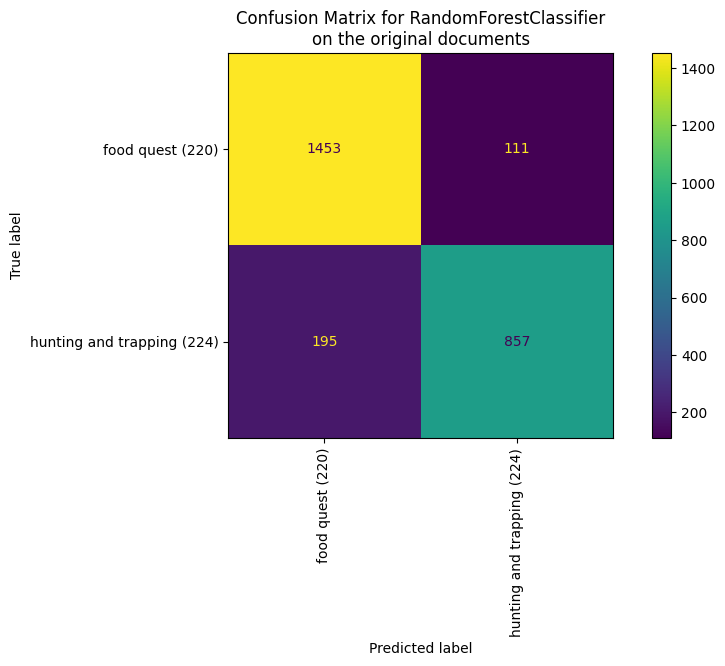

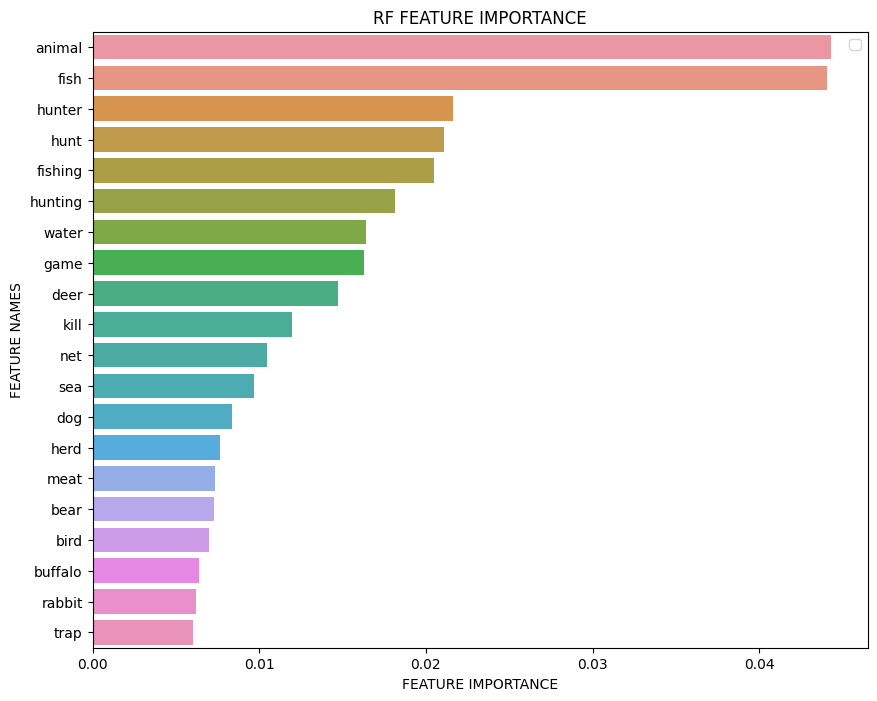

Iteration 2
Exclude: {'deer', 'buffalo', 'water', 'dog', 'sea', 'meat', 'net', 'hunter', 'animal', 'trap', 'herd', 'his', 'bear', 'game', 'kill', 'bird', 'fishing', 'hunt', 'fish', 'rabbit', 'hunting'}

(8717,) (8717,)
8717 documents - 3.86MB (training set)
2 categories


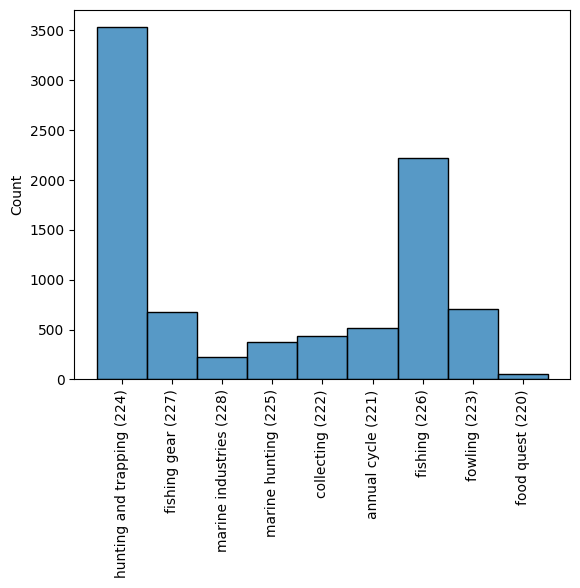

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8482415902140673
              precision    recall  f1-score   support

         220      0.839     0.932     0.883      1606
         224      0.869     0.715     0.784      1010

    accuracy                          0.848      2616
   macro avg      0.854     0.823     0.834      2616
weighted avg      0.850     0.848     0.845      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



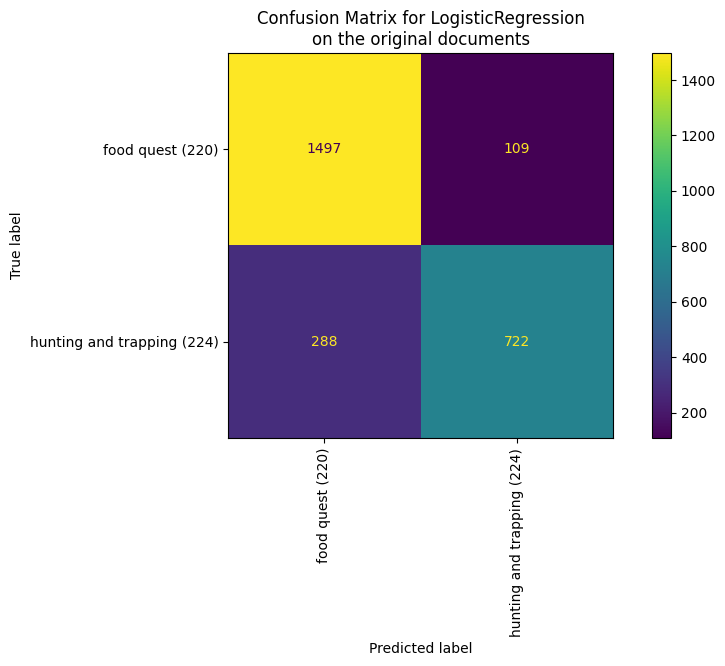

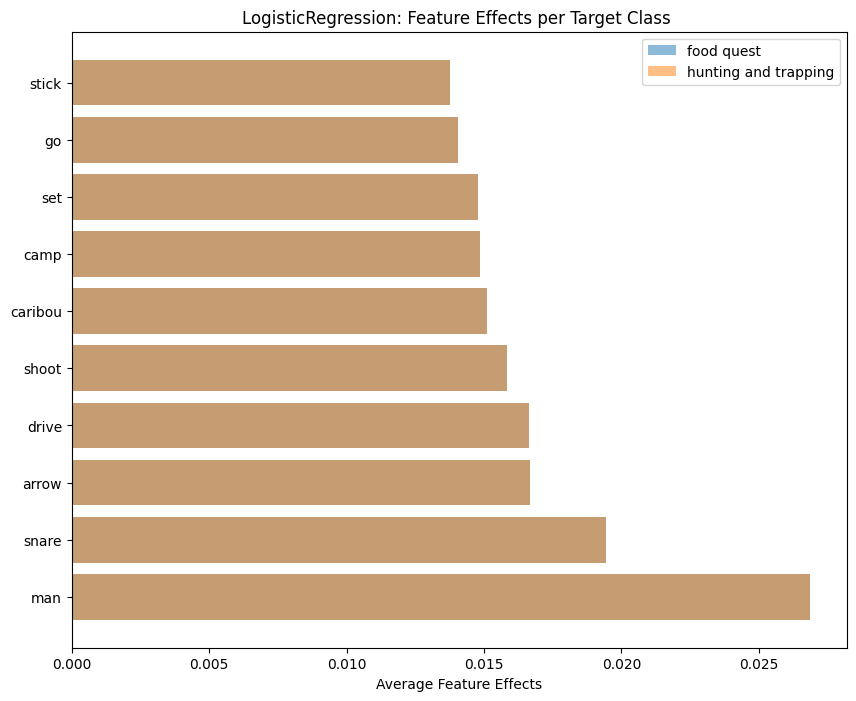

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8314220183486238
              precision    recall  f1-score   support

         220      0.840     0.896     0.867      1606
         224      0.815     0.729     0.769      1010

    accuracy                          0.831      2616
   macro avg      0.828     0.812     0.818      2616
weighted avg      0.830     0.831     0.829      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



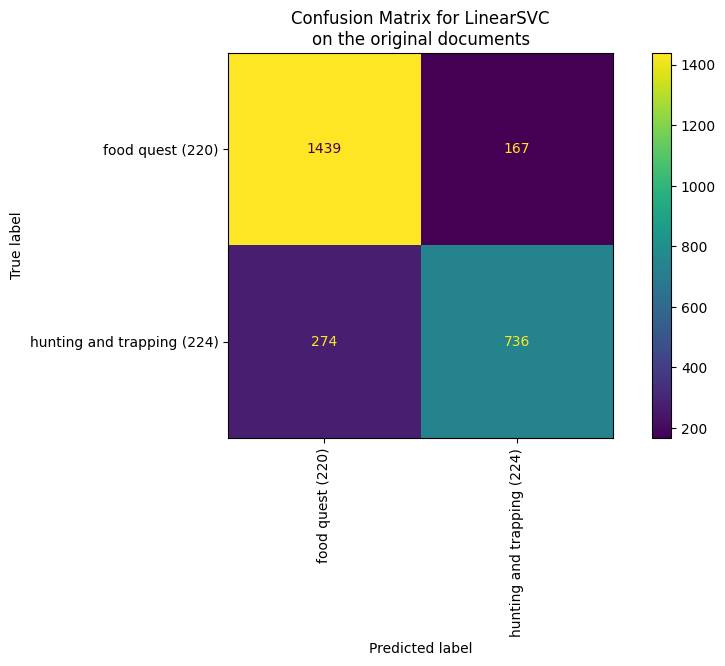

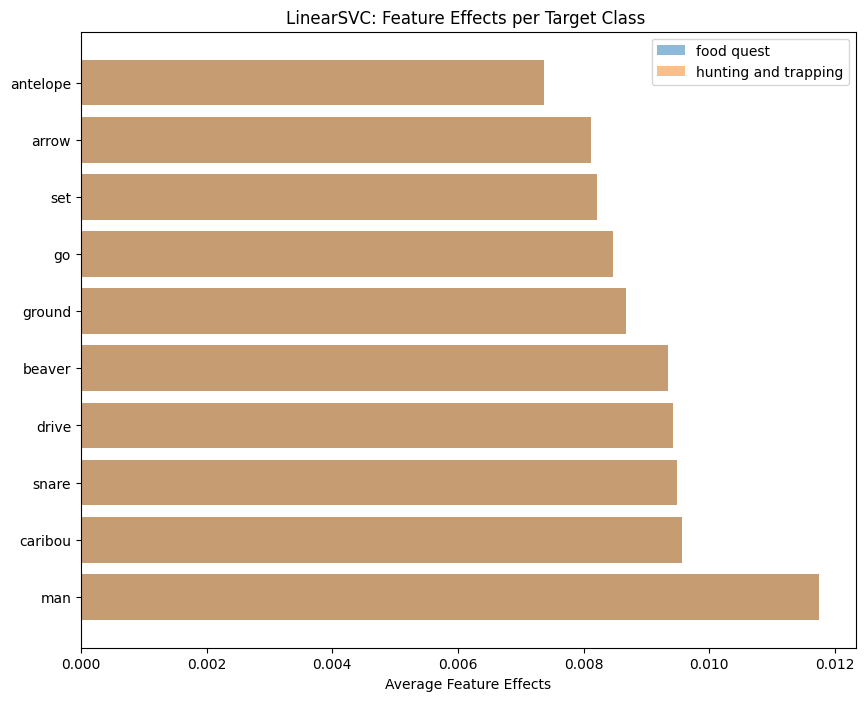

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8138379204892966
              precision    recall  f1-score   support

         220      0.823     0.887     0.854      1606
         224      0.795     0.697     0.743      1010

    accuracy                          0.814      2616
   macro avg      0.809     0.792     0.799      2616
weighted avg      0.813     0.814     0.811      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


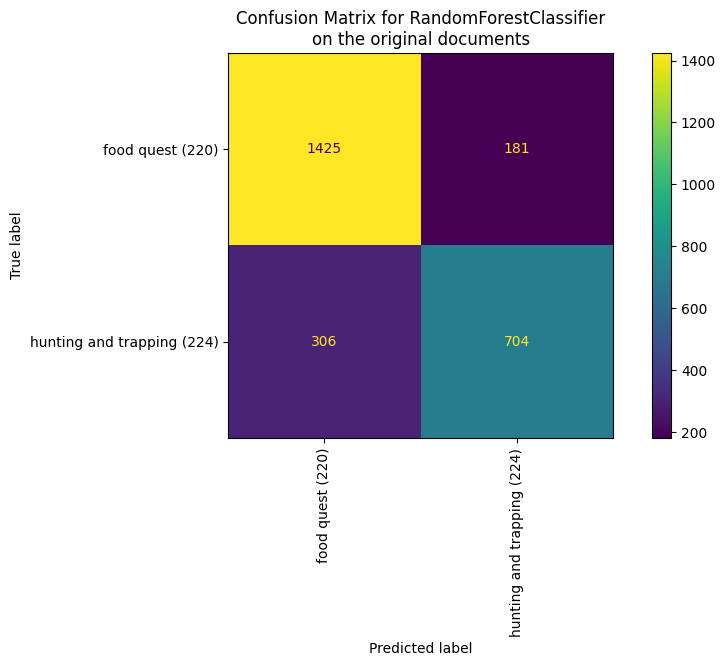

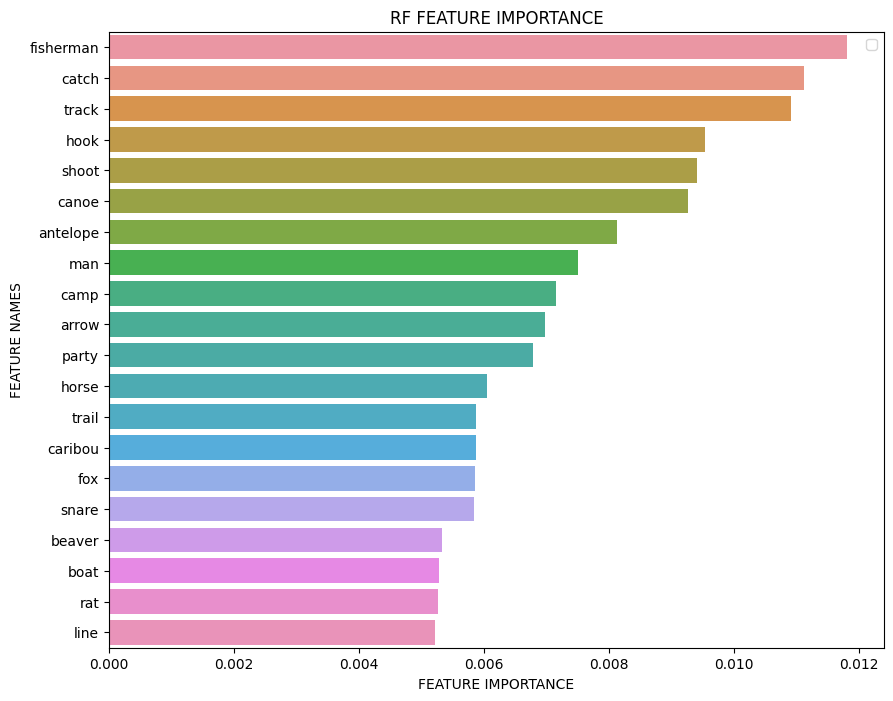

Iteration 3
Exclude: {'horse', 'deer', 'buffalo', 'dog', 'camp', 'ground', 'party', 'meat', 'fisherman', 'drive', 'net', 'rat', 'canoe', 'track', 'go', 'hunter', 'trap', 'snare', 'catch', 'herd', 'boat', 'his', 'bear', 'set', 'antelope', 'beaver', 'fish', 'rabbit', 'caribou', 'water', 'sea', 'fox', 'hook', 'stick', 'animal', 'shoot', 'game', 'kill', 'man', 'bird', 'fishing', 'hunt', 'trail', 'arrow', 'hunting', 'line'}

(8717,) (8717,)
8717 documents - 3.86MB (training set)
2 categories


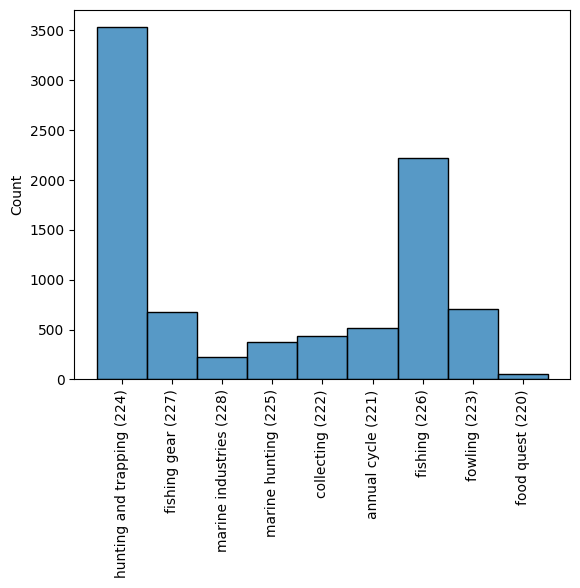

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8287461773700305
              precision    recall  f1-score   support

         220      0.809     0.936     0.868      1571
         224      0.875     0.667     0.757      1045

    accuracy                          0.829      2616
   macro avg      0.842     0.802     0.812      2616
weighted avg      0.835     0.829     0.823      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



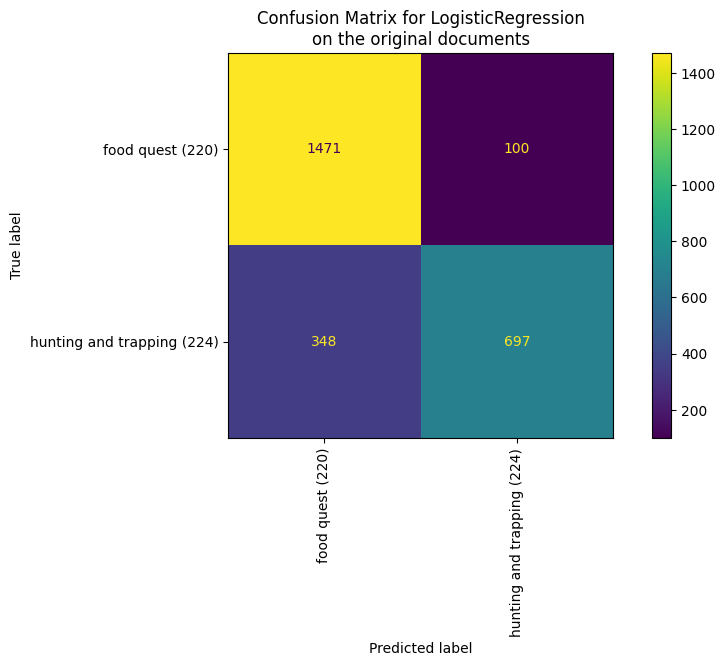

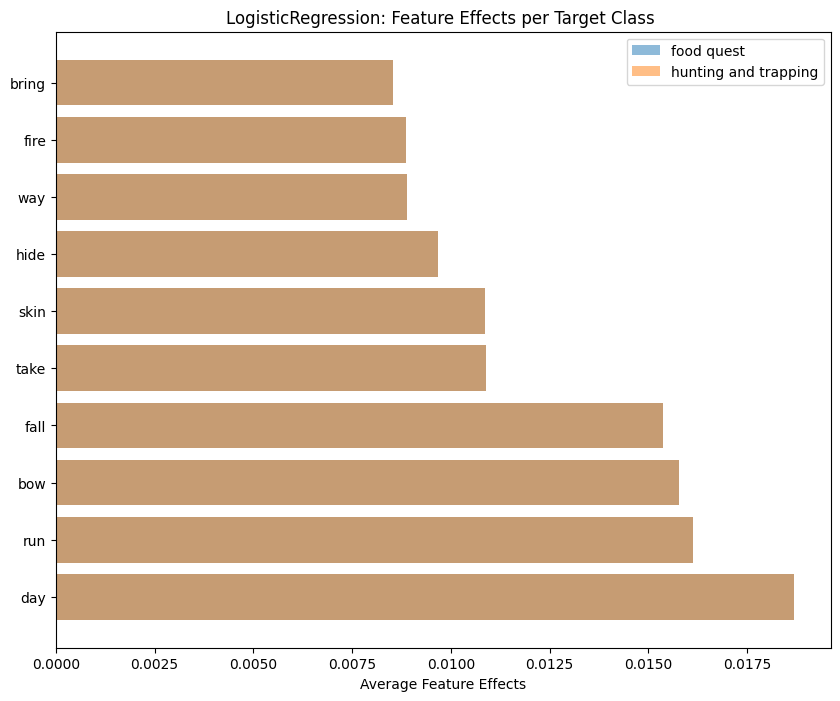

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8157492354740061
              precision    recall  f1-score   support

         220      0.819     0.889     0.853      1571
         224      0.809     0.705     0.754      1045

    accuracy                          0.816      2616
   macro avg      0.814     0.797     0.803      2616
weighted avg      0.815     0.816     0.813      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



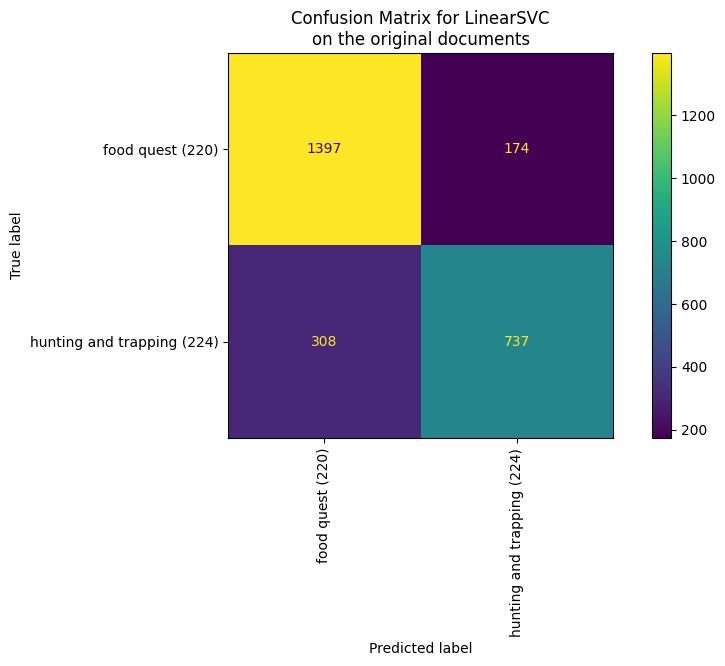

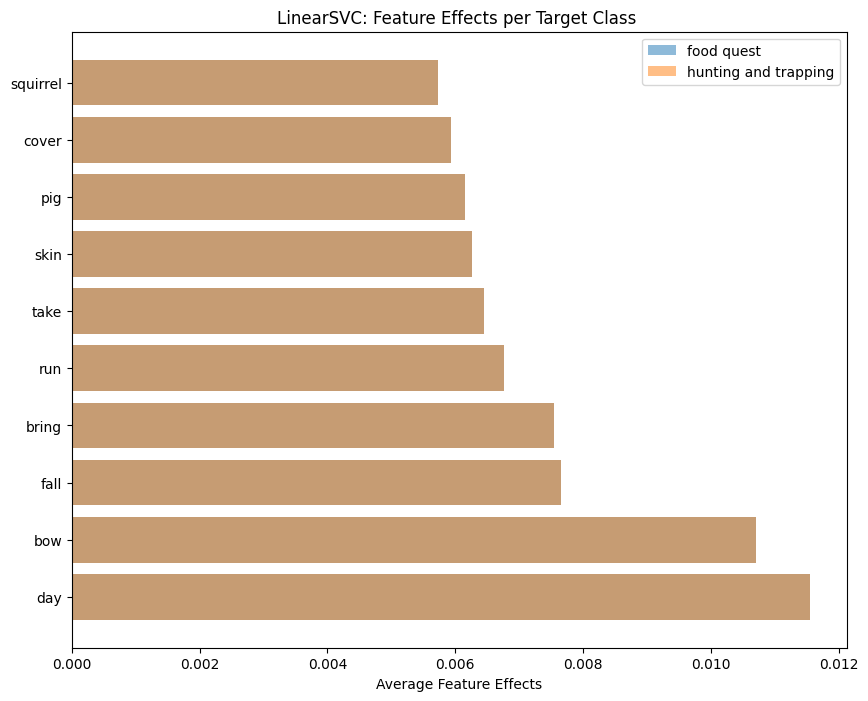

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7981651376146789
              precision    recall  f1-score   support

         220      0.794     0.896     0.842      1571
         224      0.806     0.652     0.721      1045

    accuracy                          0.798      2616
   macro avg      0.800     0.774     0.781      2616
weighted avg      0.799     0.798     0.794      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


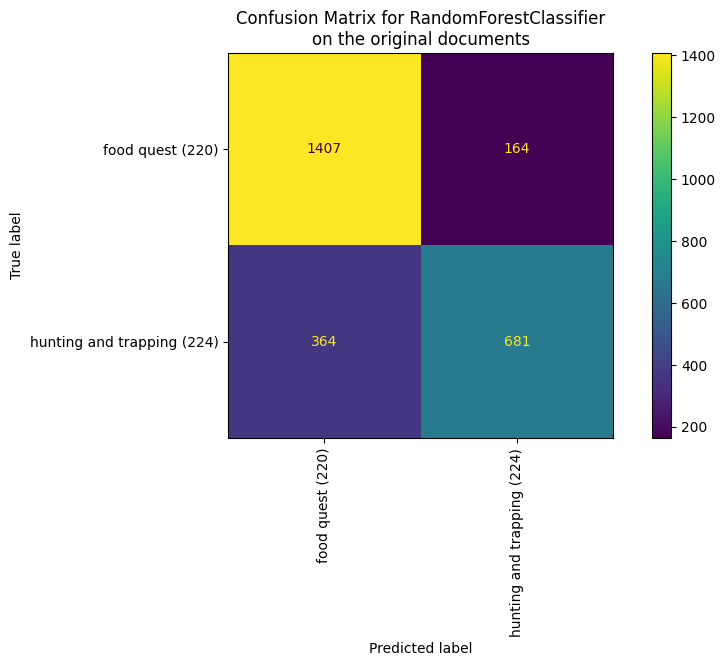

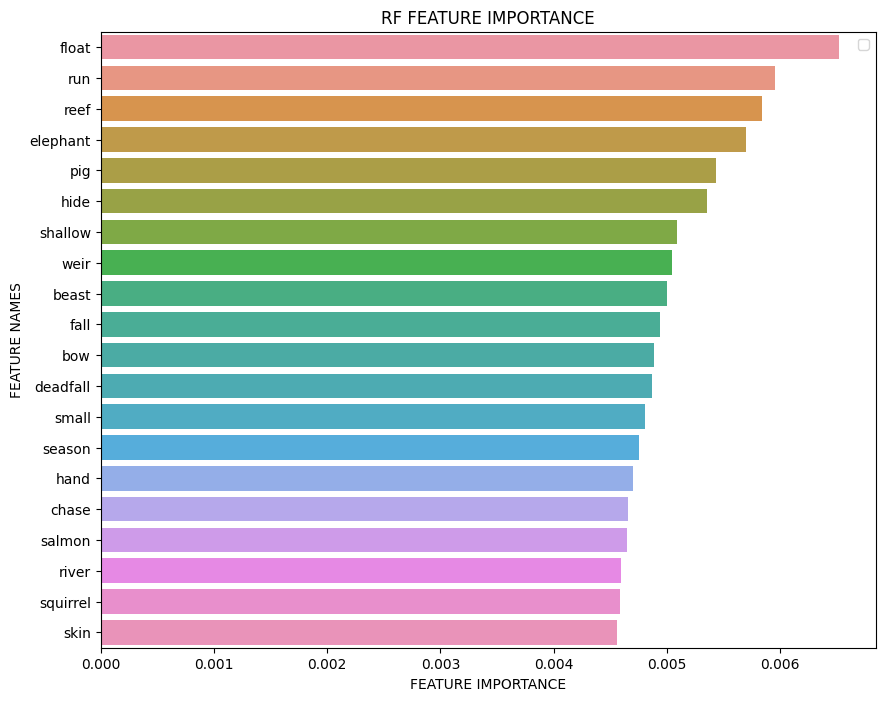

Iteration 1
Exclude: set()

(8717,) (8717,)
8717 documents - 3.86MB (training set)
2 categories


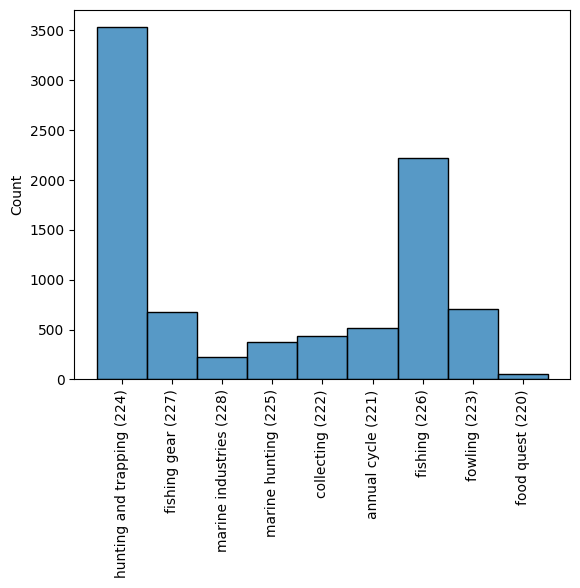

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8757645259938838
              precision    recall  f1-score   support

         220      0.890     0.951     0.920      1958
         226      0.817     0.652     0.725       658

    accuracy                          0.876      2616
   macro avg      0.854     0.801     0.823      2616
weighted avg      0.872     0.876     0.871      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



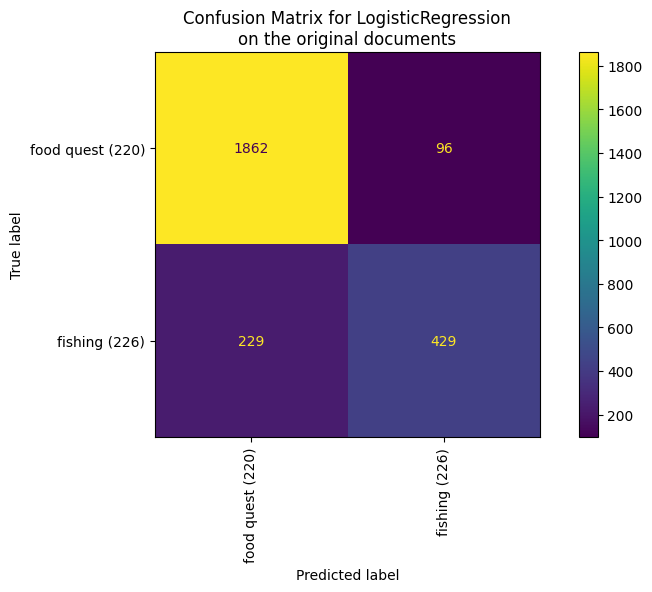

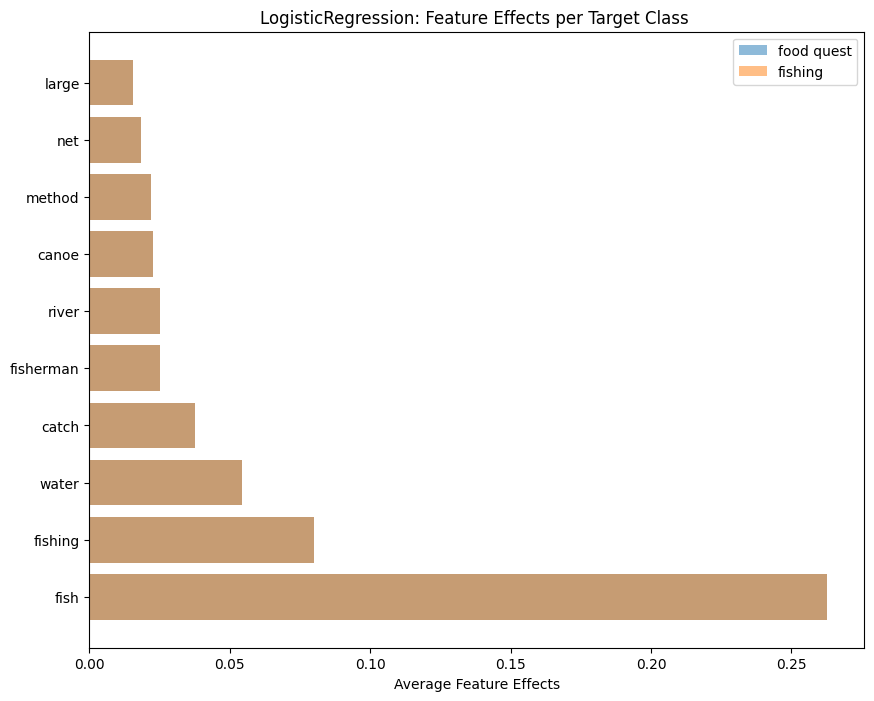

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8826452599388379
              precision    recall  f1-score   support

         220      0.910     0.935     0.923      1958
         226      0.790     0.726     0.757       658

    accuracy                          0.883      2616
   macro avg      0.850     0.831     0.840      2616
weighted avg      0.880     0.883     0.881      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



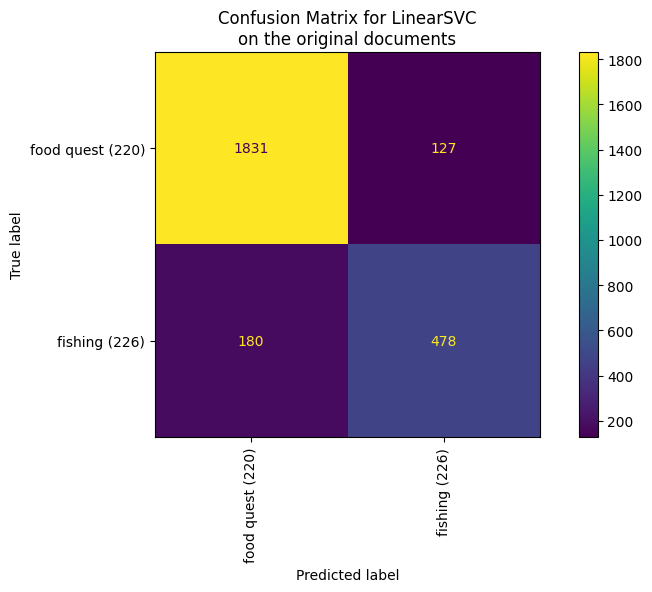

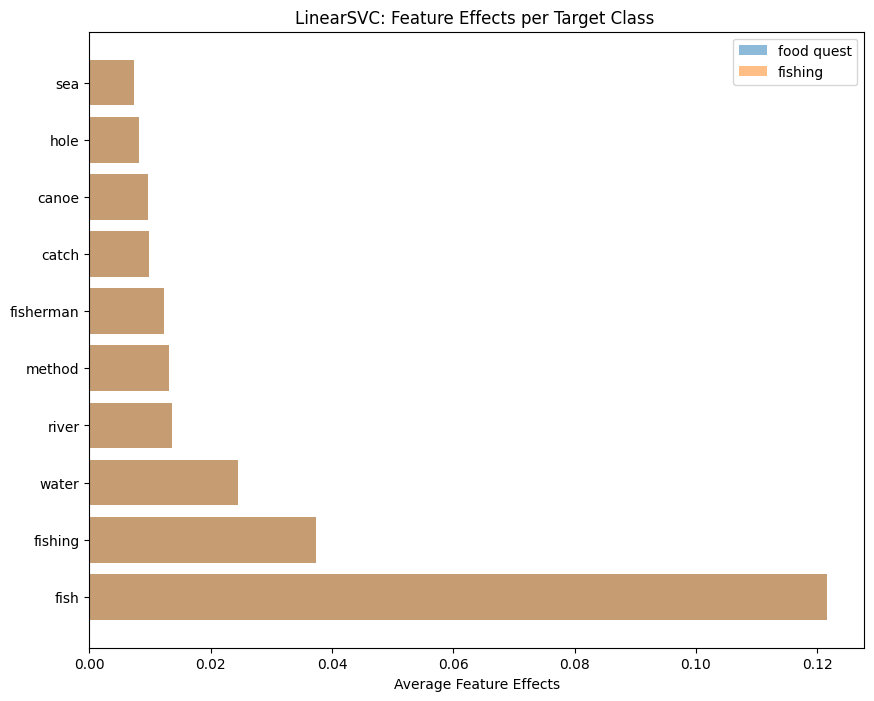

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8837920489296636
              precision    recall  f1-score   support

         220      0.913     0.934     0.923      1958
         226      0.789     0.734     0.761       658

    accuracy                          0.884      2616
   macro avg      0.851     0.834     0.842      2616
weighted avg      0.882     0.884     0.882      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


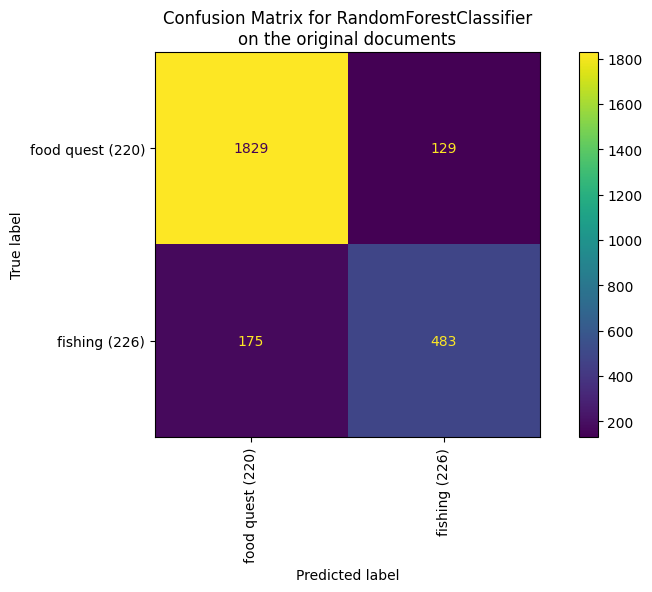

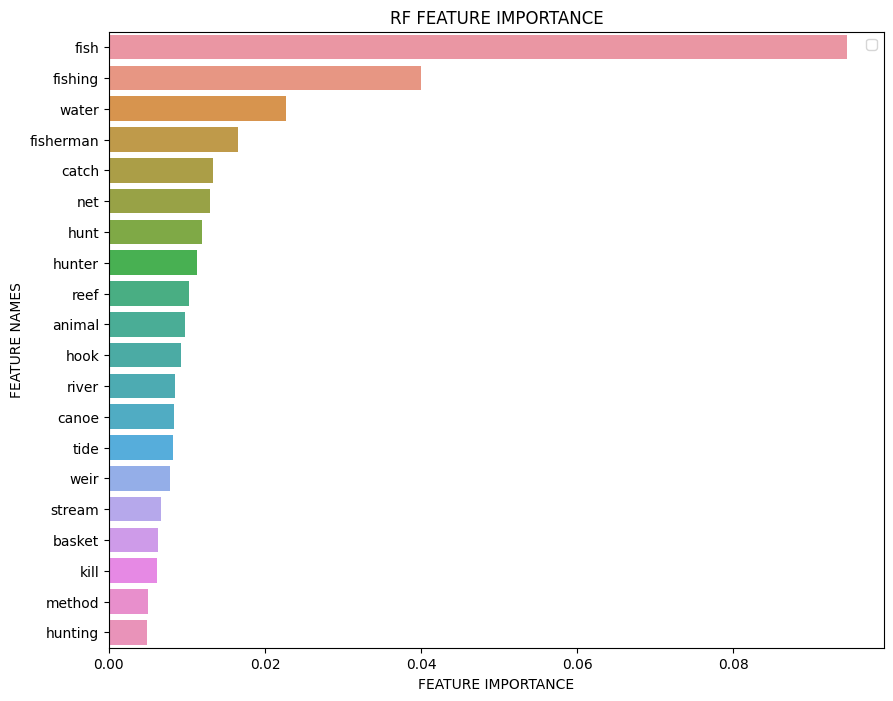

Iteration 2
Exclude: {'water', 'sea', 'reef', 'hook', 'method', 'stream', 'fisherman', 'weir', 'canoe', 'net', 'hole', 'hunter', 'tide', 'animal', 'catch', 'river', 'large', 'kill', 'fishing', 'basket', 'hunt', 'fish', 'hunting'}

(8717,) (8717,)
8717 documents - 3.86MB (training set)
2 categories


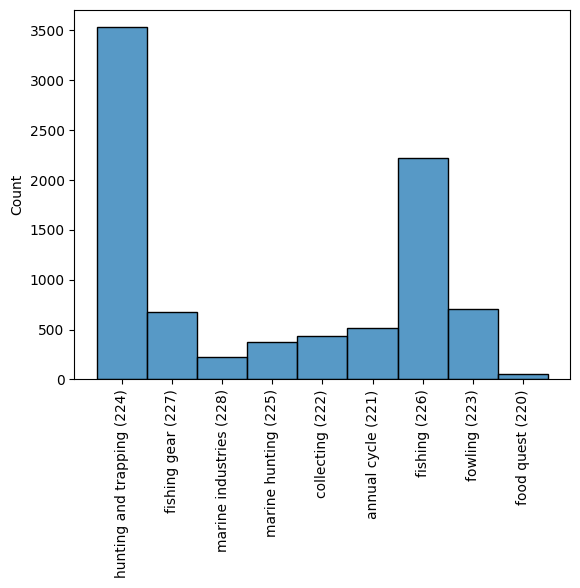

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8130733944954128
              precision    recall  f1-score   support

         220      0.816     0.964     0.884      1933
         226      0.790     0.387     0.519       683

    accuracy                          0.813      2616
   macro avg      0.803     0.675     0.702      2616
weighted avg      0.810     0.813     0.789      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



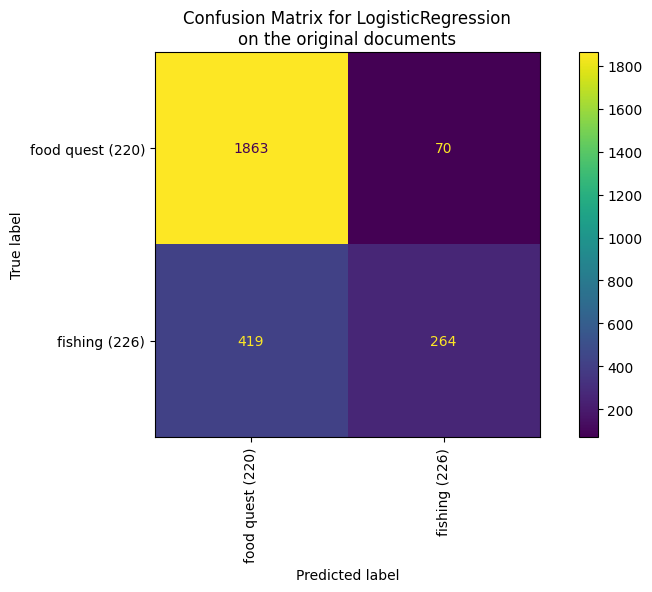

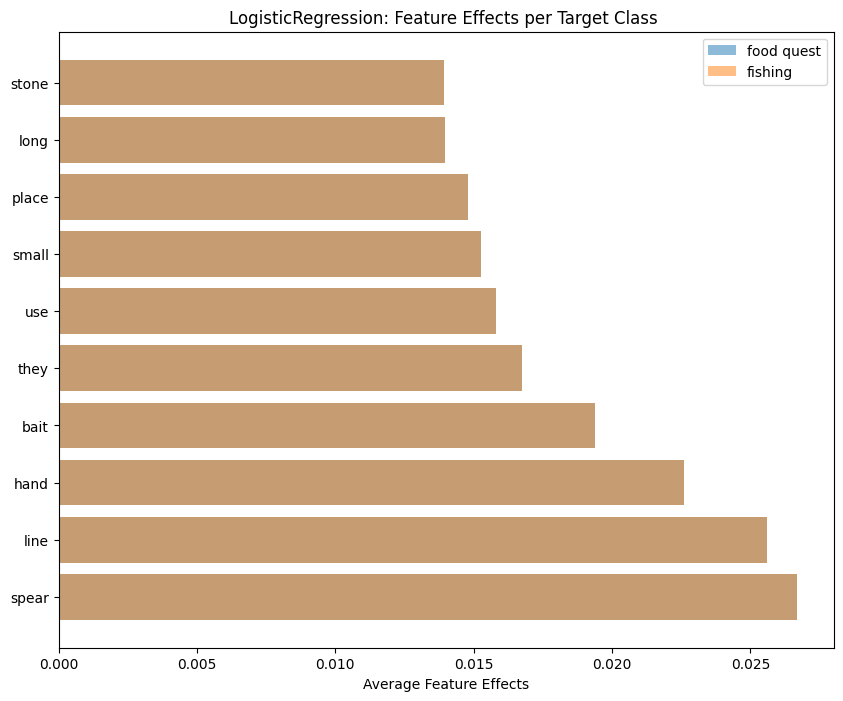

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8405963302752294
              precision    recall  f1-score   support

         220      0.863     0.933     0.896      1933
         226      0.753     0.580     0.655       683

    accuracy                          0.841      2616
   macro avg      0.808     0.756     0.776      2616
weighted avg      0.834     0.841     0.833      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



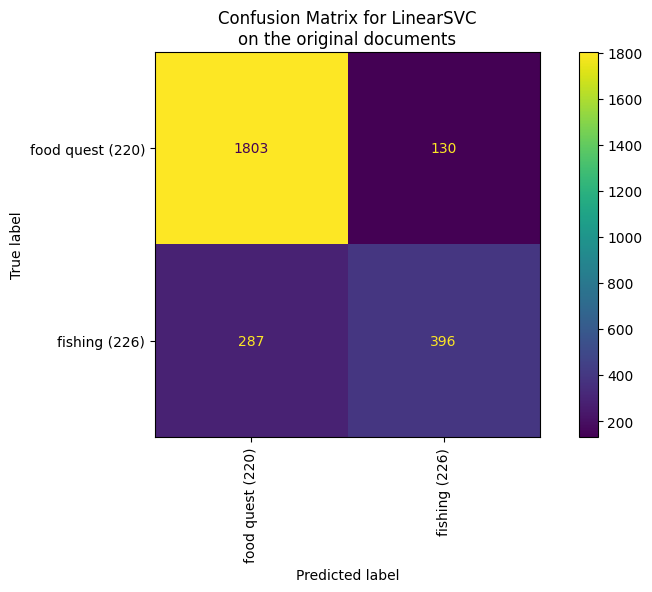

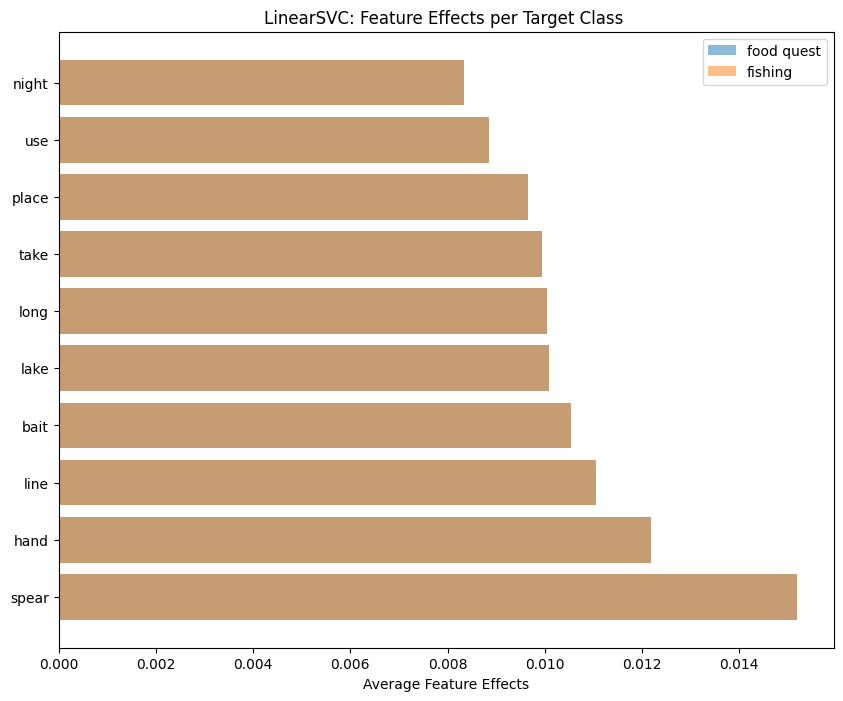

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8130733944954128
              precision    recall  f1-score   support

         220      0.825     0.949     0.882      1933
         226      0.747     0.429     0.545       683

    accuracy                          0.813      2616
   macro avg      0.786     0.689     0.714      2616
weighted avg      0.804     0.813     0.794      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


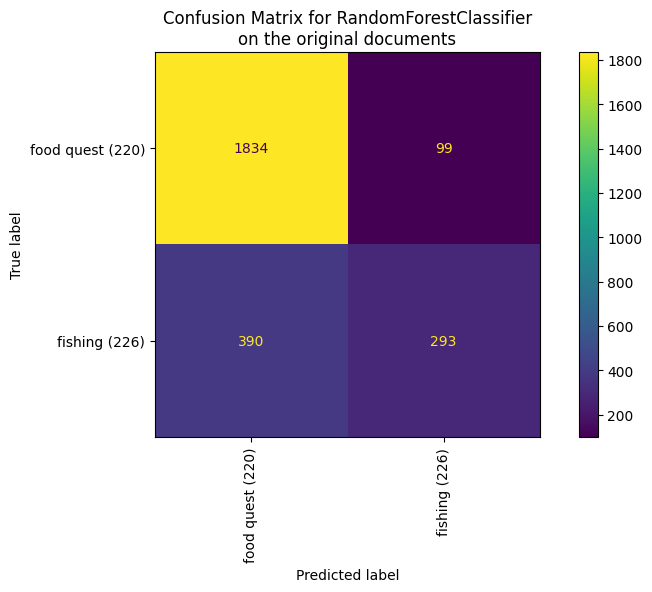

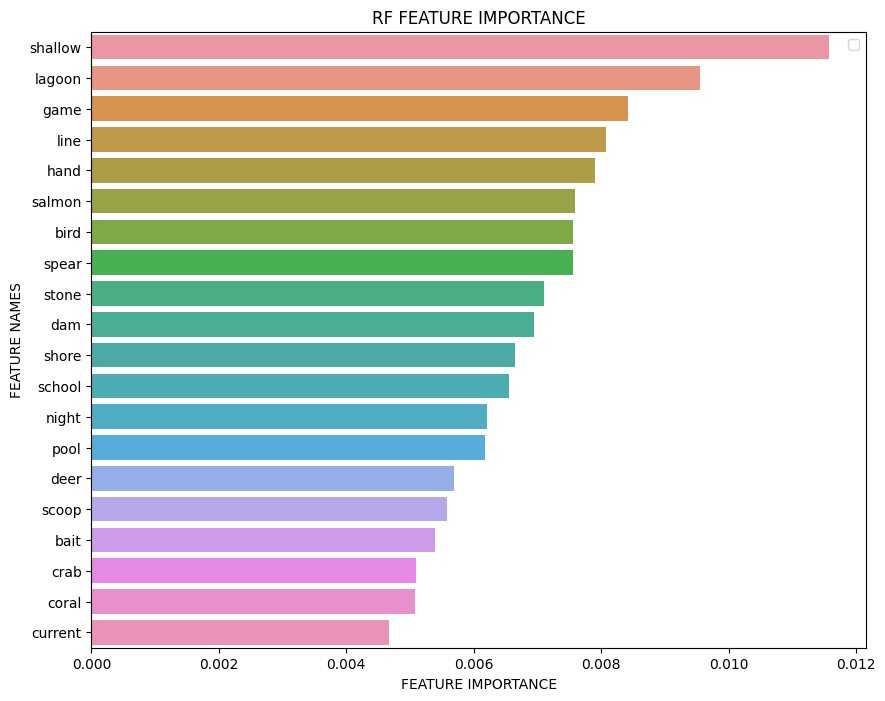

Iteration 3
Exclude: {'crab', 'deer', 'take', 'reef', 'shallow', 'place', 'lagoon', 'long', 'current', 'coral', 'method', 'fisherman', 'weir', 'canoe', 'net', 'pool', 'hole', 'hunter', 'tide', 'catch', 'scoop', 'river', 'large', 'they', 'spear', 'hand', 'fish', 'water', 'sea', 'hook', 'bait', 'small', 'dam', 'stone', 'stream', 'salmon', 'use', 'night', 'animal', 'shore', 'lake', 'game', 'kill', 'bird', 'fishing', 'basket', 'school', 'hunt', 'hunting', 'line'}

(8717,) (8717,)
8717 documents - 3.86MB (training set)
2 categories


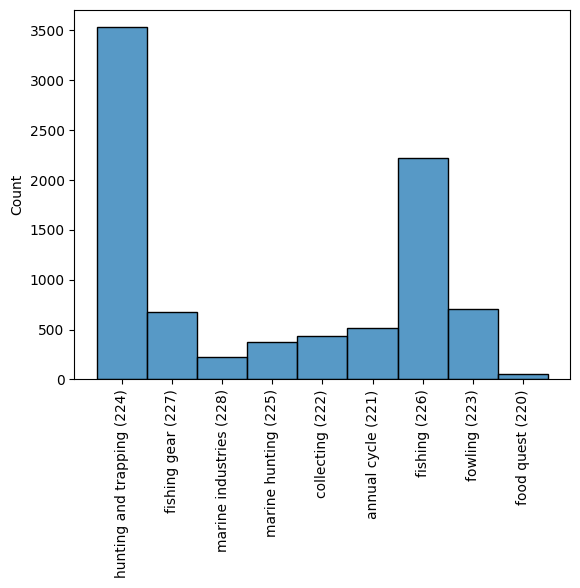

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8172782874617737
              precision    recall  f1-score   support

         220      0.820     0.969     0.888      1964
         226      0.794     0.360     0.496       652

    accuracy                          0.817      2616
   macro avg      0.807     0.665     0.692      2616
weighted avg      0.814     0.817     0.791      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



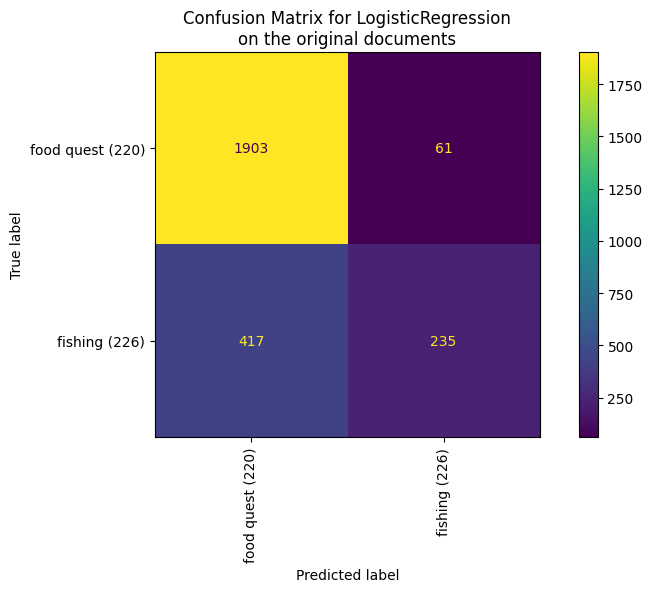

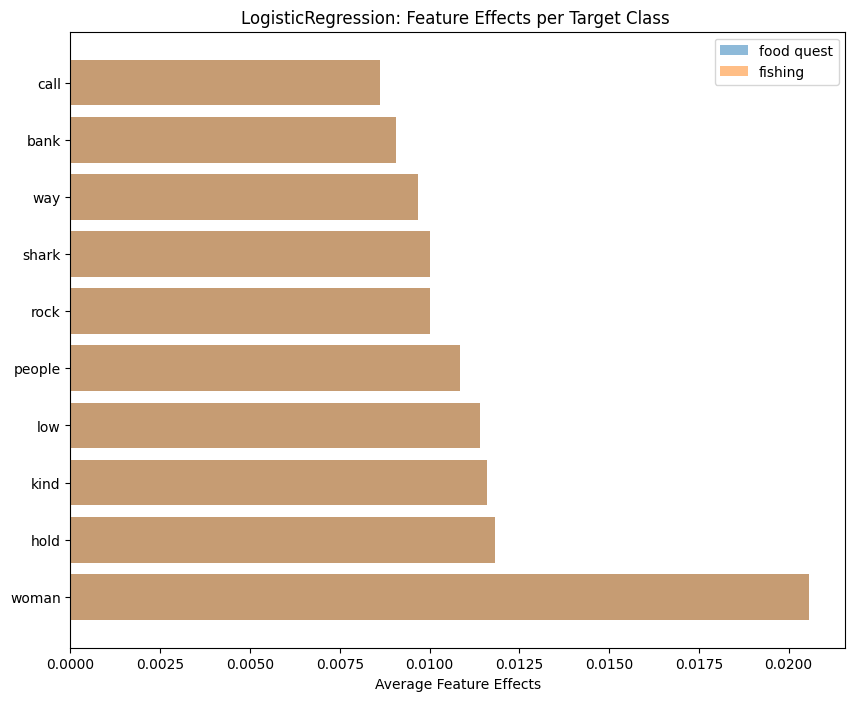

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8230122324159022
              precision    recall  f1-score   support

         220      0.857     0.918     0.886      1964
         226      0.684     0.538     0.603       652

    accuracy                          0.823      2616
   macro avg      0.771     0.728     0.744      2616
weighted avg      0.814     0.823     0.815      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



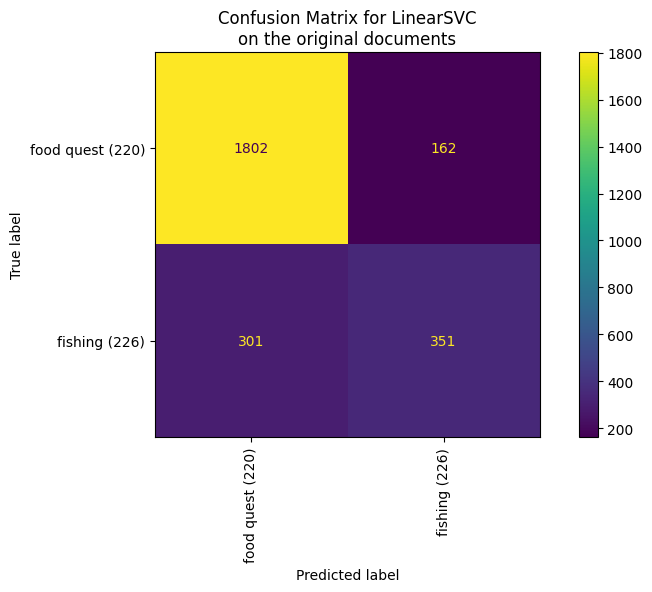

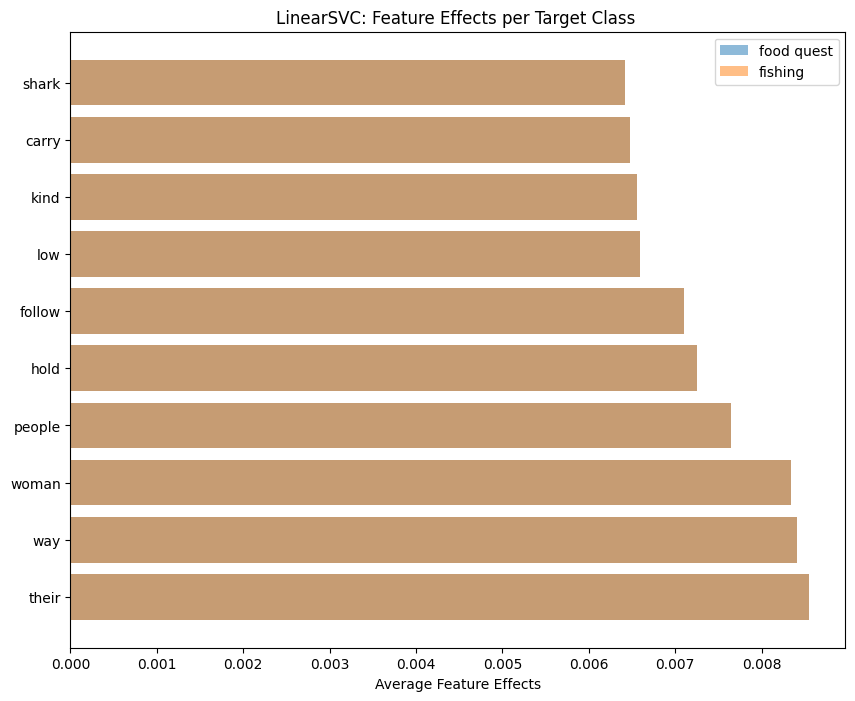

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8134556574923547
              precision    recall  f1-score   support

         220      0.823     0.958     0.885      1964
         226      0.750     0.377     0.502       652

    accuracy                          0.813      2616
   macro avg      0.786     0.668     0.694      2616
weighted avg      0.804     0.813     0.790      2616



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


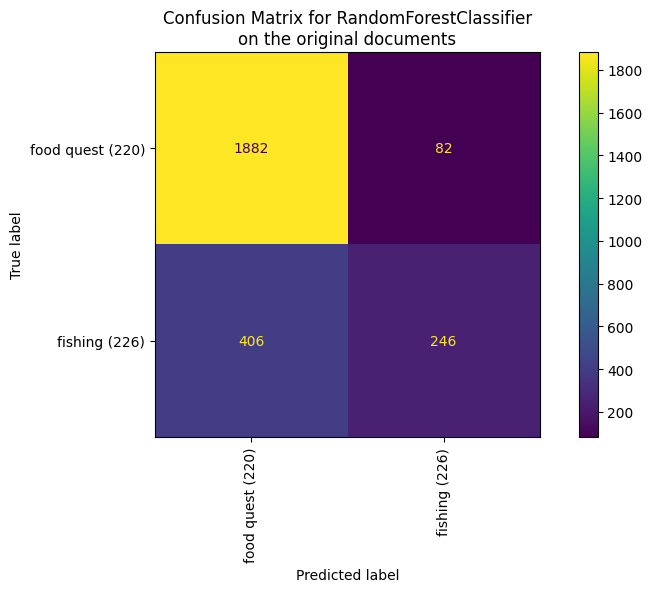

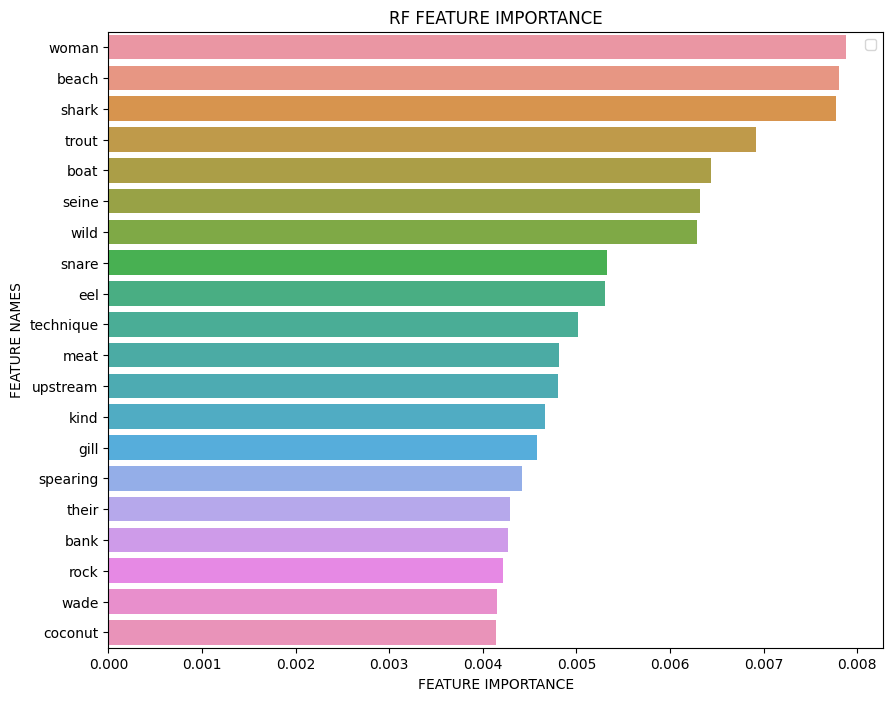

Iteration 1
Exclude: set()

(8183,) (8183,)
8183 documents - 3.58MB (training set)
2 categories


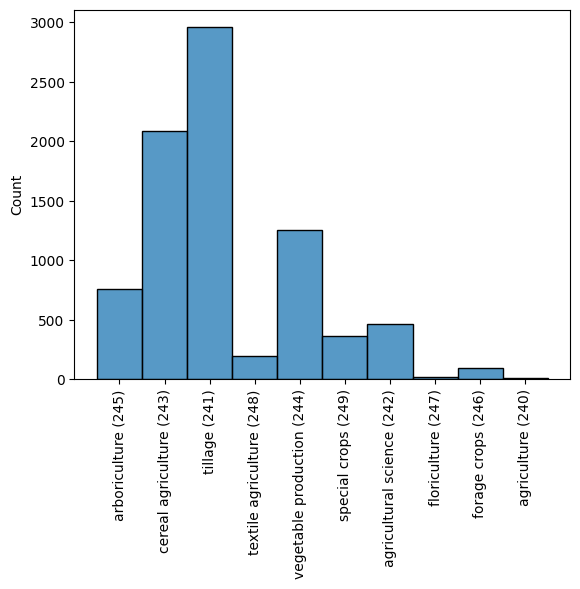

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7177189409368635
              precision    recall  f1-score   support

         240      0.719     0.903     0.801      1544
         241      0.711     0.403     0.514       911

    accuracy                          0.718      2455
   macro avg      0.715     0.653     0.658      2455
weighted avg      0.716     0.718     0.695      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



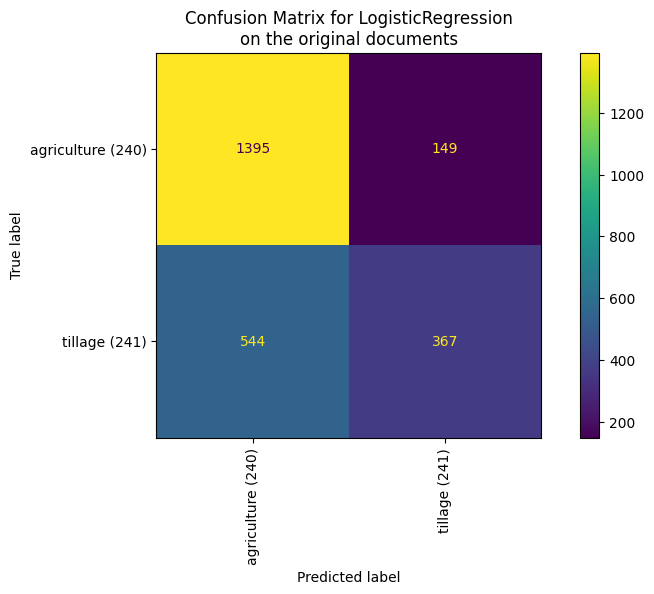

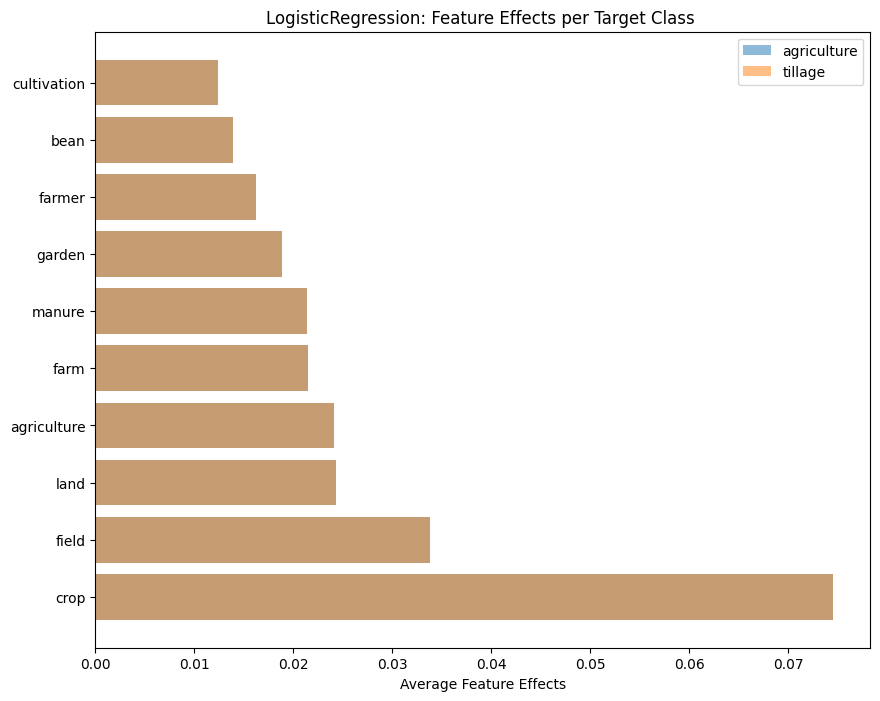

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7160896130346233
              precision    recall  f1-score   support

         240      0.740     0.845     0.789      1544
         241      0.654     0.498     0.566       911

    accuracy                          0.716      2455
   macro avg      0.697     0.671     0.677      2455
weighted avg      0.708     0.716     0.706      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



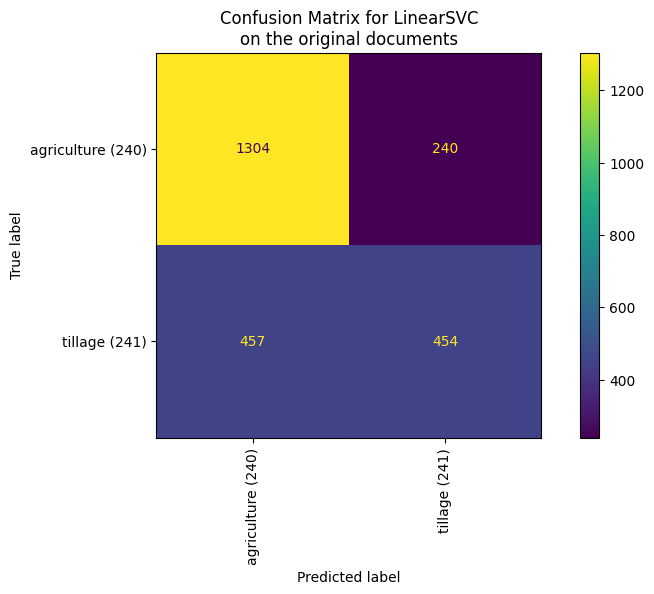

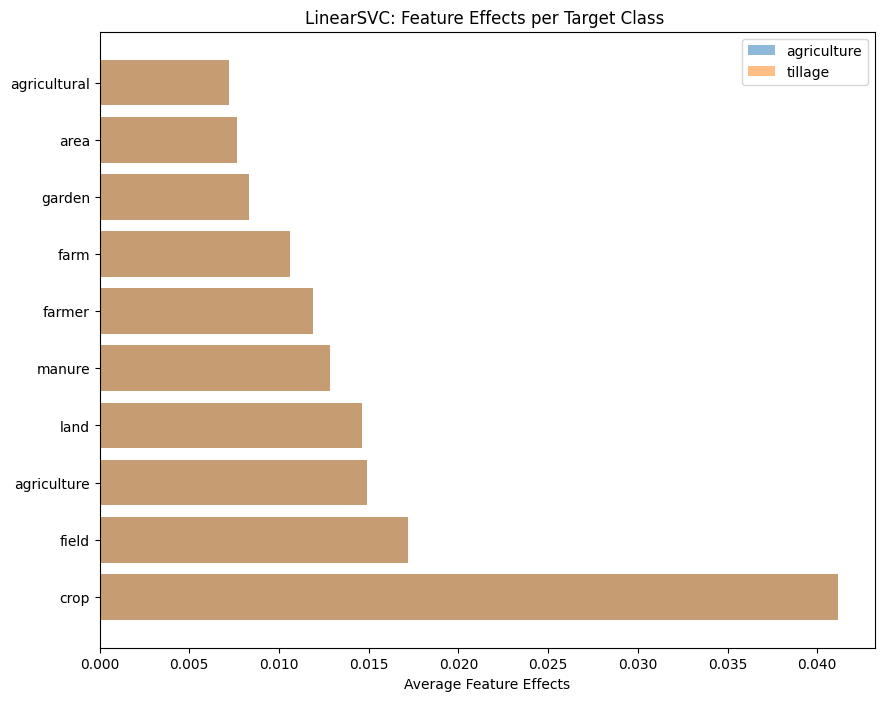

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7144602851323829
              precision    recall  f1-score   support

         240      0.714     0.911     0.801      1544
         241      0.717     0.381     0.497       911

    accuracy                          0.714      2455
   macro avg      0.715     0.646     0.649      2455
weighted avg      0.715     0.714     0.688      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


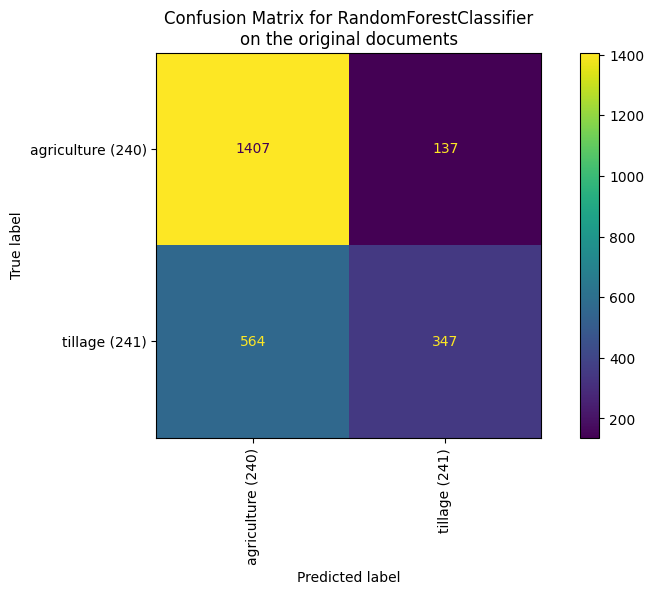

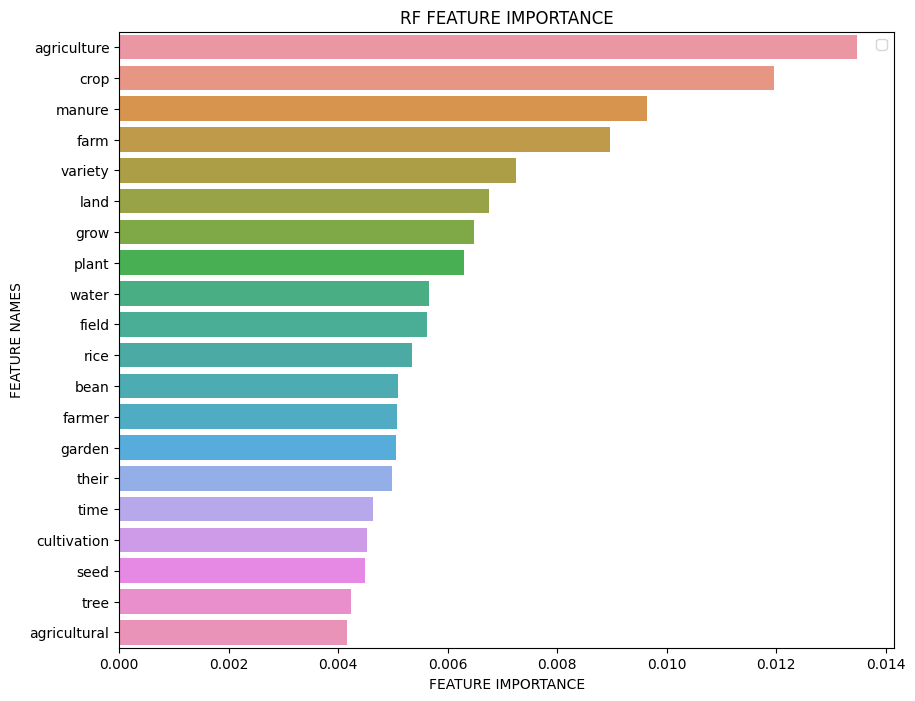

Iteration 2
Exclude: {'seed', 'area', 'water', 'crop', 'land', 'bean', 'farmer', 'cultivation', 'tree', 'agriculture', 'time', 'garden', 'agricultural', 'farm', 'plant', 'field', 'grow', 'manure', 'their', 'variety', 'rice'}

(8183,) (8183,)
8183 documents - 3.58MB (training set)
2 categories


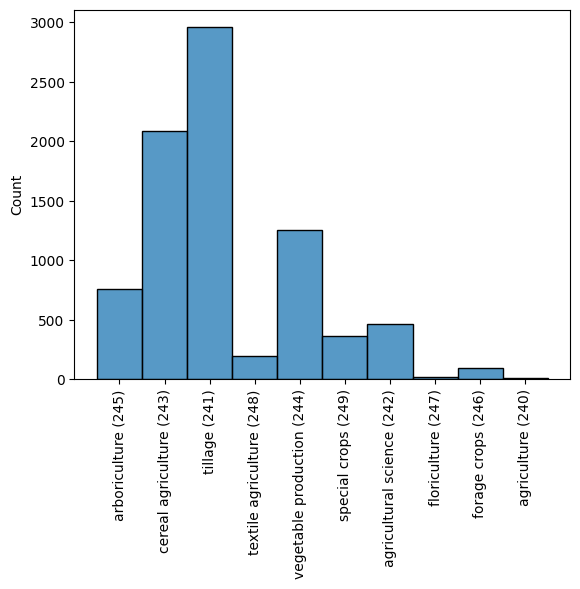

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7270875763747454
              precision    recall  f1-score   support

         240      0.742     0.894     0.811      1611
         241      0.669     0.408     0.507       844

    accuracy                          0.727      2455
   macro avg      0.706     0.651     0.659      2455
weighted avg      0.717     0.727     0.707      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



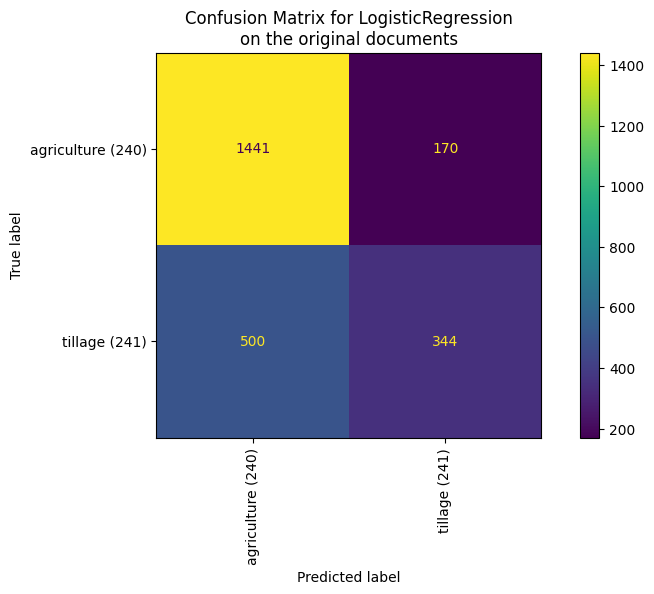

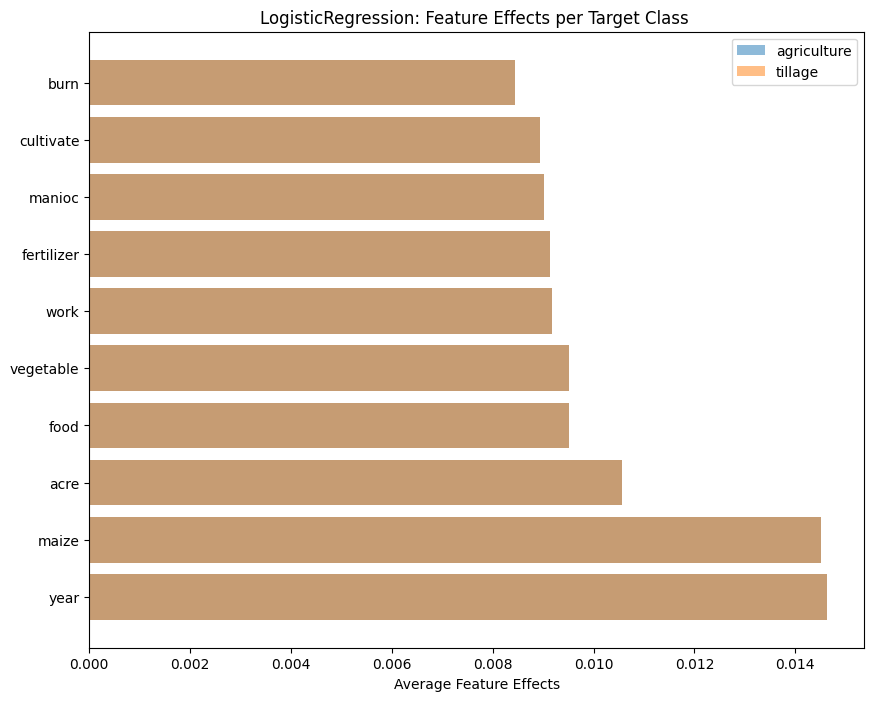

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7099796334012219
              precision    recall  f1-score   support

         240      0.760     0.815     0.787      1611
         241      0.591     0.509     0.547       844

    accuracy                          0.710      2455
   macro avg      0.675     0.662     0.667      2455
weighted avg      0.702     0.710     0.704      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



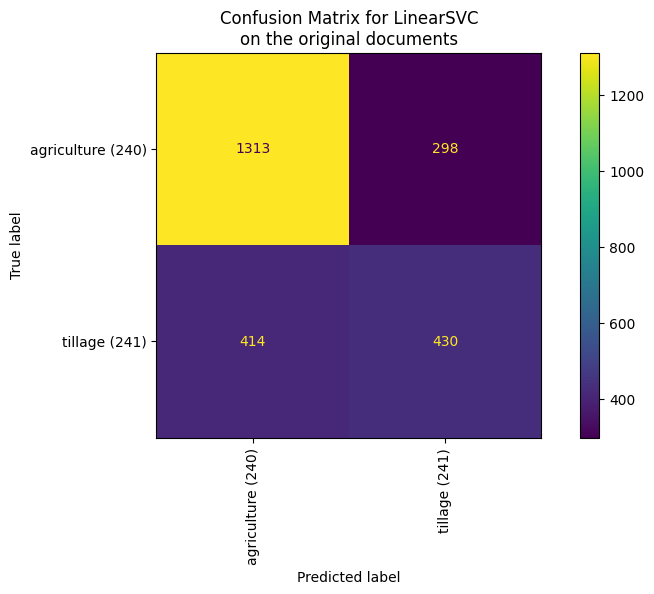

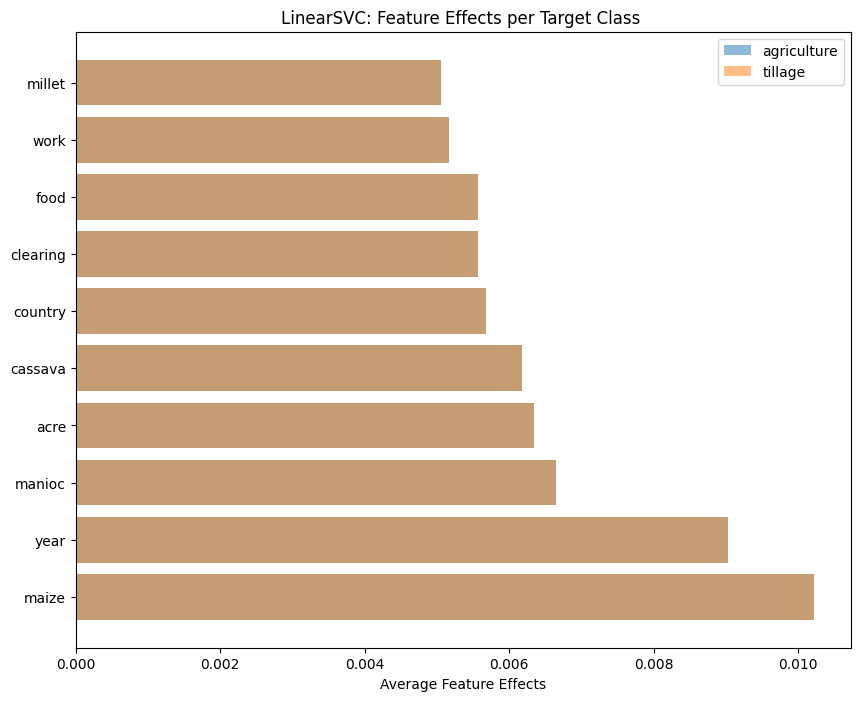

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7213849287169043
              precision    recall  f1-score   support

         240      0.742     0.883     0.806      1611
         241      0.649     0.412     0.504       844

    accuracy                          0.721      2455
   macro avg      0.695     0.648     0.655      2455
weighted avg      0.710     0.721     0.702      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


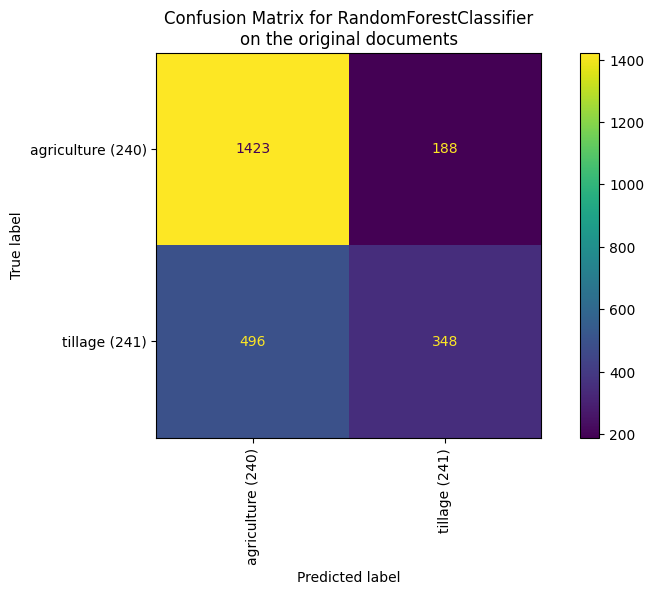

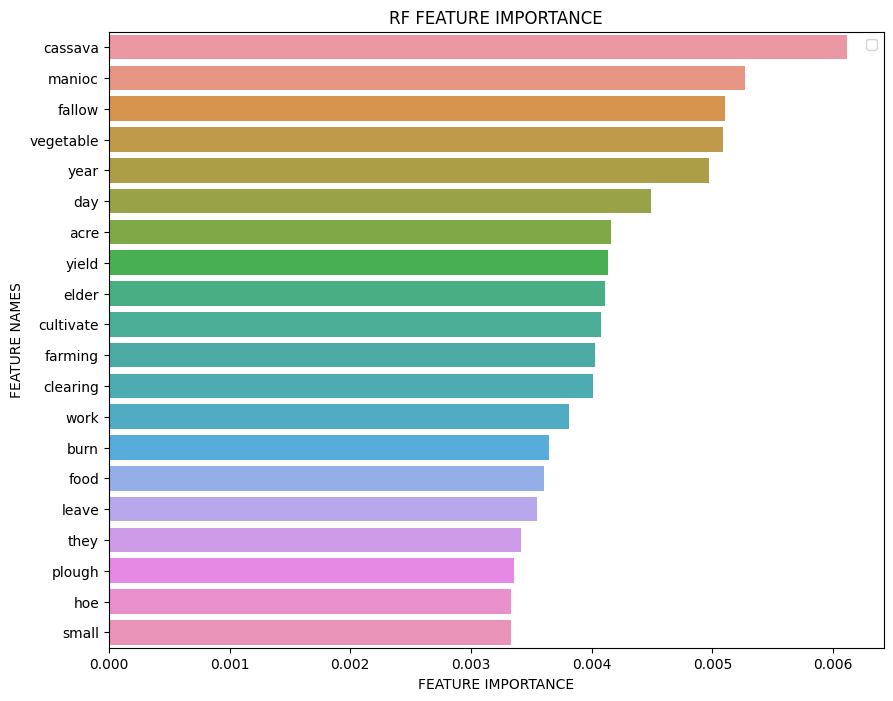

Iteration 3
Exclude: {'land', 'bean', 'fertilizer', 'acre', 'cultivate', 'yield', 'tree', 'year', 'millet', 'food', 'time', 'garden', 'day', 'farm', 'plant', 'they', 'field', 'cassava', 'fallow', 'clearing', 'manioc', 'variety', 'manure', 'rice', 'seed', 'area', 'water', 'crop', 'farming', 'work', 'hoe', 'farmer', 'cultivation', 'country', 'elder', 'small', 'maize', 'burn', 'agriculture', 'plough', 'agricultural', 'vegetable', 'grow', 'leave', 'their'}

(8183,) (8183,)
8183 documents - 3.58MB (training set)
2 categories


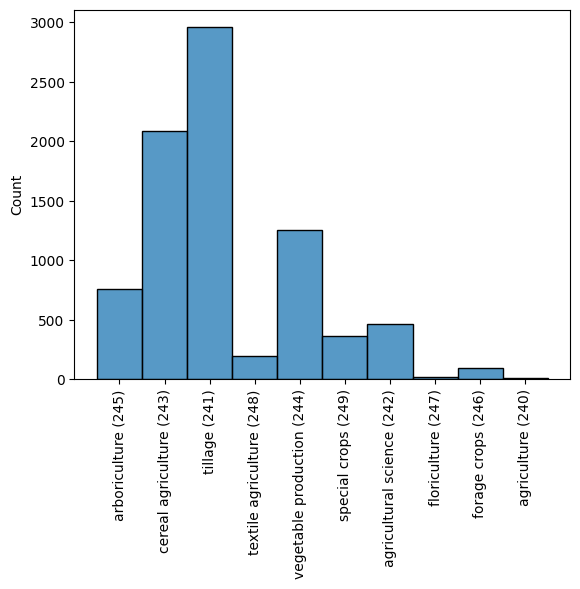

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7116089613034623
              precision    recall  f1-score   support

         240      0.715     0.916     0.803      1579
         241      0.694     0.344     0.460       876

    accuracy                          0.712      2455
   macro avg      0.705     0.630     0.631      2455
weighted avg      0.708     0.712     0.681      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



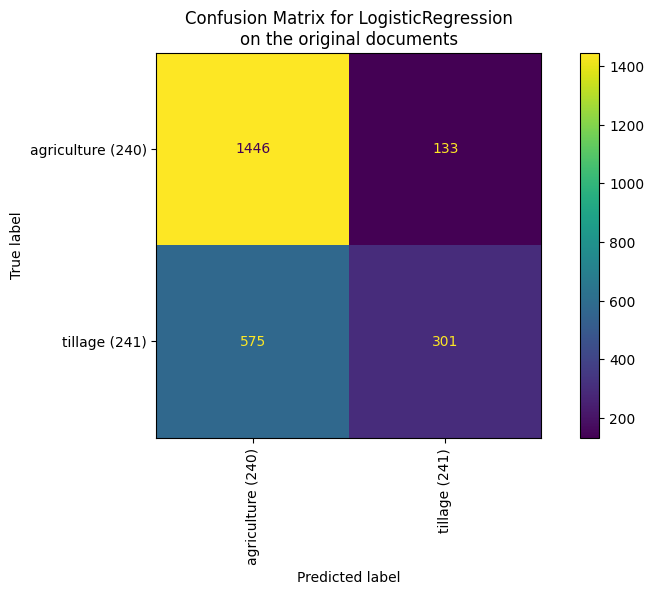

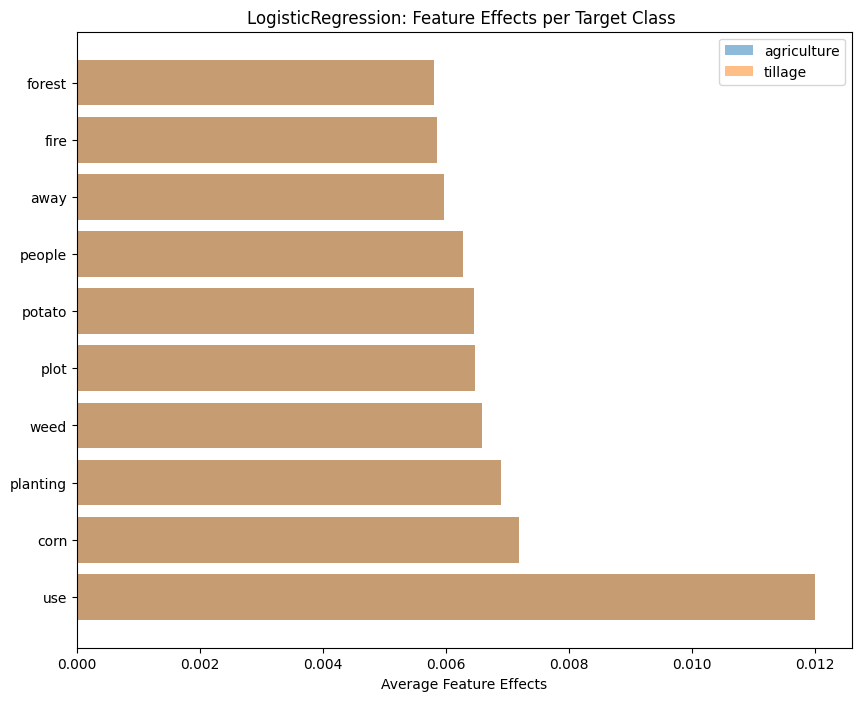

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6945010183299389
              precision    recall  f1-score   support

         240      0.736     0.818     0.775      1579
         241      0.590     0.473     0.525       876

    accuracy                          0.695      2455
   macro avg      0.663     0.645     0.650      2455
weighted avg      0.684     0.695     0.686      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



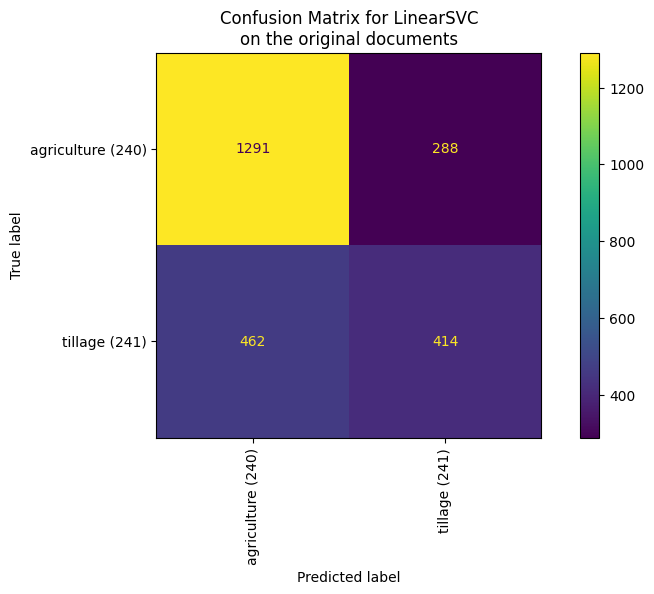

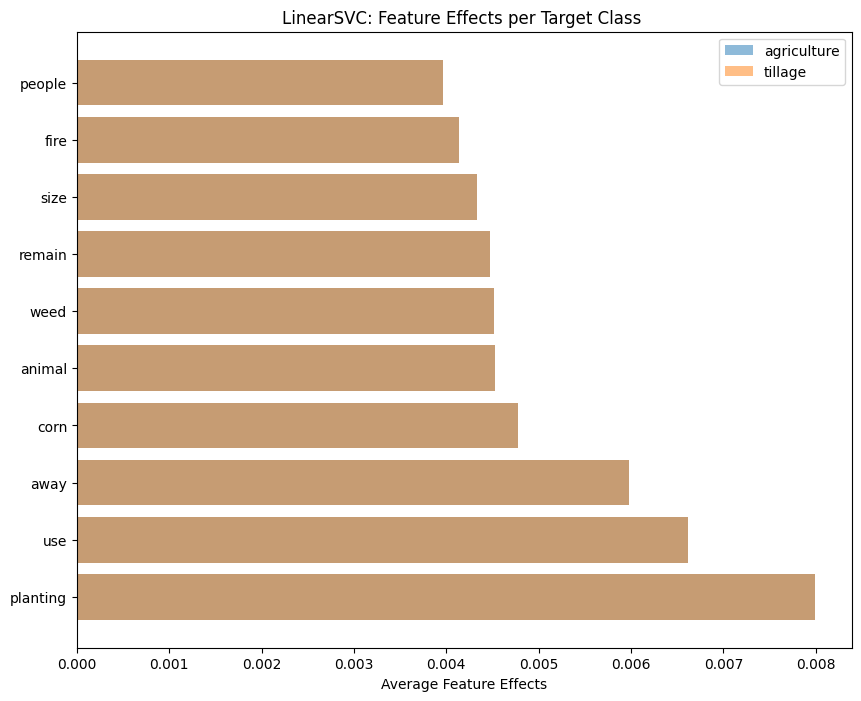

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7010183299389002
              precision    recall  f1-score   support

         240      0.712     0.899     0.795      1579
         241      0.654     0.344     0.451       876

    accuracy                          0.701      2455
   macro avg      0.683     0.621     0.623      2455
weighted avg      0.691     0.701     0.672      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


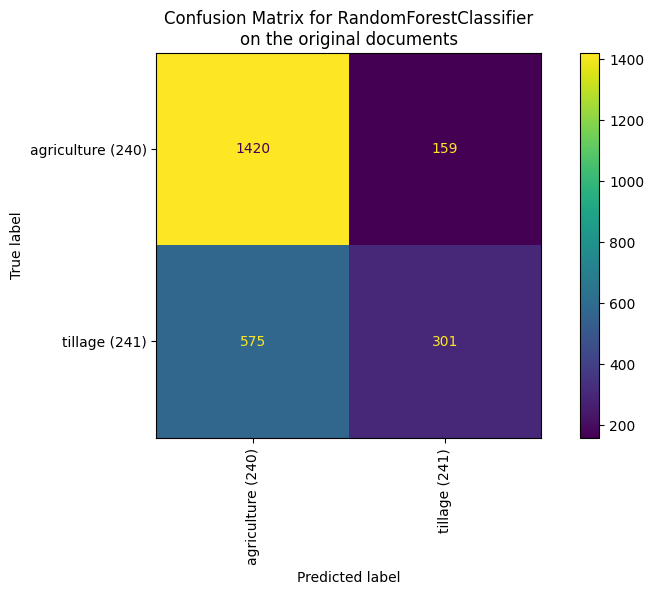

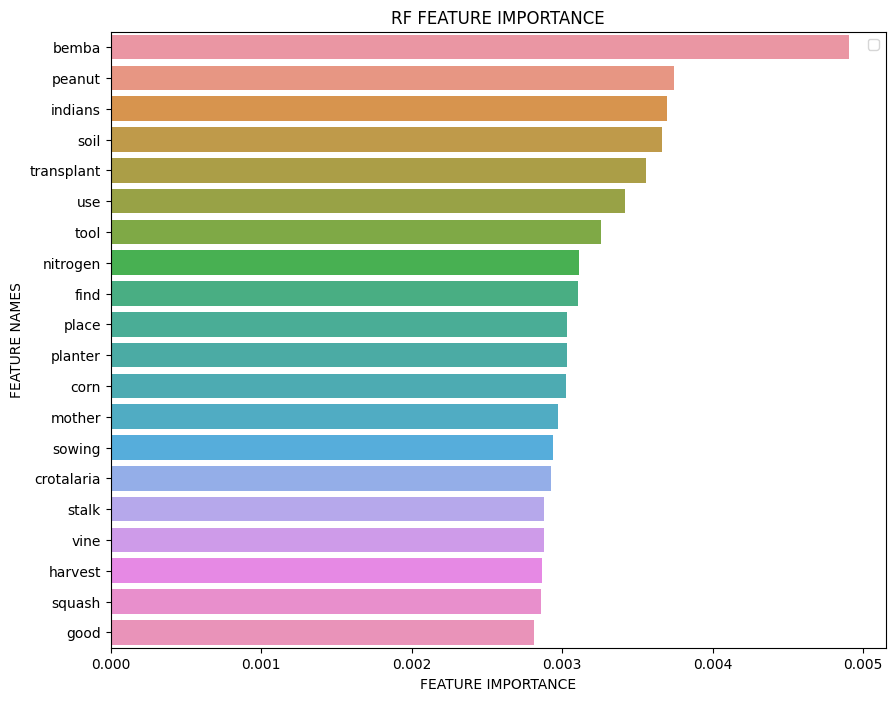

Iteration 1
Exclude: set()

(8183,) (8183,)
8183 documents - 3.58MB (training set)
2 categories


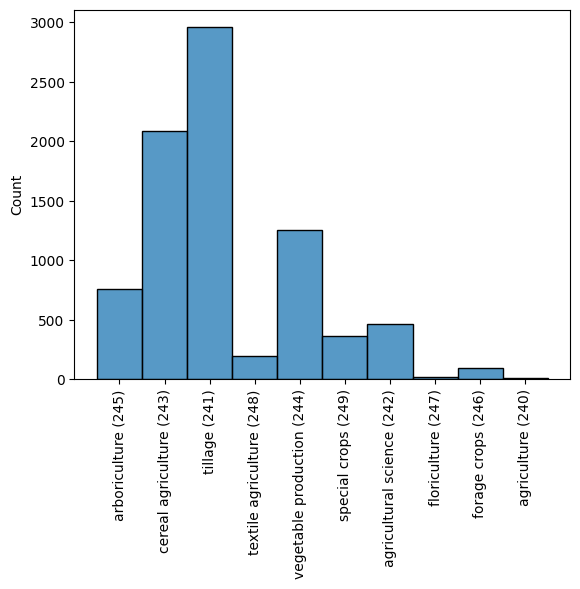

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8167006109979633
              precision    recall  f1-score   support

         240      0.815     0.970     0.886      1802
         243      0.826     0.394     0.533       653

    accuracy                          0.817      2455
   macro avg      0.821     0.682     0.710      2455
weighted avg      0.818     0.817     0.792      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



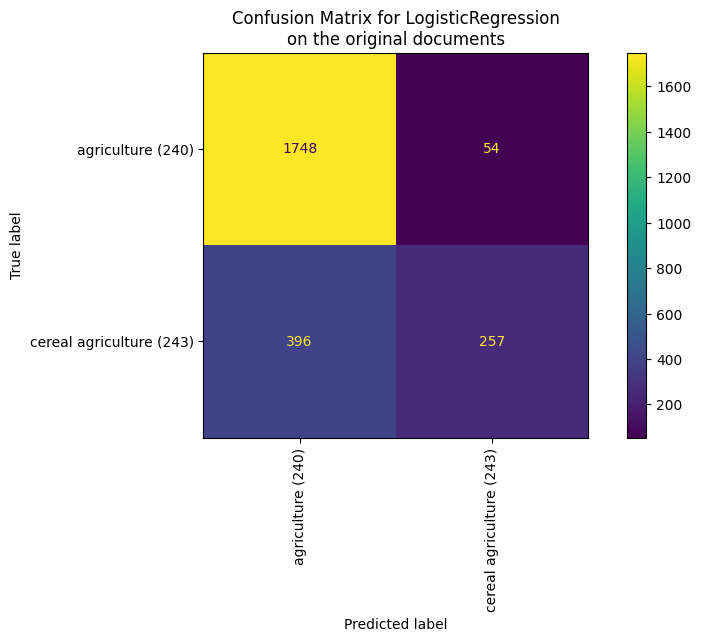

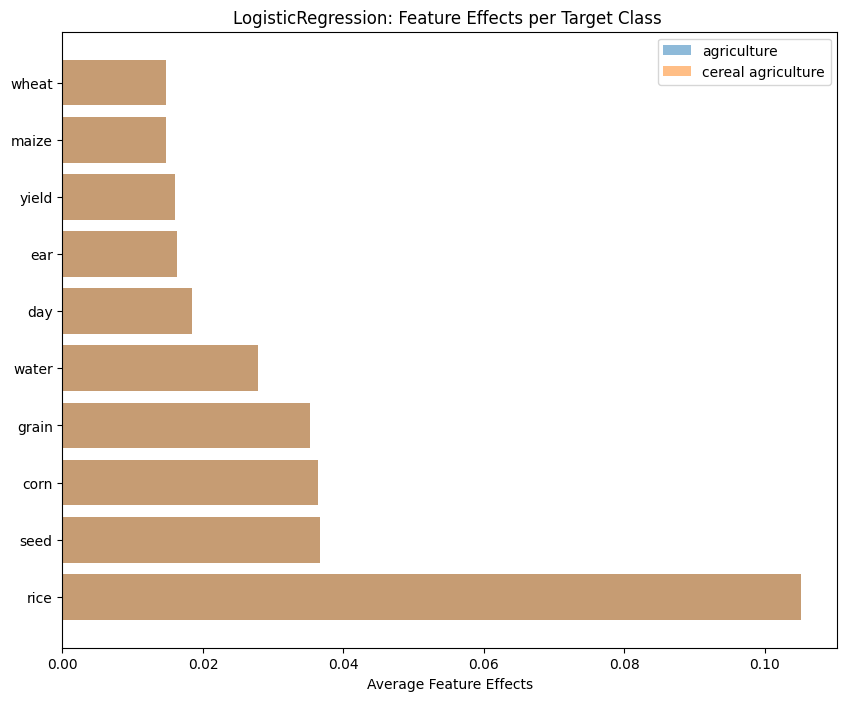

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8215885947046844
              precision    recall  f1-score   support

         240      0.841     0.934     0.885      1802
         243      0.737     0.511     0.604       653

    accuracy                          0.822      2455
   macro avg      0.789     0.723     0.744      2455
weighted avg      0.813     0.822     0.810      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



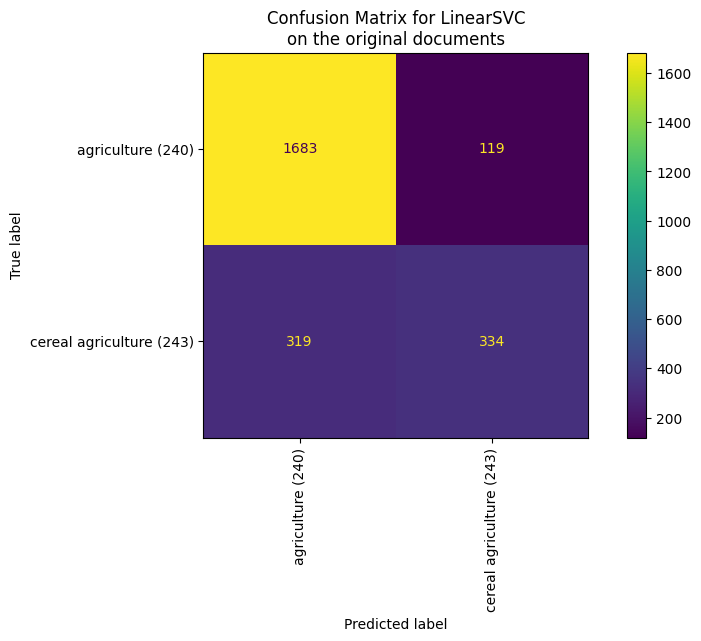

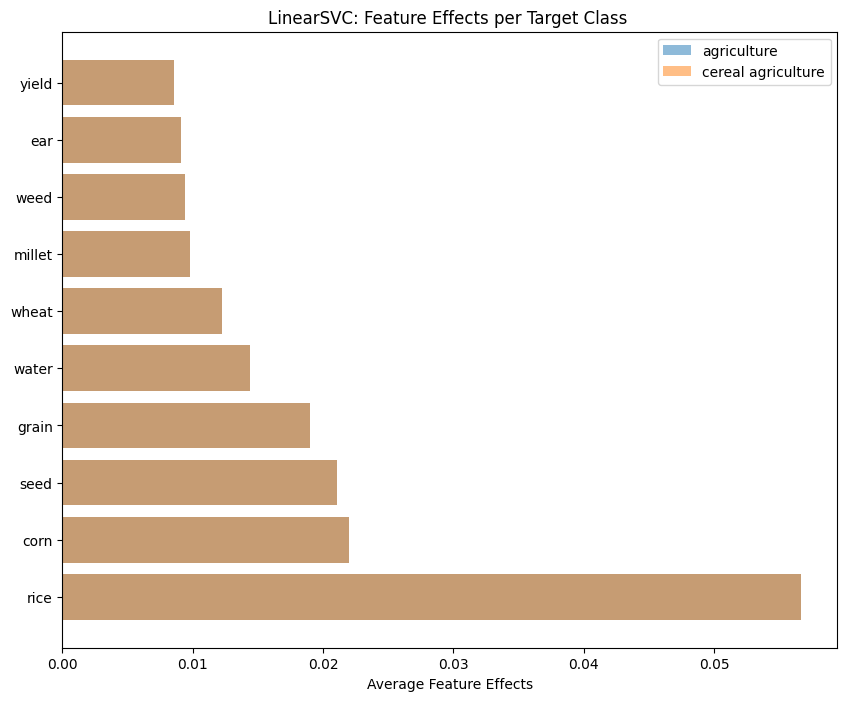

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8024439918533605
              precision    recall  f1-score   support

         240      0.803     0.969     0.878      1802
         243      0.800     0.343     0.480       653

    accuracy                          0.802      2455
   macro avg      0.801     0.656     0.679      2455
weighted avg      0.802     0.802     0.772      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


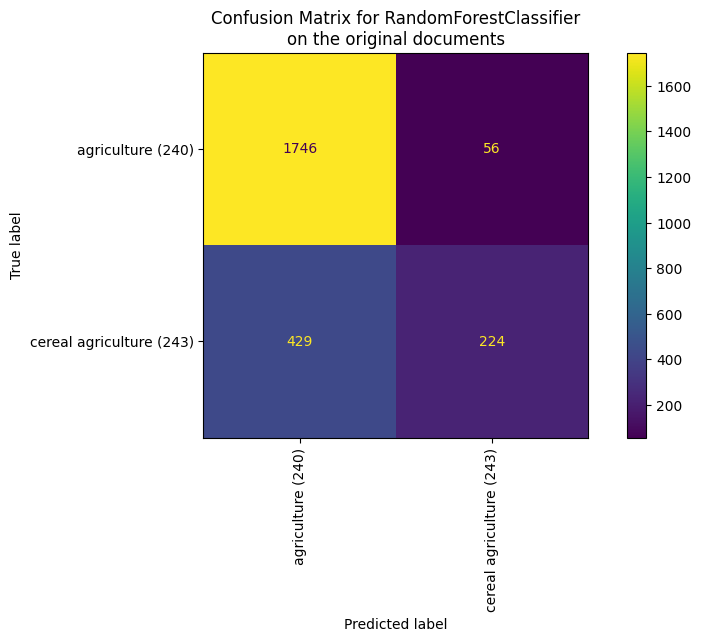

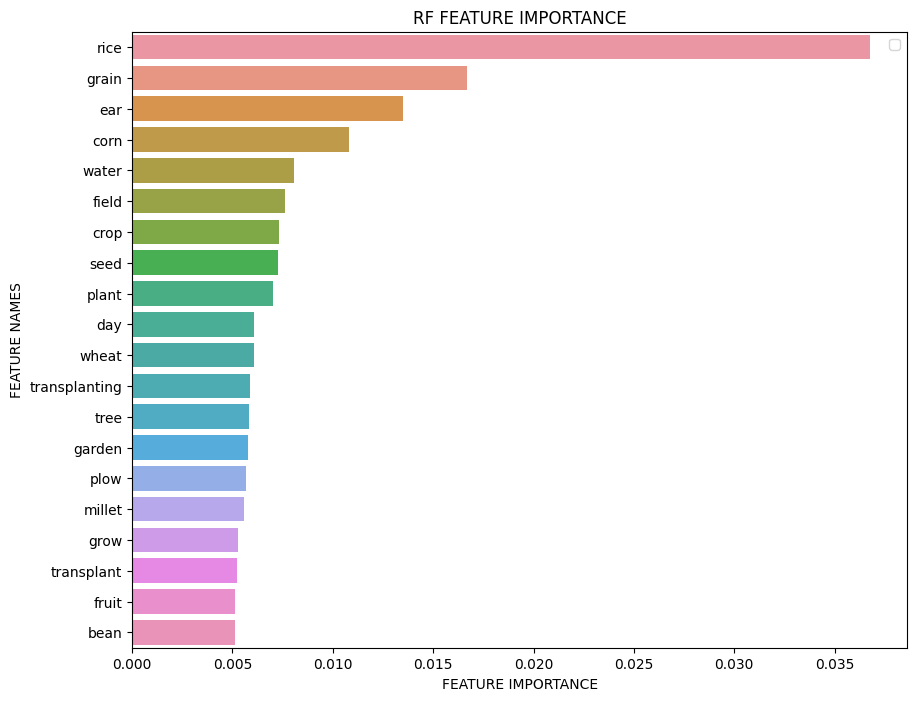

Iteration 2
Exclude: {'seed', 'water', 'crop', 'yield', 'bean', 'maize', 'fruit', 'tree', 'wheat', 'millet', 'transplanting', 'corn', 'garden', 'day', 'plant', 'transplant', 'ear', 'weed', 'field', 'plow', 'grow', 'grain', 'rice'}

(8183,) (8183,)
8183 documents - 3.58MB (training set)
2 categories


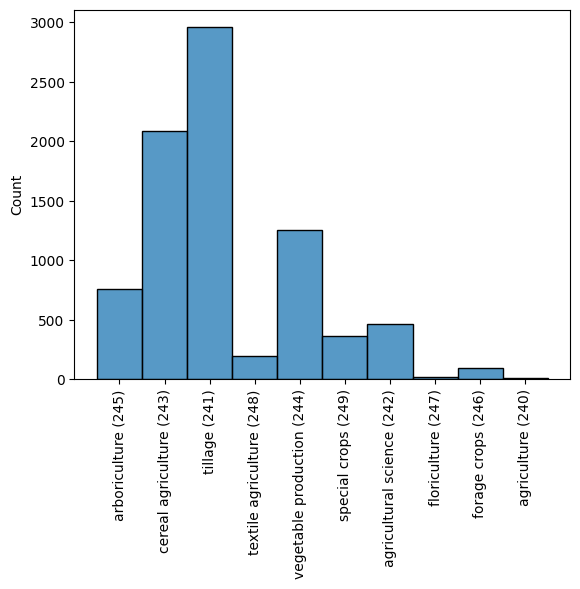

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8040733197556008
              precision    recall  f1-score   support

         240      0.802     0.980     0.882      1835
         243      0.826     0.284     0.423       620

    accuracy                          0.804      2455
   macro avg      0.814     0.632     0.652      2455
weighted avg      0.808     0.804     0.766      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



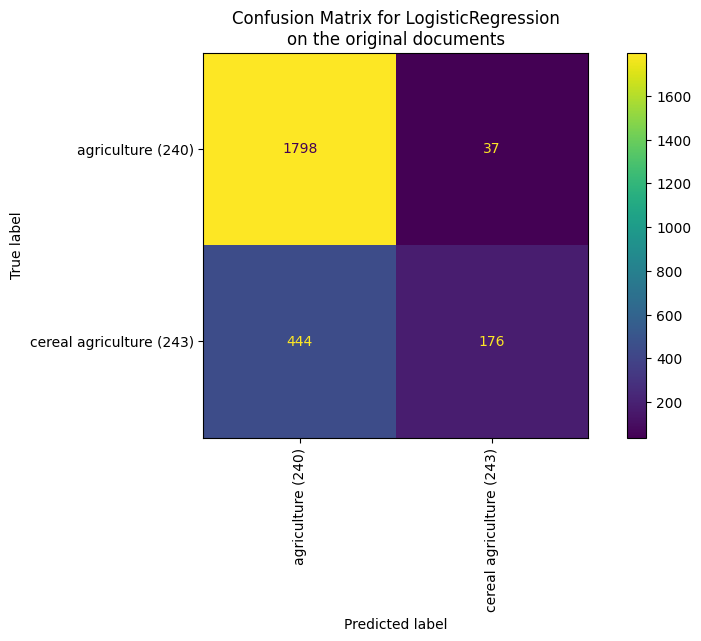

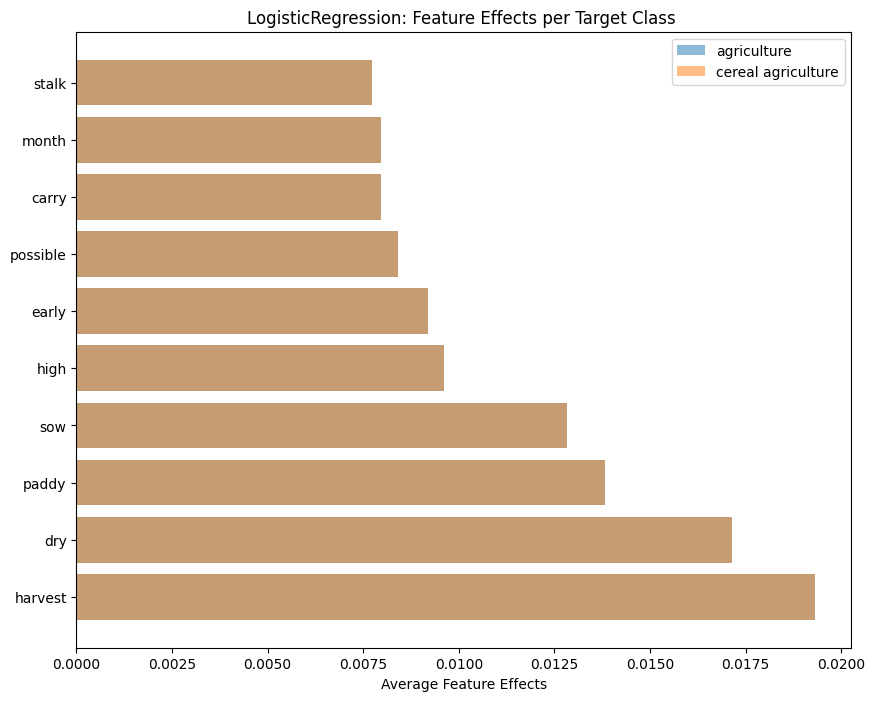

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8171079429735234
              precision    recall  f1-score   support

         240      0.844     0.926     0.883      1835
         243      0.694     0.494     0.577       620

    accuracy                          0.817      2455
   macro avg      0.769     0.710     0.730      2455
weighted avg      0.806     0.817     0.806      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



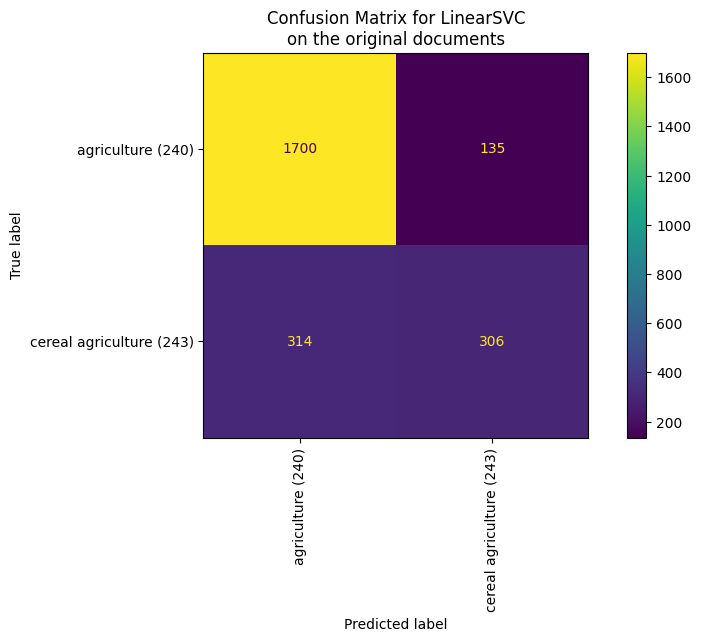

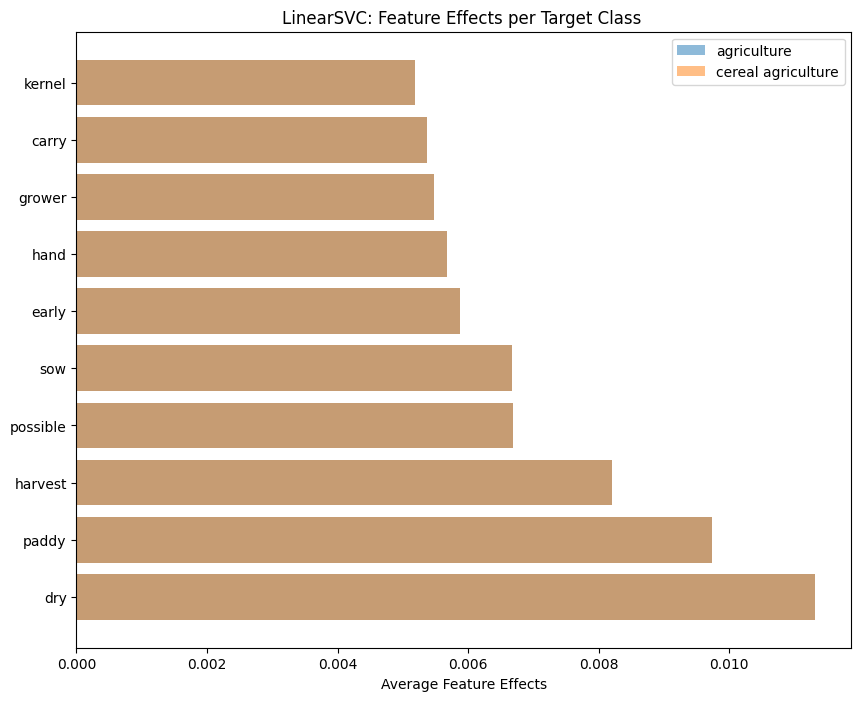

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8008146639511201
              precision    recall  f1-score   support

         240      0.800     0.978     0.880      1835
         243      0.808     0.277     0.413       620

    accuracy                          0.801      2455
   macro avg      0.804     0.628     0.647      2455
weighted avg      0.802     0.801     0.762      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


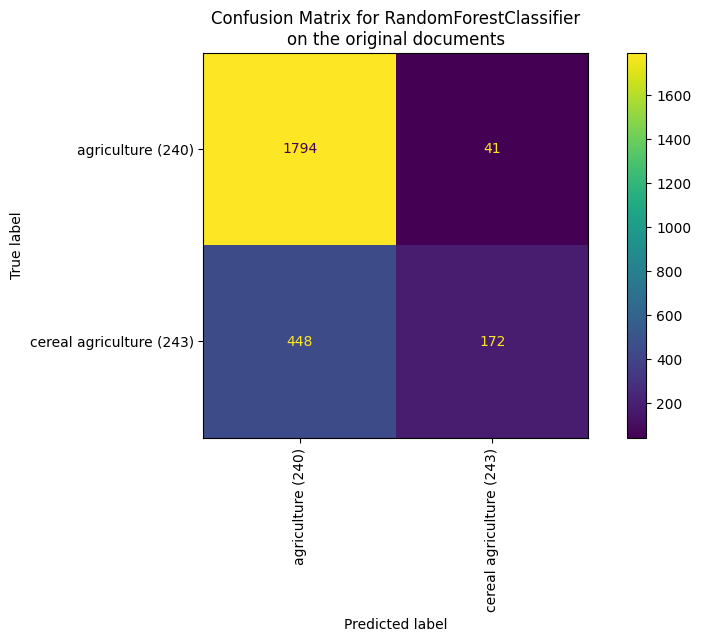

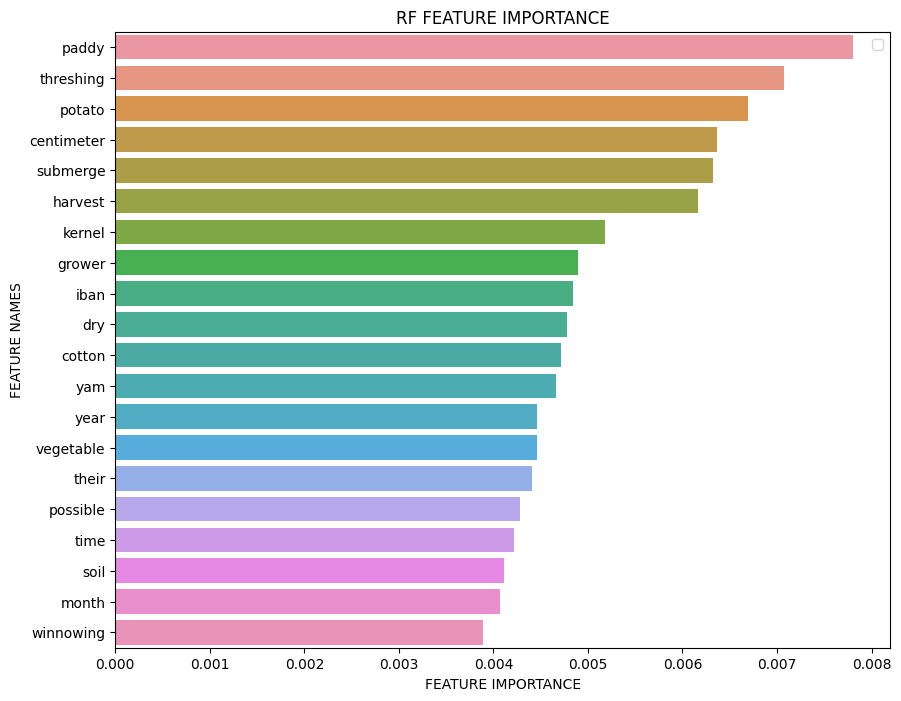

Iteration 3
Exclude: {'carry', 'yield', 'bean', 'sow', 'fruit', 'tree', 'year', 'millet', 'transplanting', 'high', 'early', 'corn', 'time', 'garden', 'day', 'plant', 'submerge', 'month', 'ear', 'field', 'centimeter', 'harvest', 'hand', 'kernel', 'rice', 'possible', 'seed', 'potato', 'stalk', 'water', 'crop', 'dry', 'iban', 'maize', 'grower', 'soil', 'wheat', 'threshing', 'paddy', 'yam', 'transplant', 'vegetable', 'cotton', 'weed', 'plow', 'grow', 'winnowing', 'their', 'grain'}

(8183,) (8183,)
8183 documents - 3.58MB (training set)
2 categories


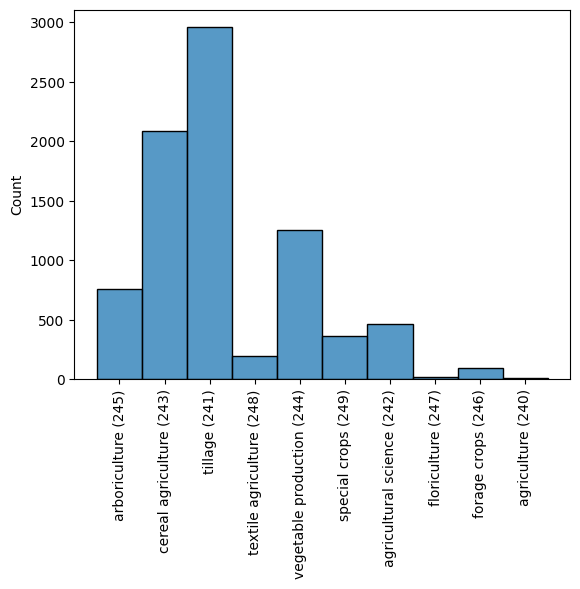

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7812627291242362
              precision    recall  f1-score   support

         240      0.782     0.979     0.869      1824
         243      0.776     0.209     0.330       631

    accuracy                          0.781      2455
   macro avg      0.779     0.594     0.599      2455
weighted avg      0.780     0.781     0.731      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



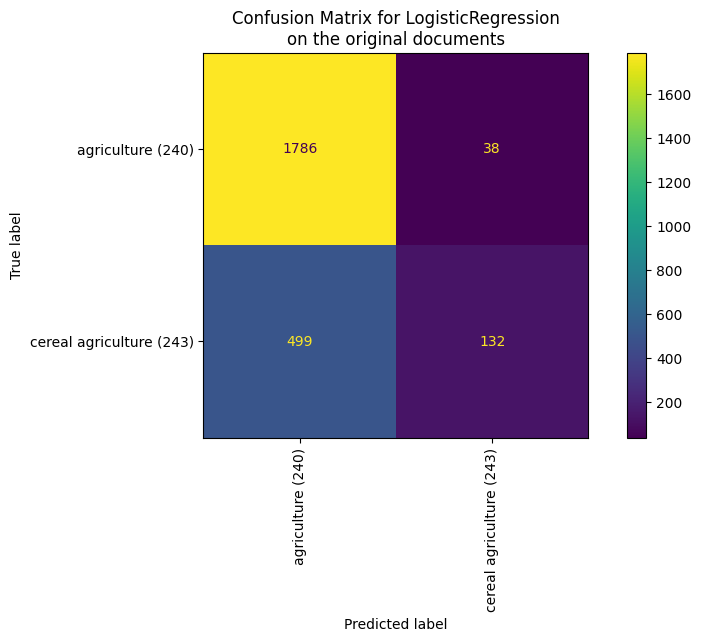

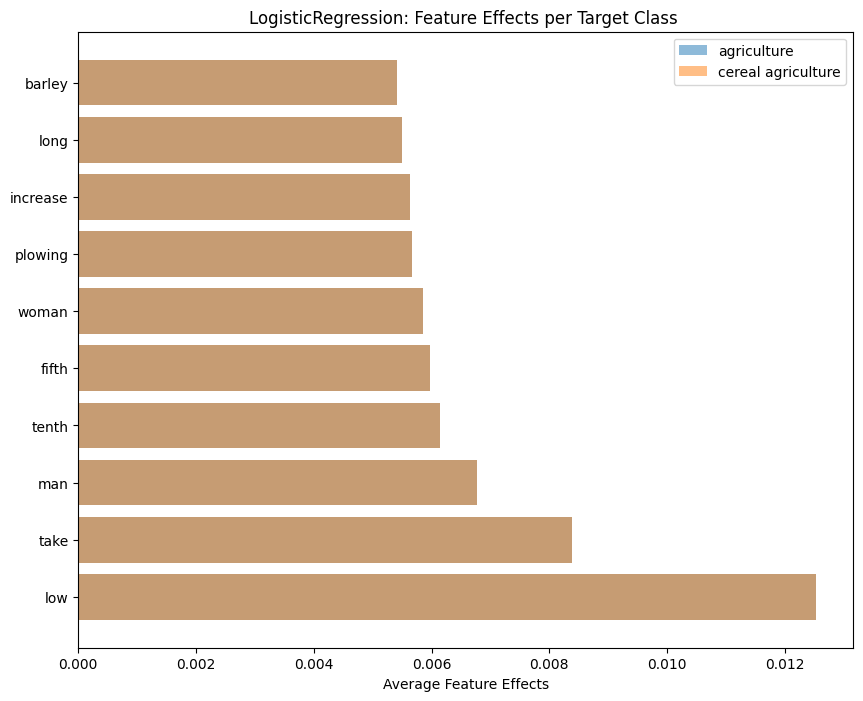

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7975560081466395
              precision    recall  f1-score   support

         240      0.828     0.919     0.871      1824
         243      0.656     0.447     0.532       631

    accuracy                          0.798      2455
   macro avg      0.742     0.683     0.701      2455
weighted avg      0.783     0.798     0.784      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



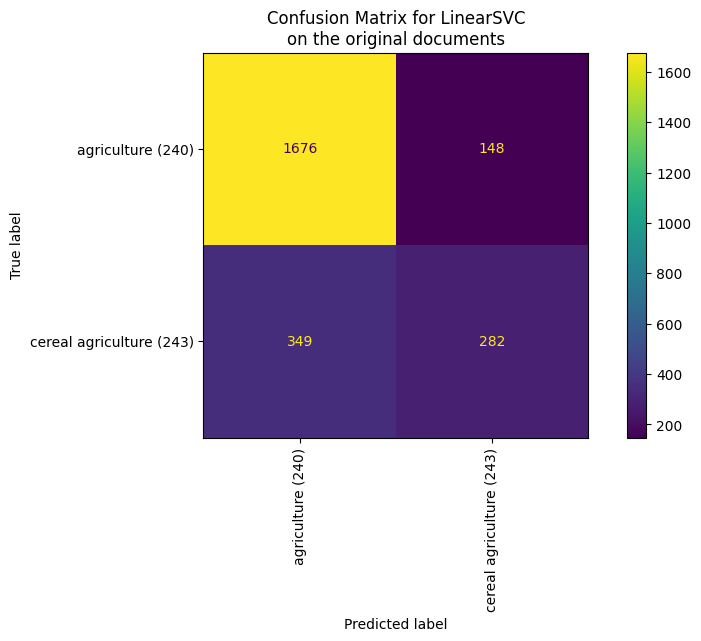

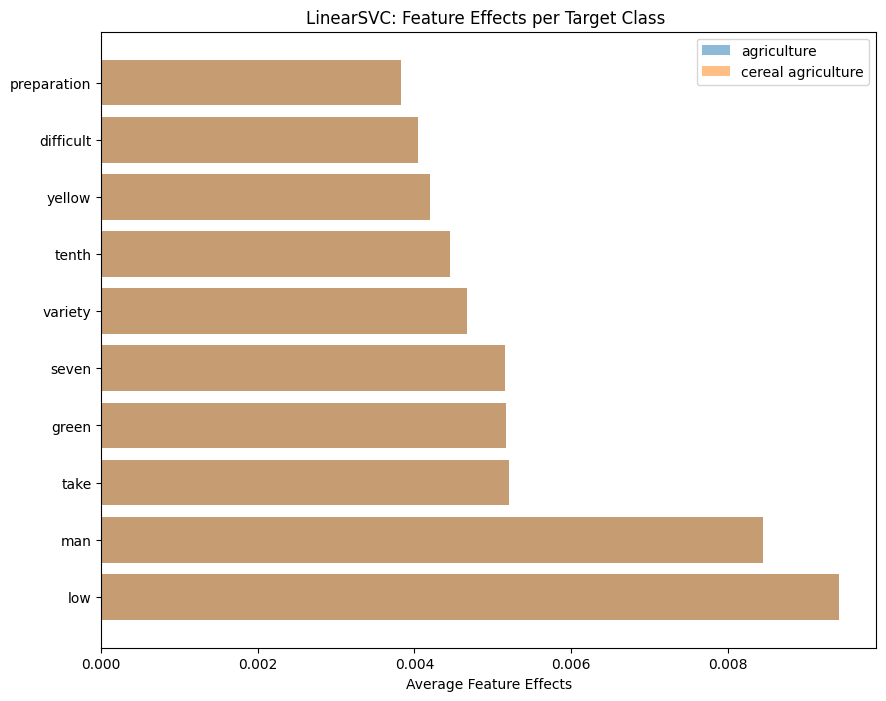

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7812627291242362
              precision    recall  f1-score   support

         240      0.788     0.965     0.868      1824
         243      0.714     0.249     0.369       631

    accuracy                          0.781      2455
   macro avg      0.751     0.607     0.618      2455
weighted avg      0.769     0.781     0.740      2455



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


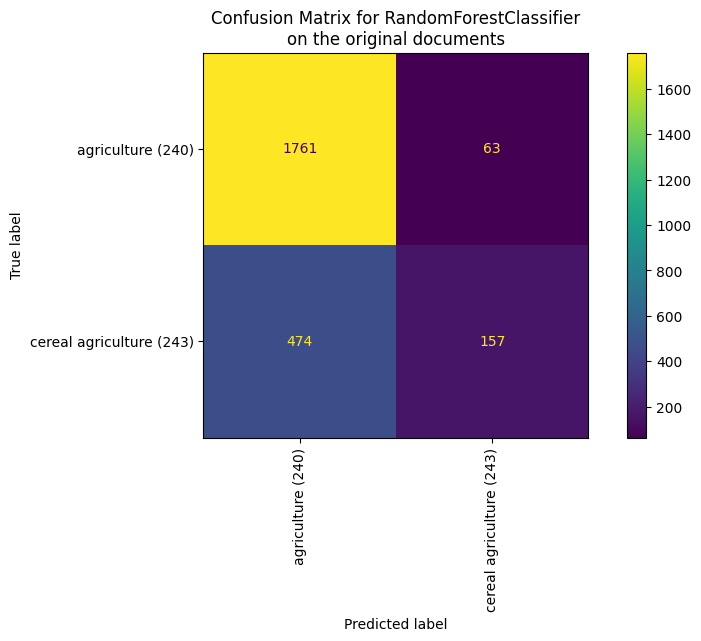

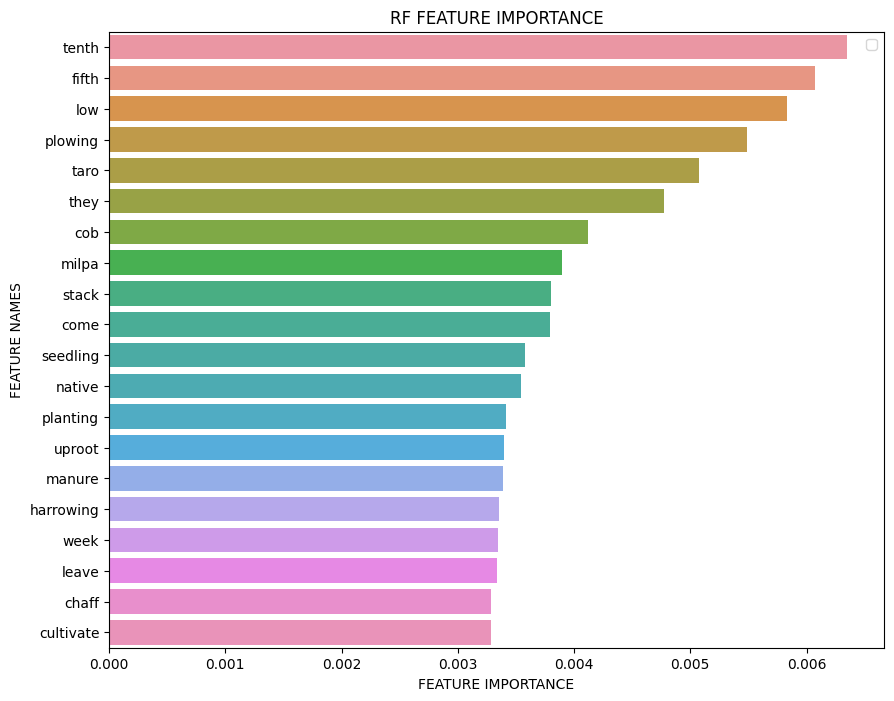

In [12]:
results = defaultdict(dict)
for i in [224, 226, 241, 243]:
    curr_results = iterative_process(common_indicators=False,
                                models=['LR', 'SVM', 'RF'], 
                                specific_cat=i, exact=True, 
                                balanced=False,
                                verbose=True)
    results[i] = curr_results

In [13]:
results

defaultdict(dict,
            {224: defaultdict(dict,
                         {0: {'df':         Unnamed: 0              sreid          section          sectpar   
                           158599      173787    ou09-110-008835  ou09-110-008669  ou09-110-007927  \
                           90020        99792    nf06-005-008296  nf06-005-008286  nf06-005-008043   
                           102136      112290    nn11-001-016483  nn11-001-016182  nn11-001-013662   
                           151443      165991    or15-010-001382  or15-010-001321  or15-010-001122   
                           92635       102482    ng06-001-001046  ng06-001-000813  ng06-001-000315   
                           ...            ...                ...              ...              ...   
                           64504        71051    fx20-001-013471  fx20-001-013469  fx20-001-013352   
                           154746      169491    ot11-001-016443  ot11-001-016314              NaN   
                   

# Cat vs subcategories (multi-class classification)



Balanced: True
Iteration 1
Exclude: set()

(25545,) (25545,)
25545 documents - 13.69MB (training set)
9 categories


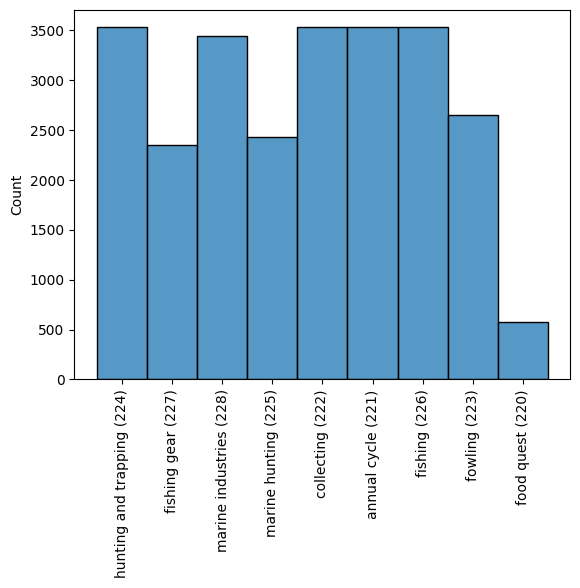

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7058977035490606
              precision    recall  f1-score   support

         220      0.786     0.060     0.111       184
         221      0.704     0.727     0.715      1050
         222      0.486     0.854     0.619      1072
         223      0.875     0.658     0.751       789
         224      0.797     0.777     0.787      1046
         225      0.881     0.720     0.792       738
         226      0.702     0.639     0.669      1034
         227      0.690     0.493     0.575       688
         228      0.829     0.807     0.818      1063

    accuracy                          0.706      7664
   macro avg      0.750     0.637     0.649      7664
weighted avg      0.739     0.706     0.704      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



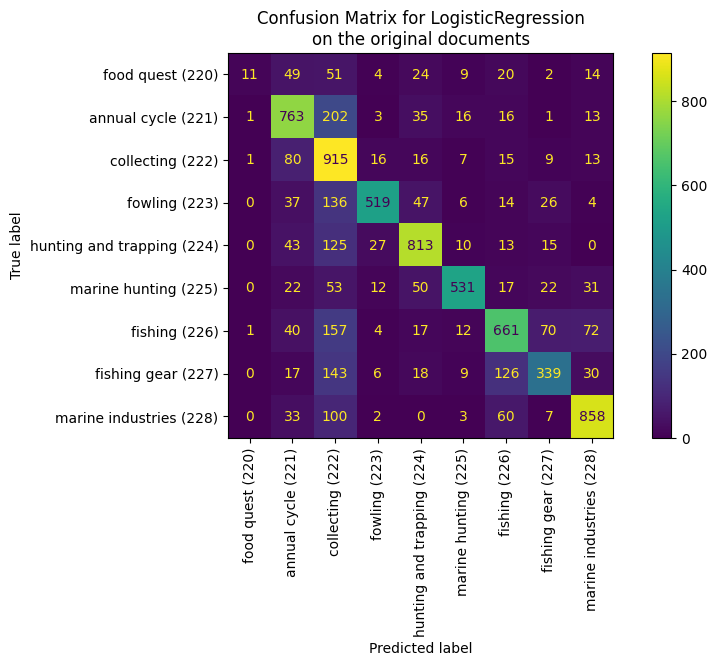

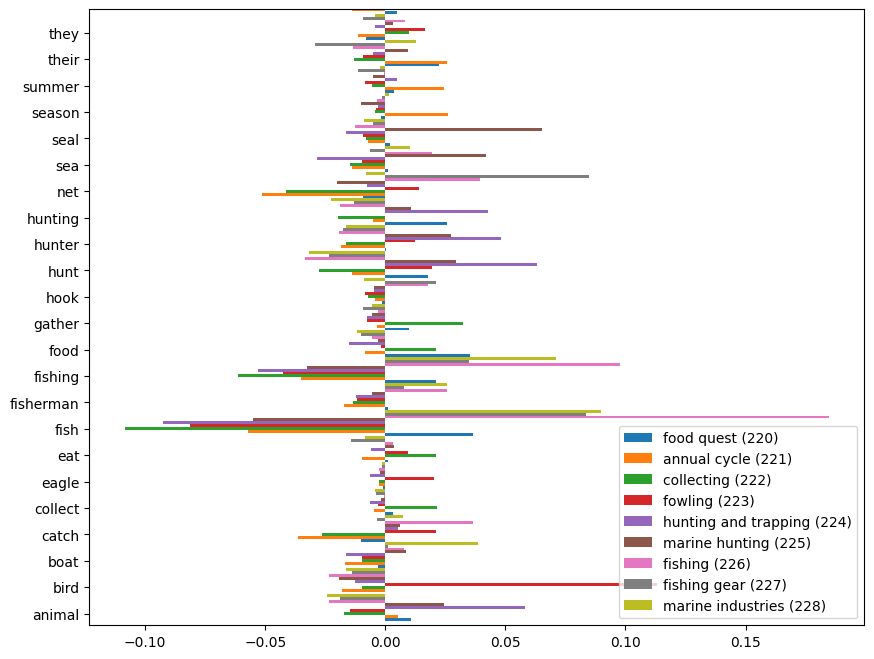

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7091597077244259
              precision    recall  f1-score   support

         220      0.612     0.163     0.258       184
         221      0.739     0.704     0.721      1050
         222      0.495     0.844     0.624      1072
         223      0.840     0.681     0.752       789
         224      0.816     0.768     0.791      1046
         225      0.837     0.771     0.803       738
         226      0.687     0.618     0.651      1034
         227      0.664     0.491     0.565       688
         228      0.839     0.823     0.831      1063

    accuracy                          0.709      7664
   macro avg      0.725     0.651     0.666      7664
weighted avg      0.732     0.709     0.709      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



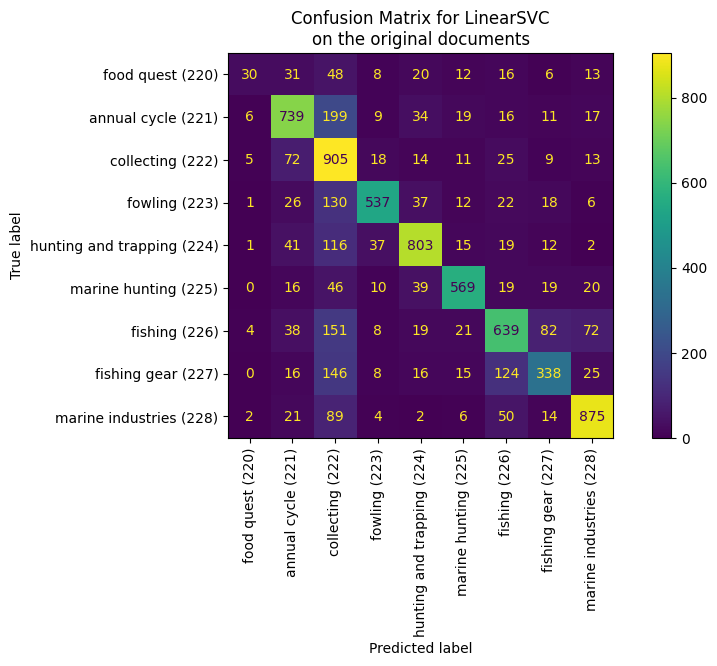

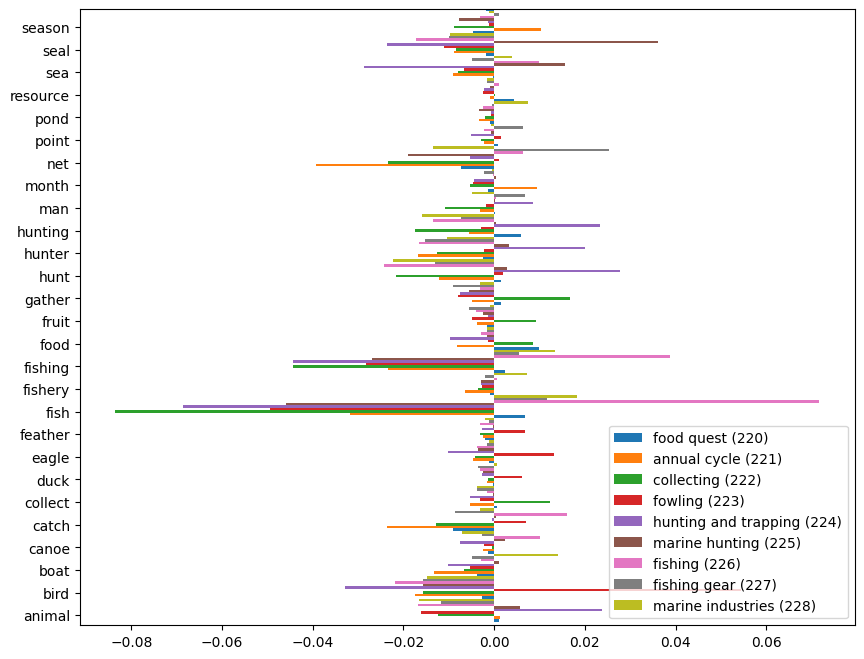

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.662839248434238
              precision    recall  f1-score   support

         220      0.500     0.011     0.021       184
         221      0.684     0.667     0.675      1050
         222      0.463     0.831     0.595      1072
         223      0.864     0.602     0.709       789
         224      0.721     0.782     0.750      1046
         225      0.861     0.682     0.761       738
         226      0.613     0.603     0.608      1034
         227      0.663     0.406     0.503       688
         228      0.784     0.742     0.762      1063

    accuracy                          0.663      7664
   macro avg      0.684     0.592     0.598      7664
weighted avg      0.692     0.663     0.658      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


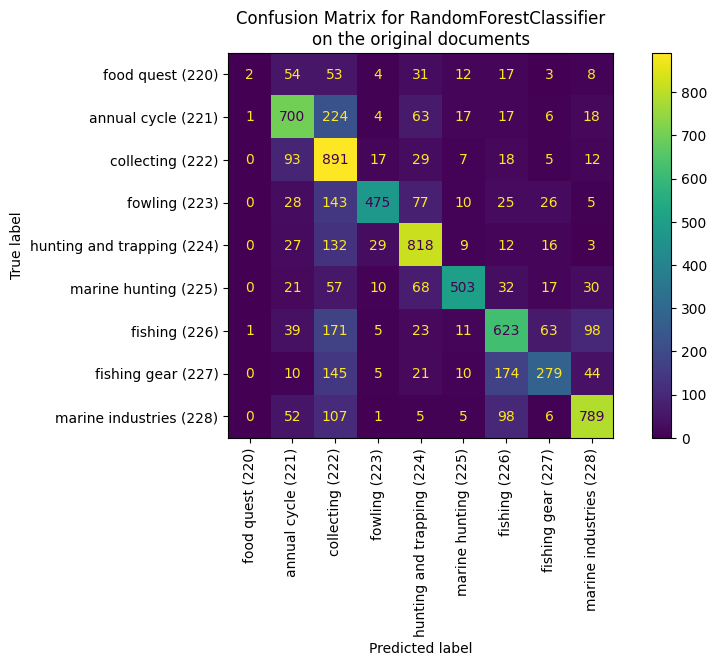

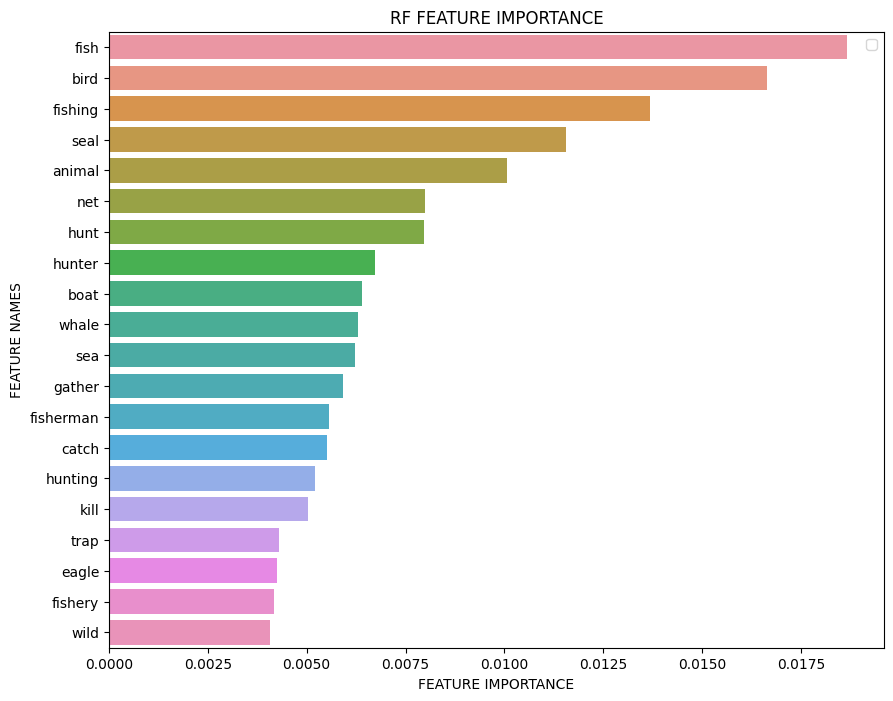

Iteration 2
Exclude: {'eagle', 'fruit', 'fisherman', 'net', 'canoe', 'turtle', 'year', 'hunter', 'trap', 'collect', 'food', 'whale', 'catch', 'they', 'boat', 'month', 'duck', 'winter', 'seal', 'point', 'fish', 'hunt', 'water', 'work', 'hook', 'sea', 'eat', 'resource', 'fishery', 'summer', 'feather', 'animal', 'pond', 'kill', 'man', 'gather', 'bird', 'fishing', 'their', 'wild', 'season', 'hunting'}

(25545,) (25545,)
25545 documents - 13.77MB (training set)
9 categories


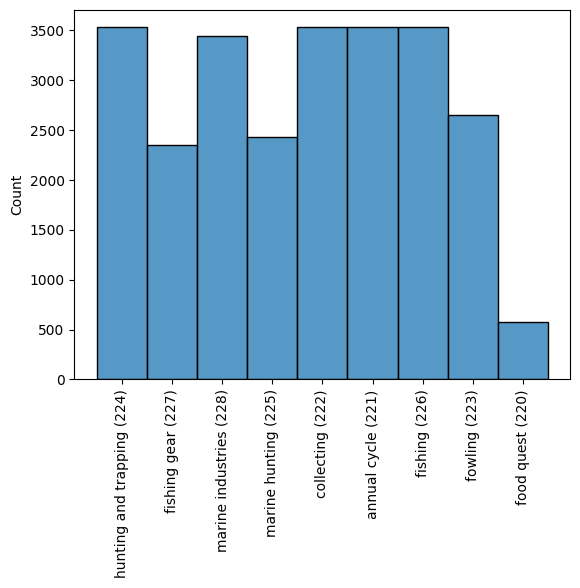

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6480949895615866
              precision    recall  f1-score   support

         220      0.632     0.068     0.122       177
         221      0.687     0.692     0.690      1040
         222      0.448     0.799     0.574      1039
         223      0.758     0.545     0.634       827
         224      0.790     0.703     0.744      1095
         225      0.791     0.639     0.707       718
         226      0.565     0.570     0.567      1025
         227      0.667     0.448     0.536       726
         228      0.760     0.802     0.780      1017

    accuracy                          0.648      7664
   macro avg      0.678     0.585     0.595      7664
weighted avg      0.677     0.648     0.645      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



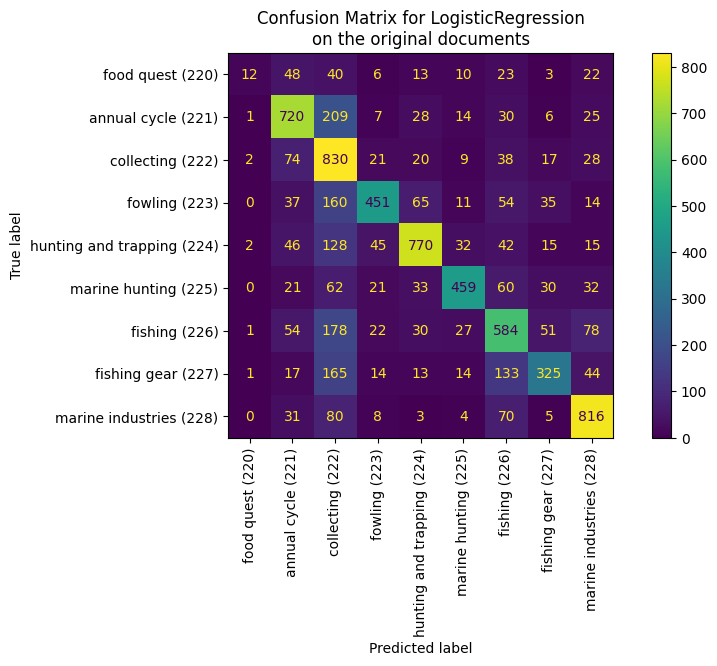

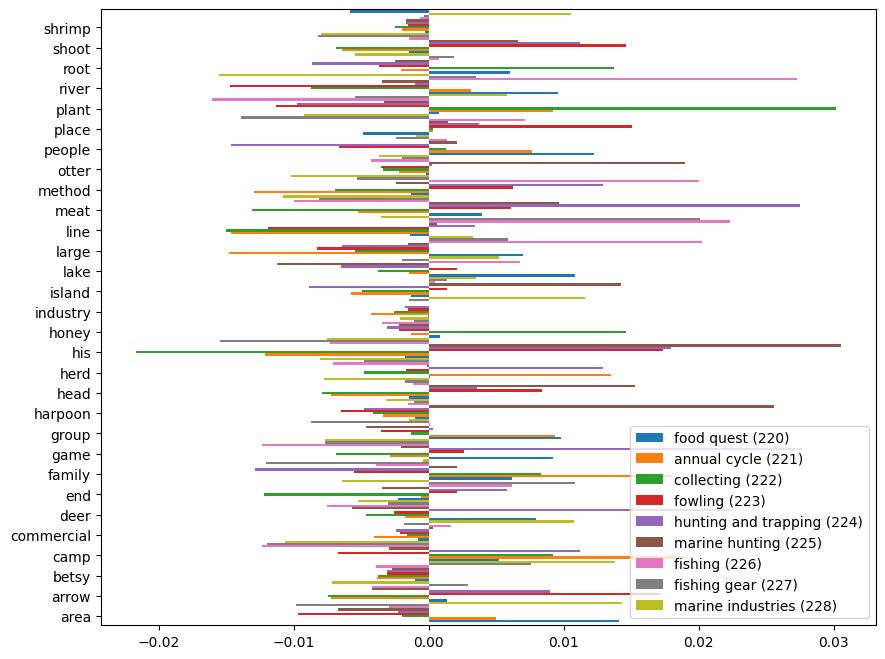

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6436586638830898
              precision    recall  f1-score   support

         220      0.529     0.153     0.237       177
         221      0.434     0.785     0.559      1040
         222      0.718     0.653     0.684      1039
         223      0.731     0.566     0.638       827
         224      0.787     0.701     0.742      1095
         225      0.718     0.684     0.700       718
         226      0.594     0.529     0.559      1025
         227      0.606     0.467     0.528       726
         228      0.790     0.791     0.790      1017

    accuracy                          0.644      7664
   macro avg      0.656     0.592     0.604      7664
weighted avg      0.669     0.644     0.644      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



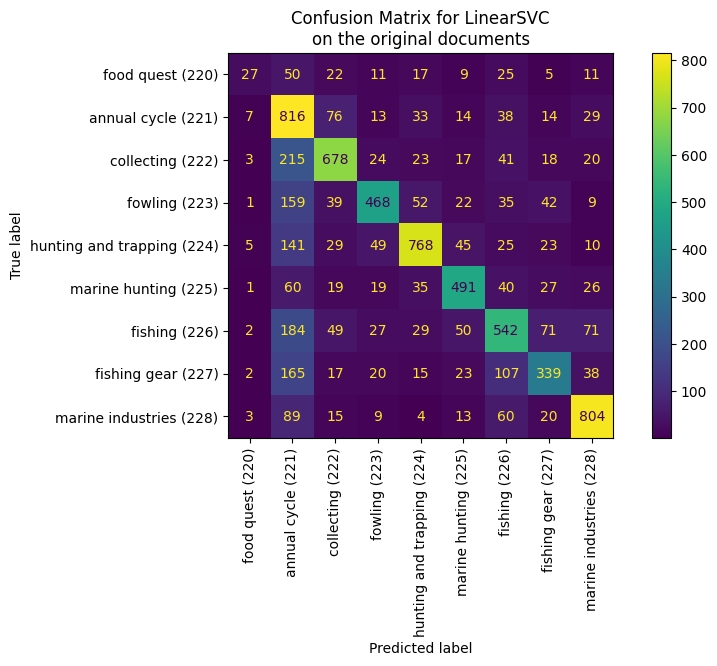

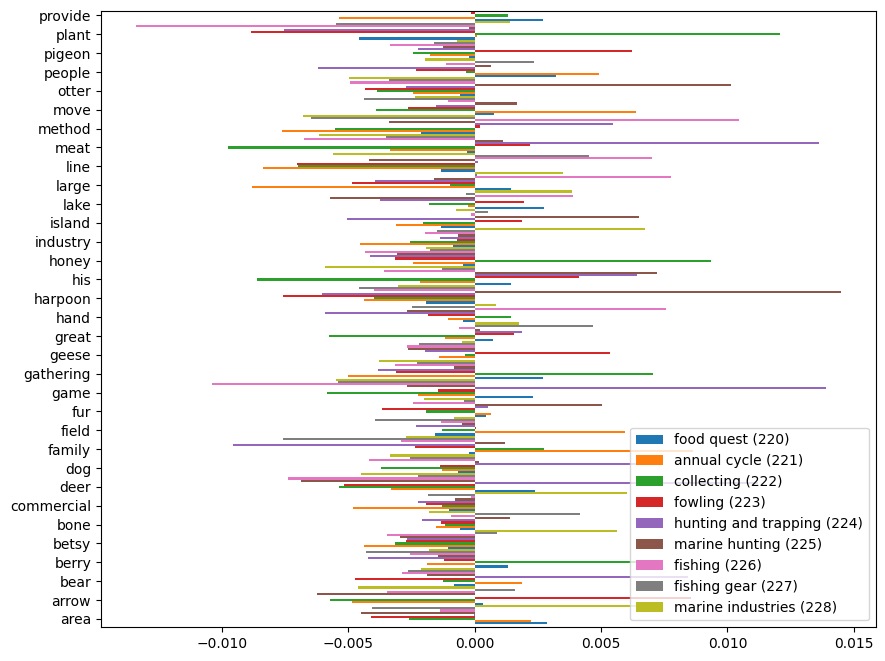

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.5861169102296451
              precision    recall  f1-score   support

         220      0.500     0.006     0.011       177
         221      0.402     0.748     0.523      1040
         222      0.659     0.630     0.644      1039
         223      0.726     0.441     0.549       827
         224      0.655     0.674     0.665      1095
         225      0.729     0.529     0.613       718
         226      0.522     0.494     0.508      1025
         227      0.628     0.382     0.475       726
         228      0.675     0.779     0.723      1017

    accuracy                          0.586      7664
   macro avg      0.611     0.520     0.523      7664
weighted avg      0.615     0.586     0.579      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


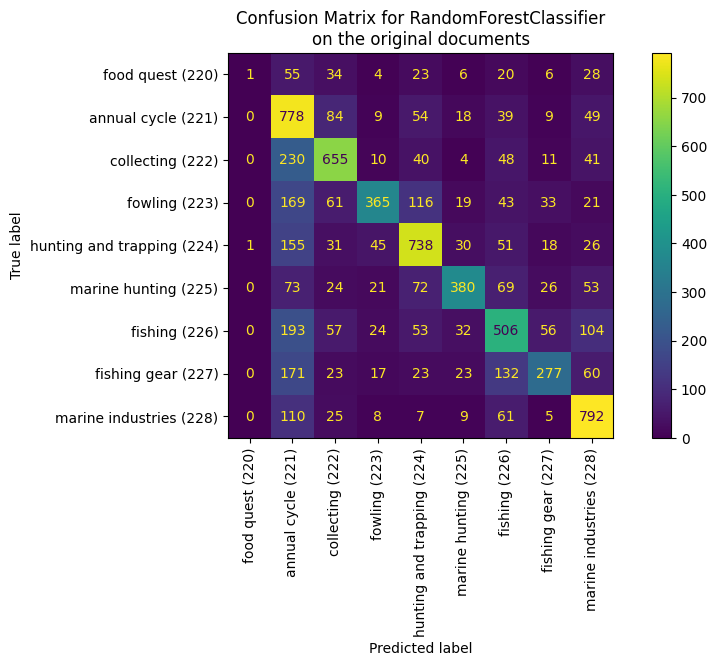

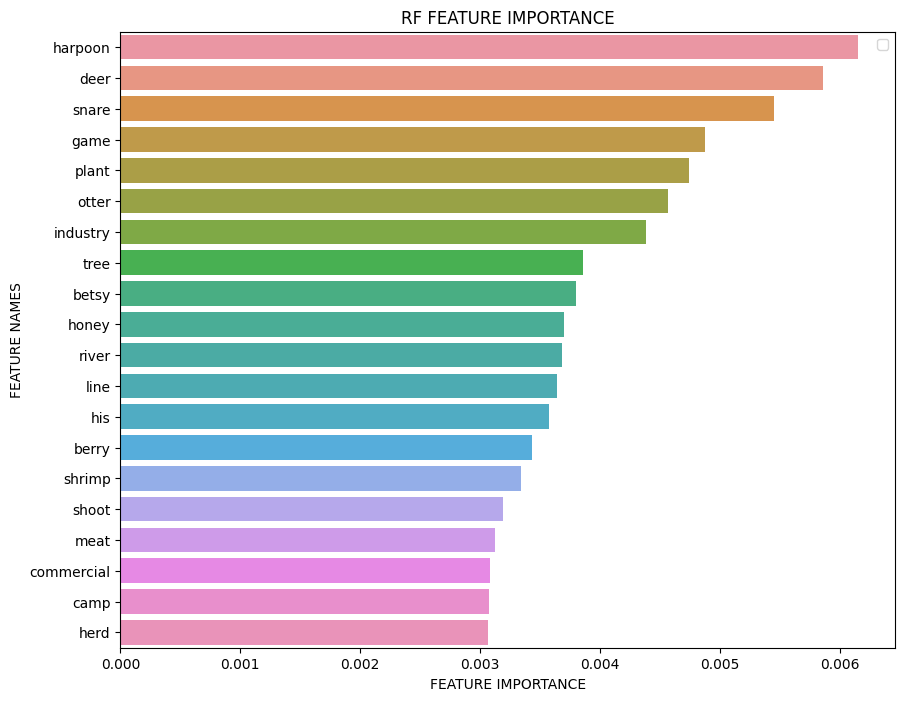

Iteration 3
Exclude: {'village', 'group', 'gathering', 'take', 'move', 'fruit', 'tree', 'net', 'canoe', 'turtle', 'bone', 'otter', 'trap', 'collect', 'food', 'whale', 'snare', 'industry', 'large', 'boat', 'month', 'spear', 'field', 'root', 'people', 'fish', 'pigeon', 'area', 'water', 'work', 'hook', 'island', 'eat', 'resource', 'end', 'woman', 'pond', 'type', 'shoot', 'betsy', 'lake', 'kill', 'gather', 'fishing', 'commercial', 'their', 'wild', 'season', 'hunting', 'shrimp', 'deer', 'eagle', 'dog', 'camp', 'place', 'meat', 'great', 'method', 'berry', 'fisherman', 'year', 'honey', 'hunter', 'catch', 'river', 'time', 'provide', 'they', 'herd', 'his', 'plant', 'duck', 'winter', 'bear', 'seal', 'fur', 'geese', 'point', 'hand', 'sea', 'family', 'head', 'small', 'fishery', 'summer', 'harpoon', 'use', 'feather', 'animal', 'game', 'man', 'bird', 'hunt', 'arrow', 'line'}

(25545,) (25545,)
25545 documents - 13.76MB (training set)
9 categories


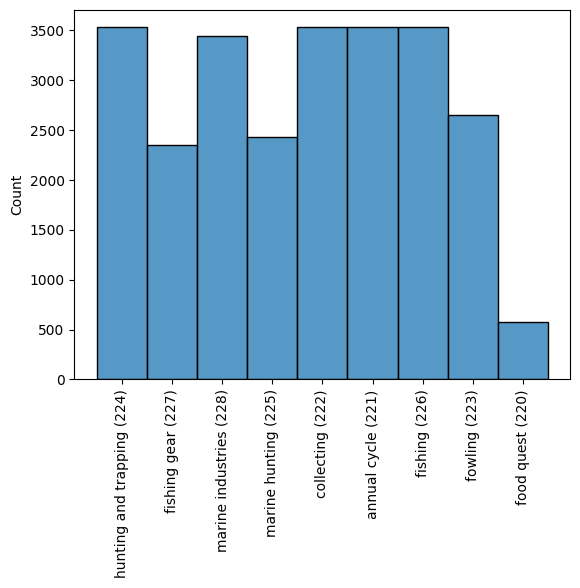

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6316544885177453
              precision    recall  f1-score   support

         220      0.375     0.016     0.031       184
         221      0.691     0.659     0.675      1070
         222      0.450     0.780     0.571      1084
         223      0.689     0.520     0.592       741
         224      0.705     0.678     0.692      1081
         225      0.731     0.609     0.665       706
         226      0.615     0.531     0.570      1109
         227      0.659     0.478     0.554       680
         228      0.735     0.819     0.774      1009

    accuracy                          0.632      7664
   macro avg      0.628     0.565     0.569      7664
weighted avg      0.647     0.632     0.625      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



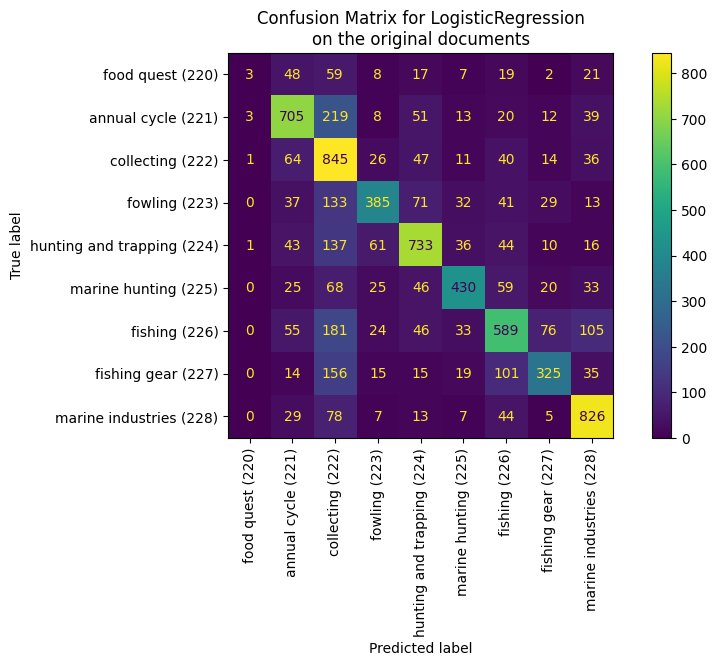

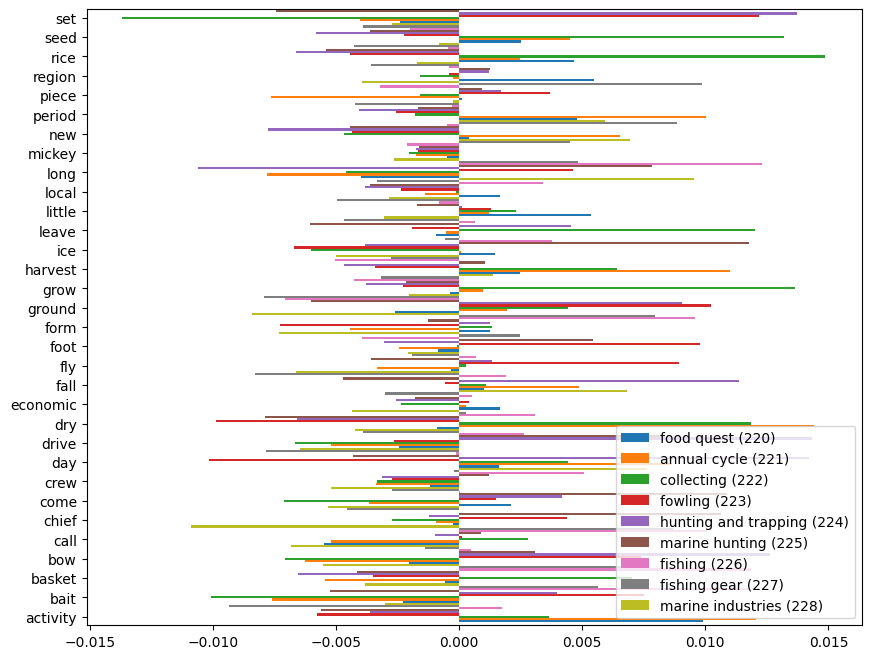

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6259133611691023
              precision    recall  f1-score   support

         220      0.424     0.136     0.206       184
         221      0.683     0.640     0.661      1070
         222      0.448     0.768     0.566      1084
         223      0.672     0.544     0.601       741
         224      0.711     0.654     0.681      1081
         225      0.708     0.627     0.665       706
         226      0.606     0.517     0.558      1109
         227      0.605     0.488     0.540       680
         228      0.775     0.790     0.782      1009

    accuracy                          0.626      7664
   macro avg      0.626     0.574     0.584      7664
weighted avg      0.643     0.626     0.624      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



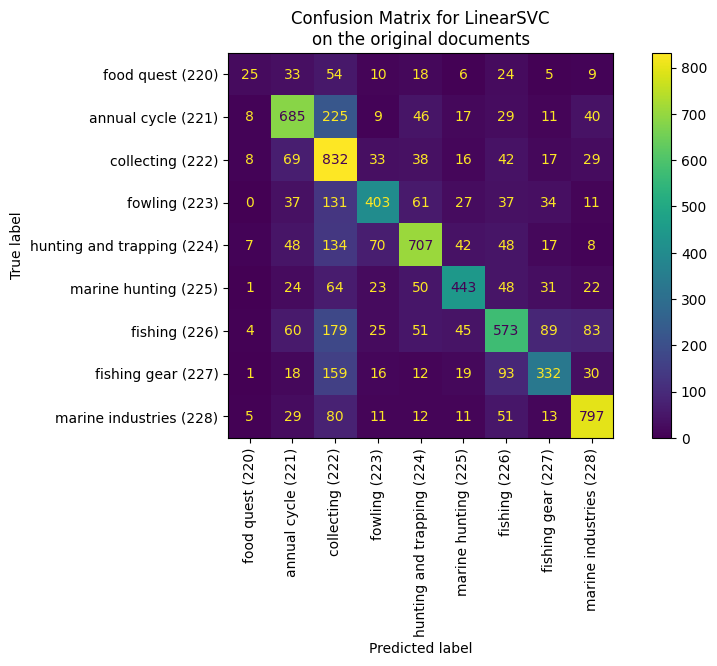

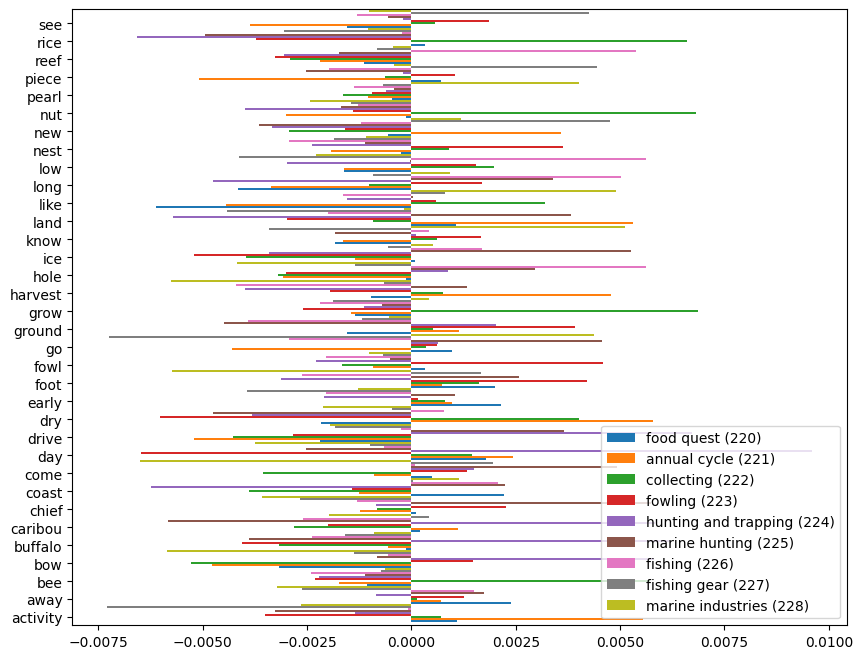

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.5553235908141962
              precision    recall  f1-score   support

         220      0.400     0.011     0.021       184
         221      0.633     0.573     0.601      1070
         222      0.408     0.716     0.520      1084
         223      0.654     0.393     0.491       741
         224      0.562     0.646     0.601      1081
         225      0.690     0.493     0.575       706
         226      0.545     0.440     0.487      1109
         227      0.590     0.400     0.477       680
         228      0.619     0.761     0.683      1009

    accuracy                          0.555      7664
   macro avg      0.567     0.492     0.495      7664
weighted avg      0.574     0.555     0.546      7664



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


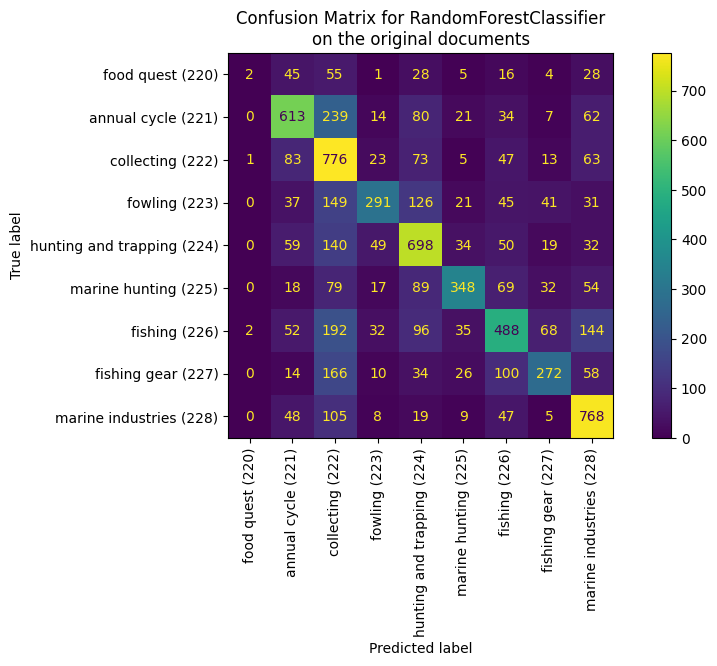

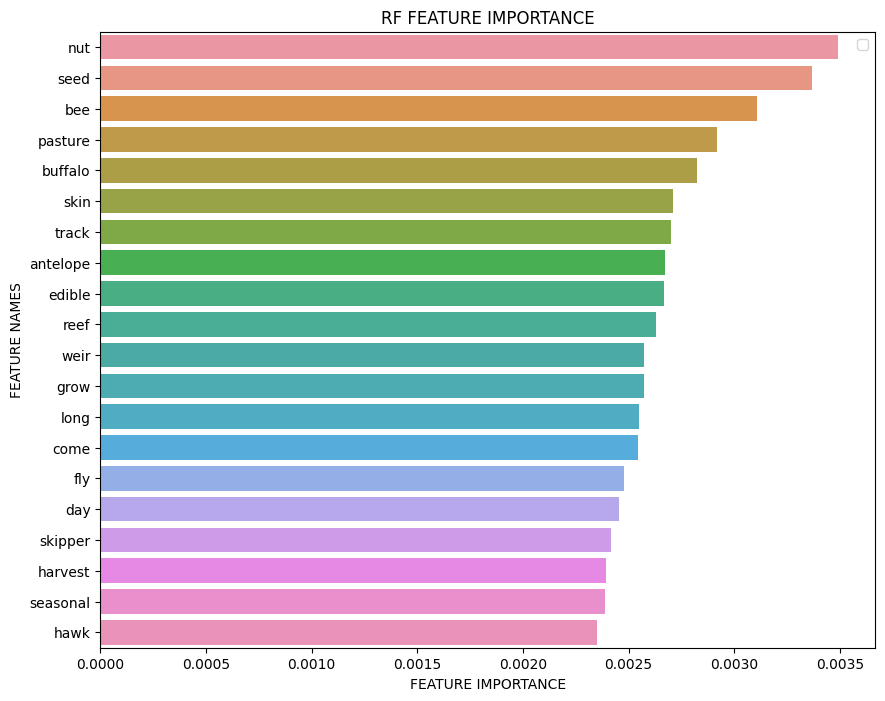

Iteration 1
Exclude: set()

(19442,) (19442,)
19442 documents - 10.85MB (training set)
10 categories


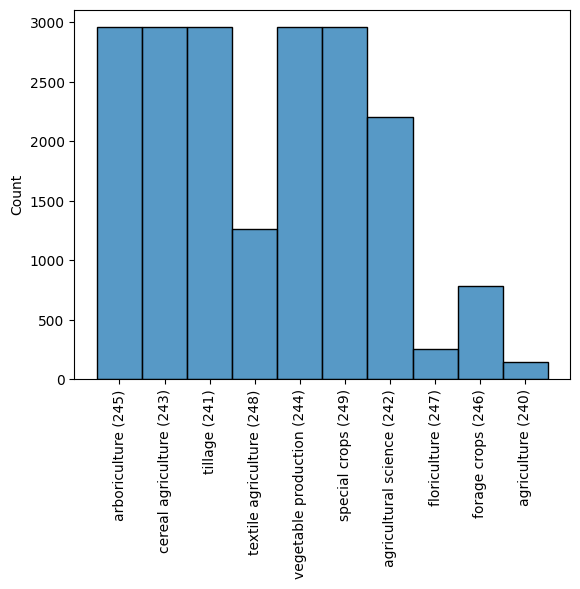

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6332933310474884
              precision    recall  f1-score   support

         240      0.000     0.000     0.000        39
         241      0.574     0.502     0.535       901
         242      0.725     0.622     0.670       675
         243      0.440     0.790     0.565       870
         244      0.673     0.638     0.655       889
         245      0.751     0.733     0.742       886
         246      0.876     0.467     0.609       227
         247      0.800     0.143     0.242        84
         248      0.871     0.521     0.652       374
         249      0.724     0.682     0.703       888

    accuracy                          0.633      5833
   macro avg      0.643     0.510     0.537      5833
weighted avg      0.666     0.633     0.633      5833



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI b

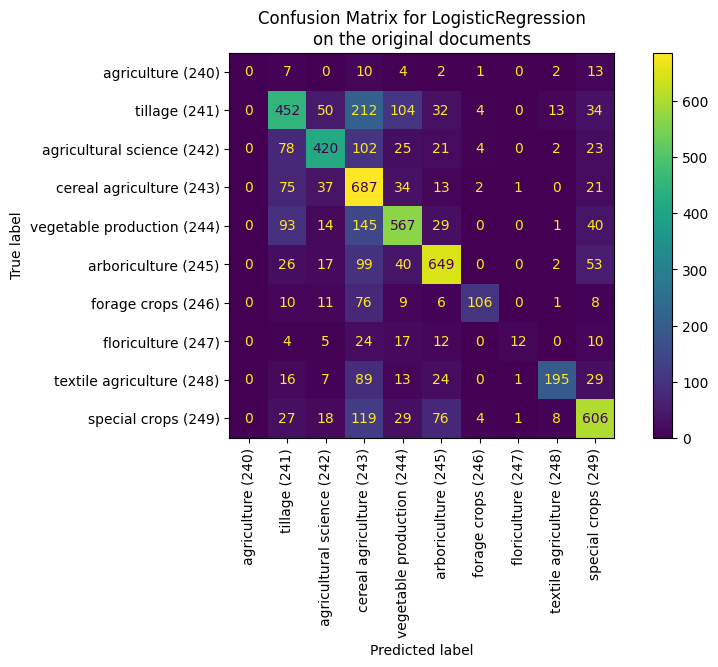

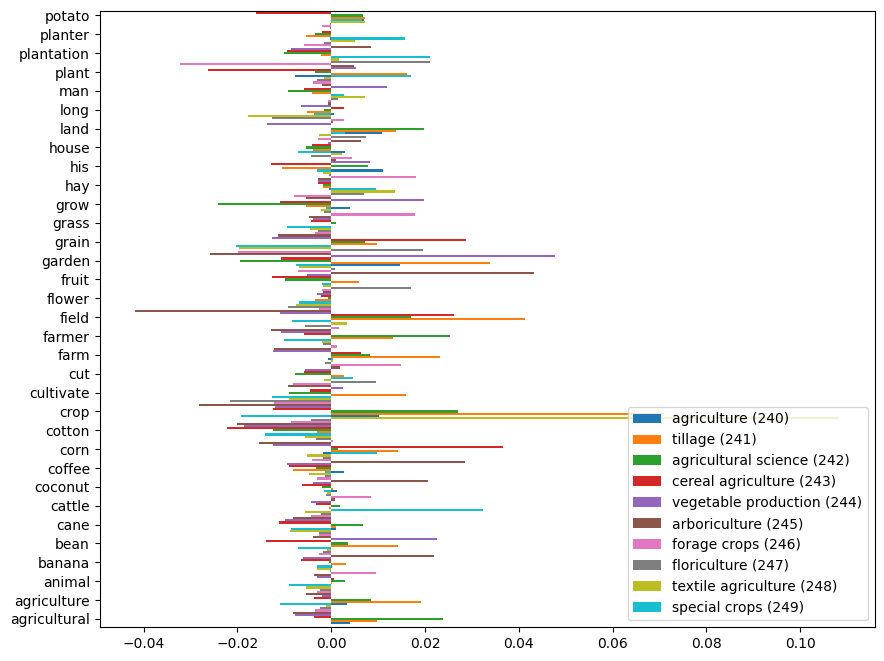

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6288359334819132
              precision    recall  f1-score   support

         240      0.875     0.179     0.298        39
         241      0.576     0.493     0.531       901
         242      0.702     0.604     0.650       675
         243      0.435     0.767     0.555       870
         244      0.664     0.611     0.636       889
         245      0.736     0.712     0.724       886
         246      0.787     0.520     0.626       227
         247      0.722     0.310     0.433        84
         248      0.811     0.610     0.696       374
         249      0.746     0.671     0.707       888

    accuracy                          0.629      5833
   macro avg      0.705     0.548     0.586      5833
weighted avg      0.661     0.629     0.632      5833



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



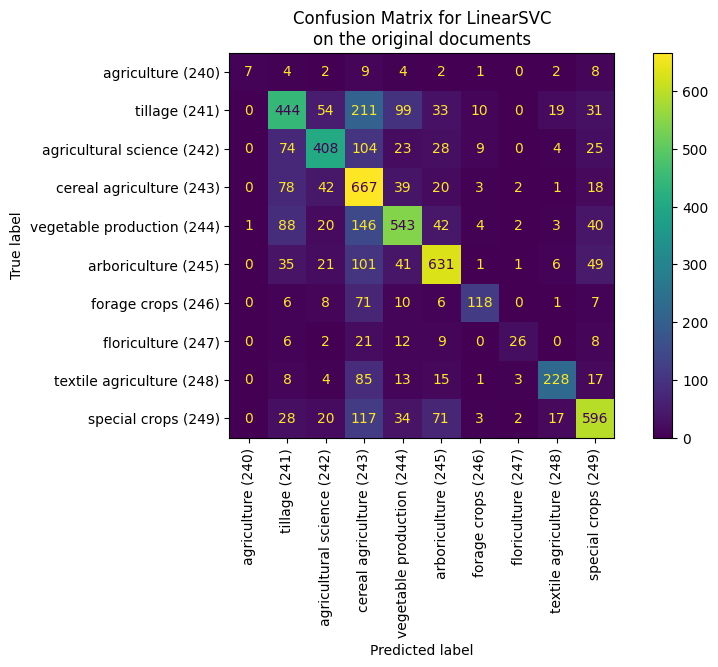

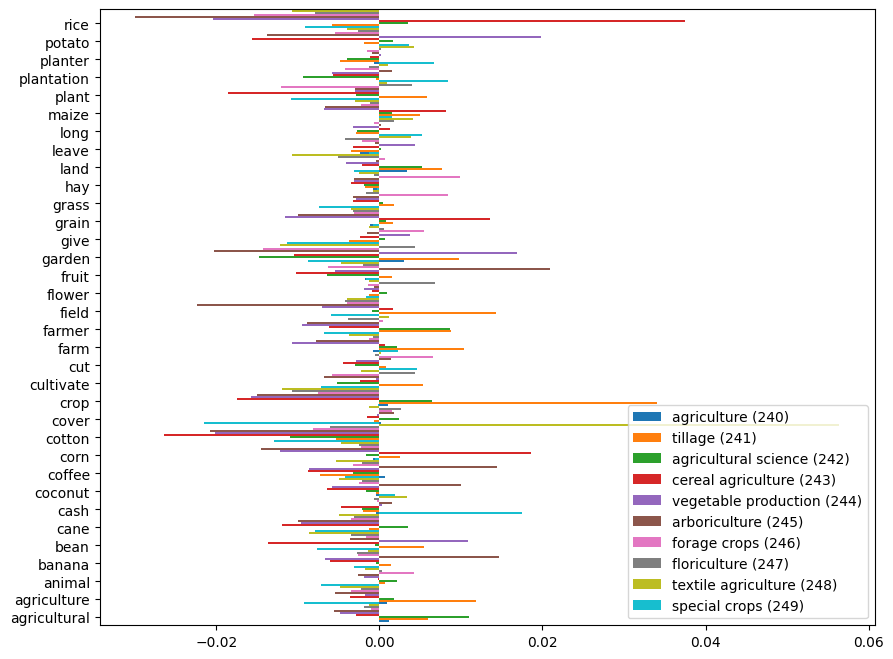

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.60483456197497
              precision    recall  f1-score   support

         240      0.000     0.000     0.000        39
         241      0.526     0.455     0.488       901
         242      0.697     0.498     0.581       675
         243      0.425     0.787     0.552       870
         244      0.672     0.628     0.649       889
         245      0.690     0.721     0.705       886
         246      0.816     0.507     0.625       227
         247      0.720     0.214     0.330        84
         248      0.845     0.527     0.649       374
         249      0.707     0.642     0.673       888

    accuracy                          0.605      5833
   macro avg      0.610     0.498     0.525      5833
weighted avg      0.637     0.605     0.604      5833



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI b

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


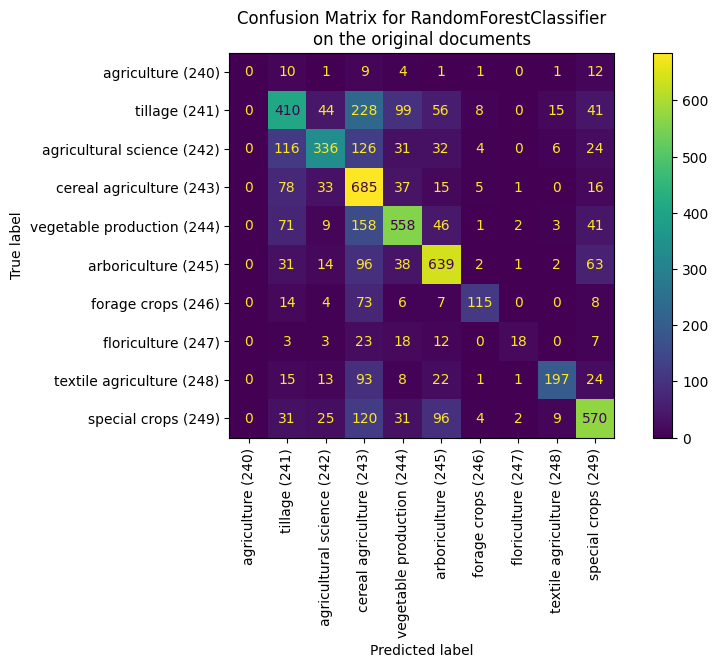

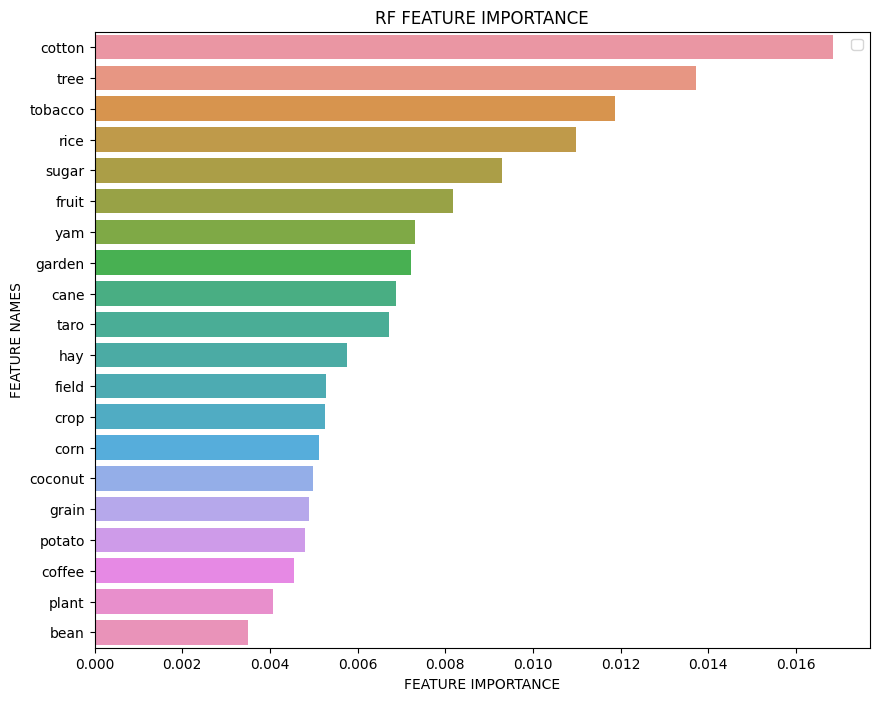

Iteration 2
Exclude: {'village', 'cover', 'cultivate', 'bean', 'land', 'cut', 'give', 'long', 'rubber', 'coffee', 'fruit', 'hay', 'tree', 'tobacco', 'corn', 'garden', 'grass', 'farm', 'his', 'plant', 'cash', 'field', 'cattle', 'flower', 'rice', 'potato', 'seed', 'crop', 'farmer', 'plantation', 'small', 'coconut', 'planter', 'maize', 'banana', 'woman', 'soil', 'animal', 'agriculture', 'yam', 'agricultural', 'cotton', 'sugar', 'man', 'grow', 'leave', 'taro', 'house', 'grain', 'cane'}

(19442,) (19442,)
19442 documents - 10.89MB (training set)
10 categories


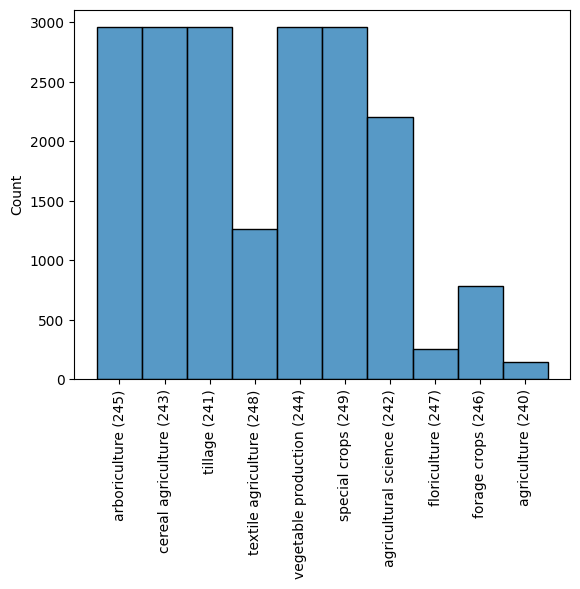

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



KeyboardInterrupt: 

In [14]:
results = defaultdict(dict)
for b in [True, False]:
    print('\n\nBalanced:', b)
    for i in [220, 240]:
        curr_results = iterative_process(common_indicators=False,
                                    models=['LR', 'SVM', 'RF'], 
                                    specific_cat=i, exact=False, 
                                    balanced=b,
                                    verbose=True)
        results[f'{i}_{"balanced" if b else "imbalanced"}'] = curr_results
        

In [ ]:
results

- categorize features for each culture
- measure the sim between cultures based on these categories?
- this would allow comparing cultures based on the sim of these features across cultures based on some threshold (e.g. tfidf)
- they indicate the levels/types of the usage/facts of these cultures;
    - e.g. one culture is more advanced in using tools
    - e.g. en